In [2]:
import pandas as pd
import numpy as np

import tqdm

import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv('online_shoppers_intention (1).csv')

In [18]:
df.head(1)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False


In [129]:
df.shape

(12330, 18)

In [130]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


<AxesSubplot:>

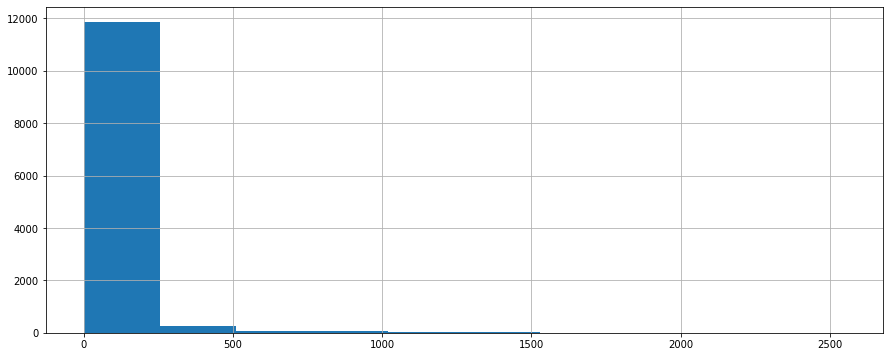

In [3]:
df['Informational_Duration'].hist(figsize=(15, 6))

In [5]:
col1=['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType',
       'Weekend', 'Revenue']

col = df.columns
u=df.nunique()

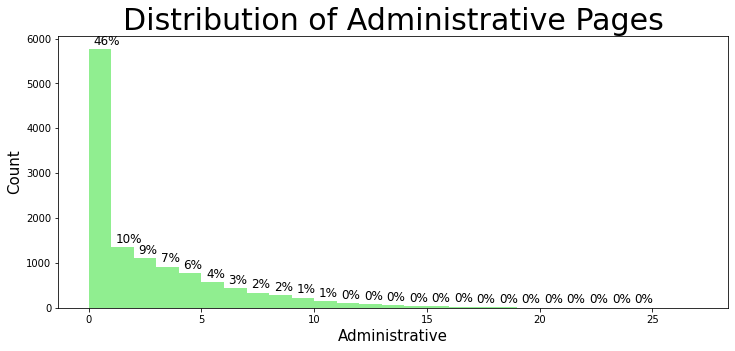

In [6]:
df["Administrative"].value_counts()
plt.rcParams['figure.figsize'] = (12, 5)
yval=df["Administrative"].value_counts()
plt.subplot(1, 1, 1)
plt.hist(df[col[0]], color = 'lightgreen',bins=27)
plt.title('Distribution of Administrative Pages',fontsize = 30)
plt.xlabel('Administrative', fontsize = 15)
plt.ylabel('Count', fontsize = 15)
xval=0.2
for i in range(u[0]-2):
    plt.text(x=xval,y=yval[i]+100,s=str(yval[i]*100//12330)+'%',fontsize=12)
    xval+=1
plt.savefig('distribution_of_admin_pages')

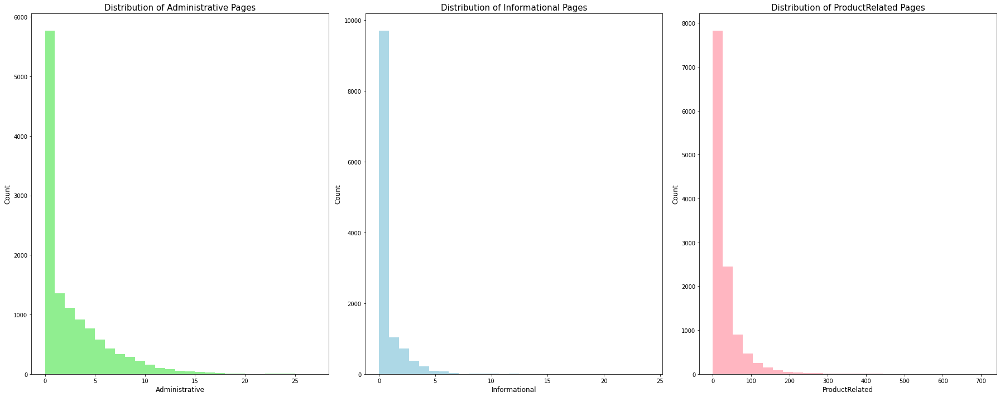

In [15]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.hist(df["Administrative"], color='lightgreen', bins=27)
plt.title('Distribution of Administrative Pages', fontsize=15)
plt.xlabel('Administrative', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.subplot(1, 3, 2)
plt.hist(df["Informational"], color='lightblue', bins=27)
plt.title('Distribution of Informational Pages', fontsize=15)
plt.xlabel('Informational', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.subplot(1, 3, 3)
plt.hist(df["ProductRelated"], color='lightpink', bins=27)
plt.title('Distribution of ProductRelated Pages', fontsize=15)
plt.xlabel('ProductRelated', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.tight_layout()
plt.savefig('distribution_of_pages.png')
plt.show()

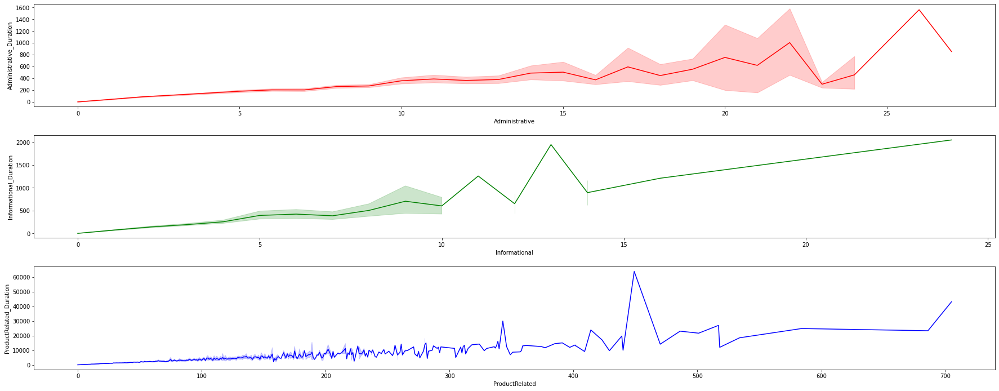

In [30]:
fig, ax = plt.subplots(3, 1, figsize=(25, 10))
sns.lineplot(data=df, x='Administrative', y='Administrative_Duration', ax=ax[0], color='red')
sns.lineplot(data=df, x='Informational', y='Informational_Duration', ax=ax[1], color='green')
sns.lineplot(data=df, x='ProductRelated', y='ProductRelated_Duration', ax=ax[2], color='blue')
plt.tight_layout(pad=2)
plt.savefig('pages_vs_duration.png')
plt.show()

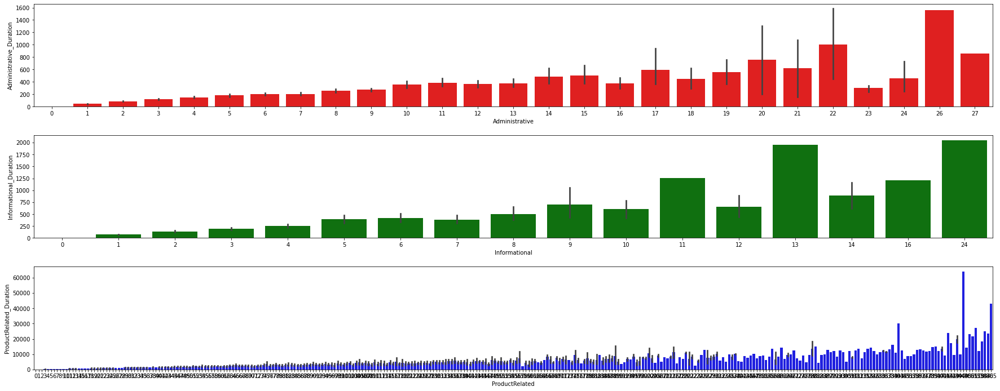

In [31]:
fig, ax = plt.subplots(3, 1, figsize=(25, 10))
sns.barplot(data=df, x='Administrative', y='Administrative_Duration', ax=ax[0], color='red')
sns.barplot(data=df, x='Informational', y='Informational_Duration', ax=ax[1], color='green')
sns.barplot(data=df, x='ProductRelated', y='ProductRelated_Duration', ax=ax[2], color='blue')
plt.tight_layout(pad=2)
plt.savefig('pages_vs_duration.png')
plt.show()

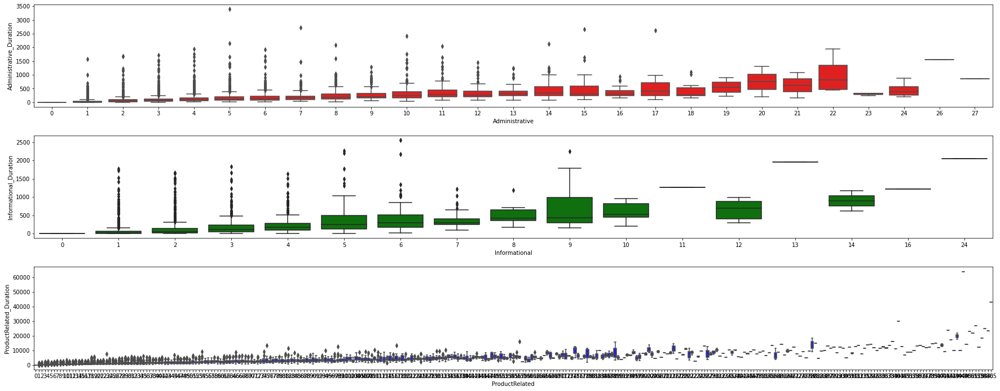

In [32]:
fig, ax = plt.subplots(3, 1, figsize=(25, 10))
sns.boxplot(data=df, x='Administrative', y='Administrative_Duration', ax=ax[0], color='red')
sns.boxplot(data=df, x='Informational', y='Informational_Duration', ax=ax[1], color='green')
sns.boxplot(data=df, x='ProductRelated', y='ProductRelated_Duration', ax=ax[2], color='blue')
plt.tight_layout(pad=2)
plt.savefig('pages_vs_duration.png')
plt.show()

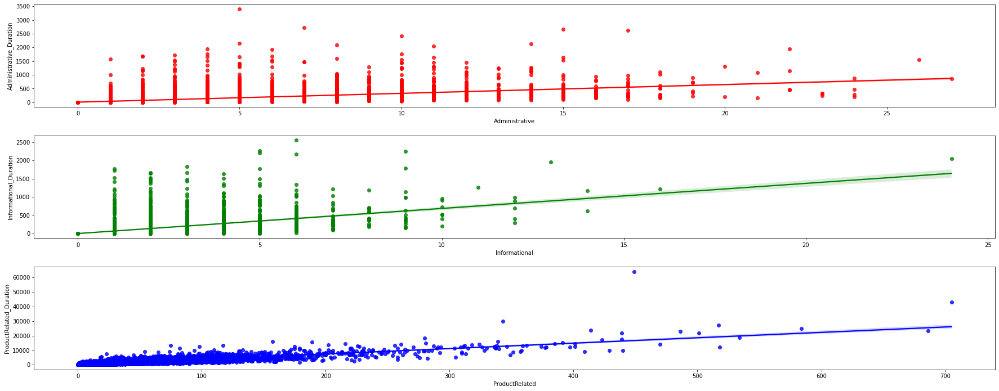

In [42]:
fig, ax = plt.subplots(3, 1, figsize=(25, 10))
sns.regplot(data=df, x='Administrative', y='Administrative_Duration', ax=ax[0], color='red')
sns.regplot(data=df, x='Informational', y='Informational_Duration', ax=ax[1], color='green')
sns.regplot(data=df, x='ProductRelated', y='ProductRelated_Duration', ax=ax[2], color='blue')
plt.tight_layout(pad=2)
plt.savefig('pages_vs_duration.png')
plt.show()

In [36]:
df[['Administrative', 'Administrative_Duration']].corr()

,Administrative,Administrative_Duration
Administrative,1.000000,0.601583
Administrative_Duration,0.601583,1.000000


In [35]:
df[['Informational', 'Informational_Duration']].corr()

,Informational,Informational_Duration
Informational,1.000000,0.618955
Informational_Duration,0.618955,1.000000


In [37]:
df[['ProductRelated', 'ProductRelated_Duration']].corr()

,ProductRelated,ProductRelated_Duration
ProductRelated,1.000000,0.860927
ProductRelated_Duration,0.860927,1.000000


We see that 

In [7]:
df.groupby('Informational')[['Informational_Duration', 'Revenue']].agg(['mean', 'median', 'count'])

Informational_Duration                      Revenue             
                                mean       median count      mean median count
Informational                                                                 
0                           0.000000     0.000000  9699  0.133519    0.0  9699
1                          71.722026    23.500000  1041  0.226705    0.0  1041
2                         139.893776    55.500000   728  0.211538    0.0   728
3                         191.954830   110.875000   380  0.244737    0.0   380
4                         254.289898   164.833333   222  0.279279    0.0   222
5                         393.518207   242.750000    99  0.313131    0.0    99
6                         422.321253   289.500000    78  0.217949    0.0    78
7                         385.579782   299.966667    36  0.166667    0.0    36
8                         503.889031   412.750000    14  0.285714    0.0    14
9                         705.293704   435.450000    15  0.400000    0.0    15
10                        602.566667   518.250000     7  0.285714    0.0     7
11                       1258.833333  1258.833333     1  0.000000    0.0     1
12                        651.145476   689.833333     5  0.400000    0.0     5
13                       1949.166667  1949.166667     1  0.000000    0.0     1
14                        893.783334   893.783334     2  0.000000    0.0     2
16                       1210.397619  1210.397619     1  0.000000    0.0     1
24                       2050.433333  2050.433333     1  0.000000    0.0     1

In [10]:
gb_prod_rev = df.groupby('ProductRelated')['Revenue'].value_counts(normalize=True).unstack()
gb_prod_rev

Revenue,False,True
ProductRelated,,
0,0.842105,0.157895
1,0.979100,0.020900
2,0.956989,0.043011
3,0.945415,0.054585
4,0.955446,0.044554
...,...,...
518,1.000000,NaN
534,NaN,1.000000
584,1.000000,NaN


array([[<AxesSubplot:title={'center':'Administrative'}>,
        <AxesSubplot:title={'center':'Administrative_Duration'}>,
        <AxesSubplot:title={'center':'Informational'}>,
        <AxesSubplot:title={'center':'Informational_Duration'}>],
       [<AxesSubplot:title={'center':'ProductRelated'}>,
        <AxesSubplot:title={'center':'ProductRelated_Duration'}>,
        <AxesSubplot:title={'center':'BounceRates in %'}>,
        <AxesSubplot:title={'center':'ExitRates in %'}>],
       [<AxesSubplot:title={'center':'PageValues'}>,
        <AxesSubplot:title={'center':'SpecialDay (probability)'}>,
        <AxesSubplot:title={'center':'OperatingSystems'}>,
        <AxesSubplot:title={'center':'Browser'}>],
       [<AxesSubplot:title={'center':'Region'}>,
        <AxesSubplot:title={'center':'TrafficType'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

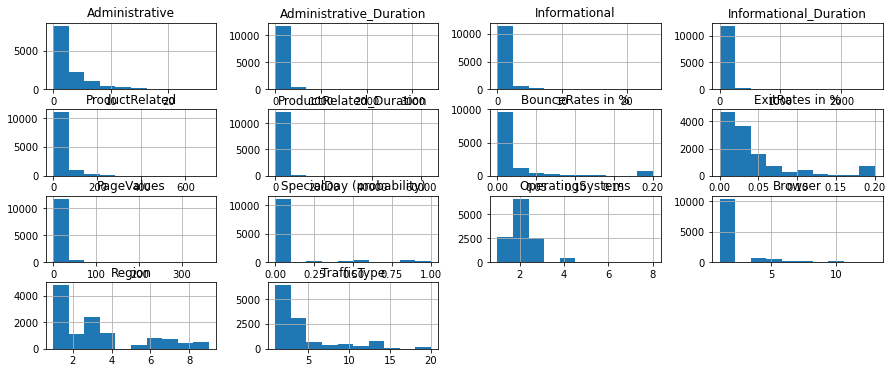

In [5]:
df.hist(figsize=(15, 6))

<AxesSubplot:xlabel='ProductRelated'>

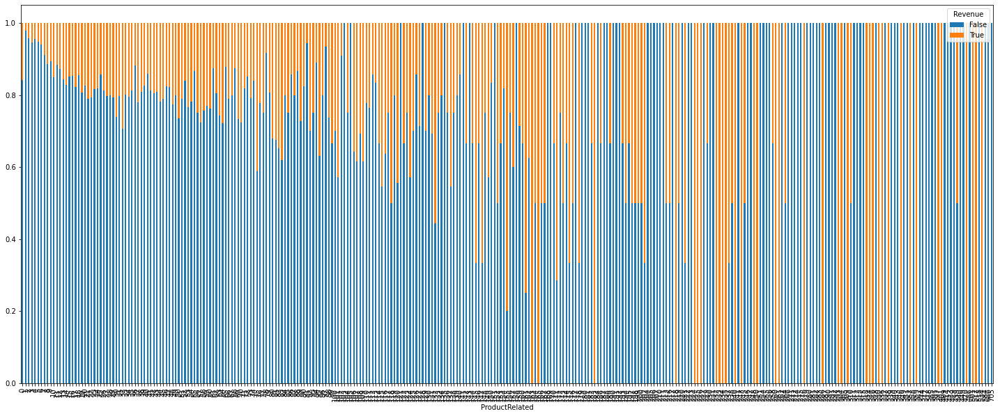

In [12]:
gb_prod_rev.plot(kind='bar', stacked=True, figsize=(25, 10))

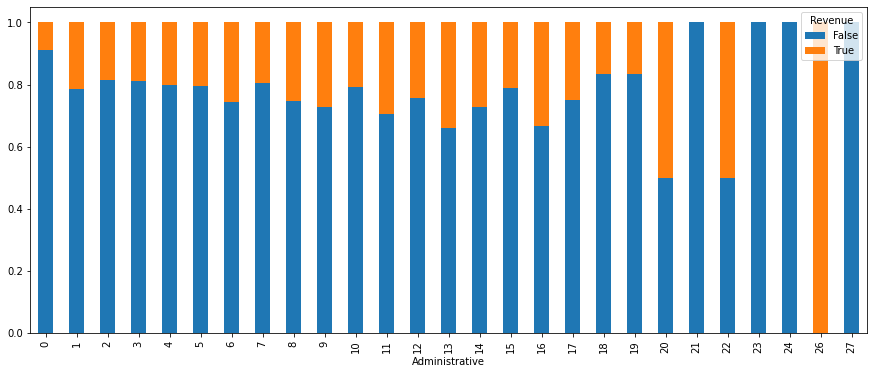

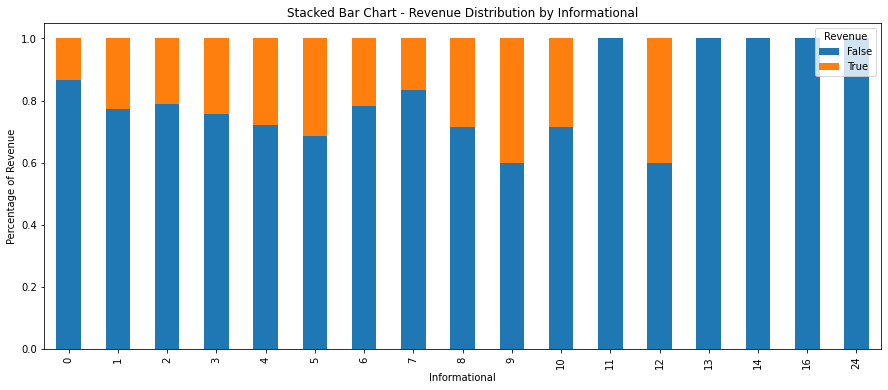

In [49]:
import matplotlib.pyplot as plt
import pandas as pd

gb_admin_rev = df.groupby('Administrative')['Revenue'].value_counts(normalize=True).unstack()
gb_info_rev = df.groupby('Informational')['Revenue'].value_counts(normalize=True).unstack()

gb_admin_rev.plot(kind='bar', stacked=True, figsize=(15, 6))
gb_info_rev.plot(kind='bar', stacked=True, figsize=(15, 6))
plt.title('Stacked Bar Chart - Revenue Distribution by Informational')
plt.xlabel('Informational')
plt.ylabel('Percentage of Revenue')
plt.legend(title='Revenue', loc='upper right')
plt.show()

<AxesSubplot:xlabel='Administrative', ylabel='Administrative_Duration'>

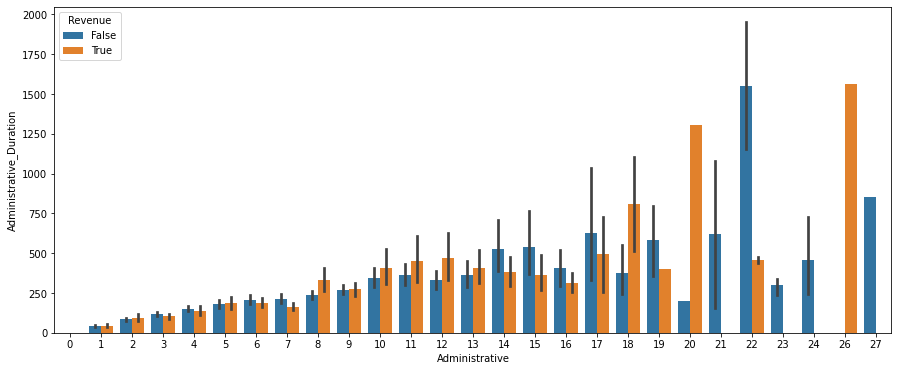

In [7]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='Administrative', y='Administrative_Duration', hue='Revenue')

In [8]:
df[['Administrative', 'Administrative_Duration']].plot(kind='bar', stacked=True, color=['steelblue', 'red'])

<AxesSubplot:>

Error in callback <function flush_figures at 0x000001E8EA4B7910> (for post_execute):


KeyboardInterrupt: 

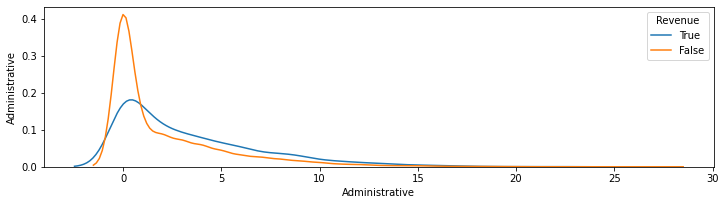

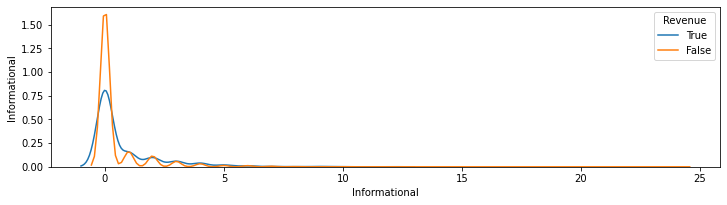

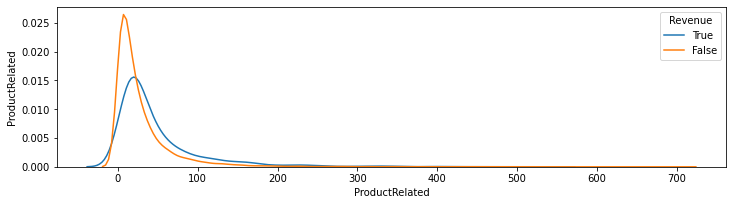

In [57]:
plt.figure(figsize=(12,10))

ax1 = plt.subplot(311)
sns.kdeplot(df[df.Revenue == True].Administrative)
sns.kdeplot(df[df.Revenue == False].Administrative)
plt.ylabel('Administrative')
plt.legend(title='Revenue', loc='upper right', labels=['True', 'False'])

plt.figure(figsize=(12,10))
ax2 = plt.subplot(312)
sns.kdeplot(df[df.Revenue == True].Informational)
sns.kdeplot(df[df.Revenue == False].Informational)
plt.ylabel('Informational')
plt.legend(title='Revenue', loc='upper right', labels=['True', 'False'])
plt.show()

plt.figure(figsize=(12,10))
ax3 = plt.subplot(313)
sns.kdeplot(df[df.Revenue == True].ProductRelated)
sns.kdeplot(df[df.Revenue == False].ProductRelated)
plt.ylabel('ProductRelated')
plt.legend(title='Revenue', loc='upper right', labels=['True', 'False'])

plt.savefig('sesssion_with_revenue.png')
plt.show()

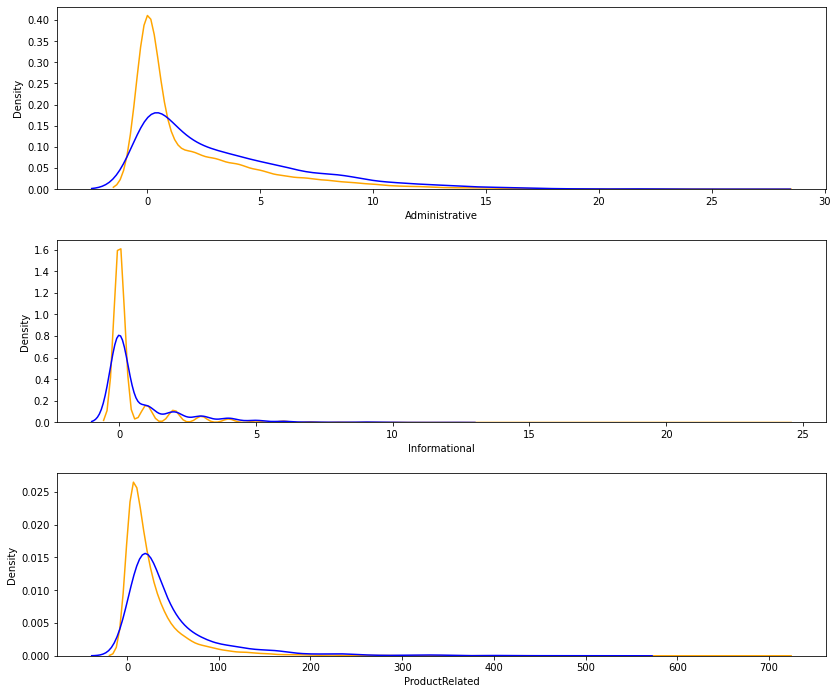

In [75]:
fig, ax = plt.subplots(3, 1, figsize=(12, 10))
sns.kdeplot(df[df['Revenue'] == False].Administrative, ax=ax[0], color='orange')
sns.kdeplot(df[df['Revenue'] == True].Administrative, ax=ax[0], color='blue')
sns.kdeplot(df[df['Revenue'] == False].Informational, ax=ax[1], color='orange')
sns.kdeplot(df[df['Revenue'] == True].Informational, ax=ax[1], color='blue')
sns.kdeplot(df[df['Revenue'] == False].ProductRelated, ax=ax[2], color='orange')
sns.kdeplot(df[df['Revenue'] == True].ProductRelated, ax=ax[2], color='blue')
plt.tight_layout(pad=2)
plt.savefig('sesssion_with_revenue.png')
plt.show()

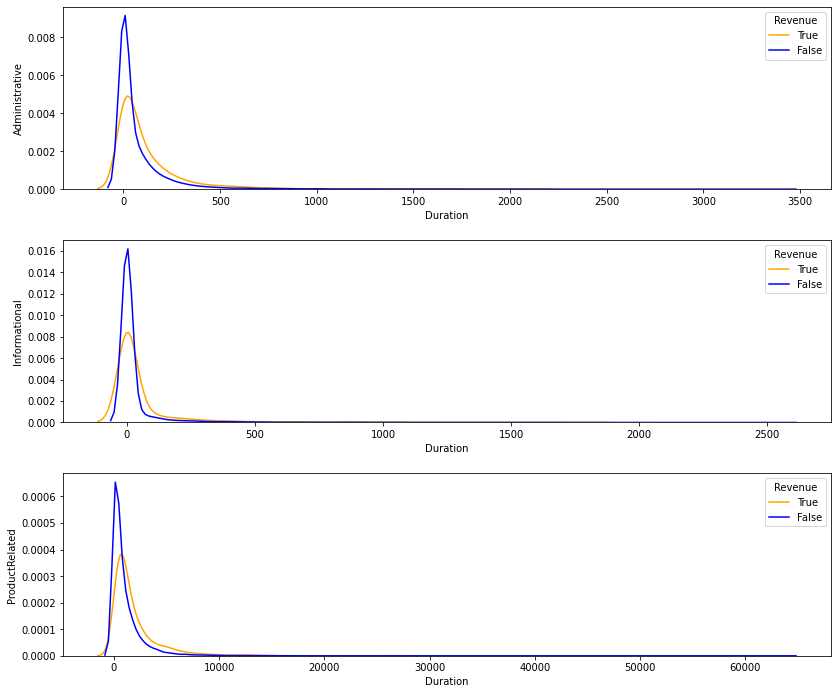

In [4]:
fig, ax = plt.subplots(3, 1, figsize=(12, 10))
sns.kdeplot(df[df['Revenue'] == True].Administrative_Duration, ax=ax[0], color='orange')
sns.kdeplot(df[df['Revenue'] == False].Administrative_Duration, ax=ax[0], color='blue')
ax[0].set_ylabel('Administrative')
ax[0].set_xlabel('Duration')
ax[0].legend(title='Revenue', loc='upper right', labels=['True', 'False'])

sns.kdeplot(df[df['Revenue'] == True].Informational_Duration, ax=ax[1], color='orange')
sns.kdeplot(df[df['Revenue'] == False].Informational_Duration, ax=ax[1], color='blue')
ax[1].set_ylabel('Informational')
ax[1].set_xlabel('Duration')
ax[1].legend(title='Revenue', loc='upper right', labels=['True', 'False'])

sns.kdeplot(df[df['Revenue'] == True].ProductRelated_Duration, ax=ax[2], color='orange')
sns.kdeplot(df[df['Revenue'] == False].ProductRelated_Duration, ax=ax[2], color='blue')
ax[2].set_ylabel('ProductRelated')
ax[2].set_xlabel('Duration')
ax[2].legend(title='Revenue', loc='upper right', labels=['True', 'False'])

plt.tight_layout(pad=2)
plt.savefig('distribution_of_session_with_revenue_1.png')
plt.show()

<AxesSubplot:xlabel='Administrative_Duration', ylabel='Administrative'>

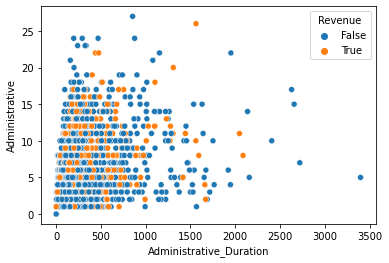

In [5]:
sns.scatterplot(data=df, x='Administrative_Duration', y='Administrative', hue='Revenue')

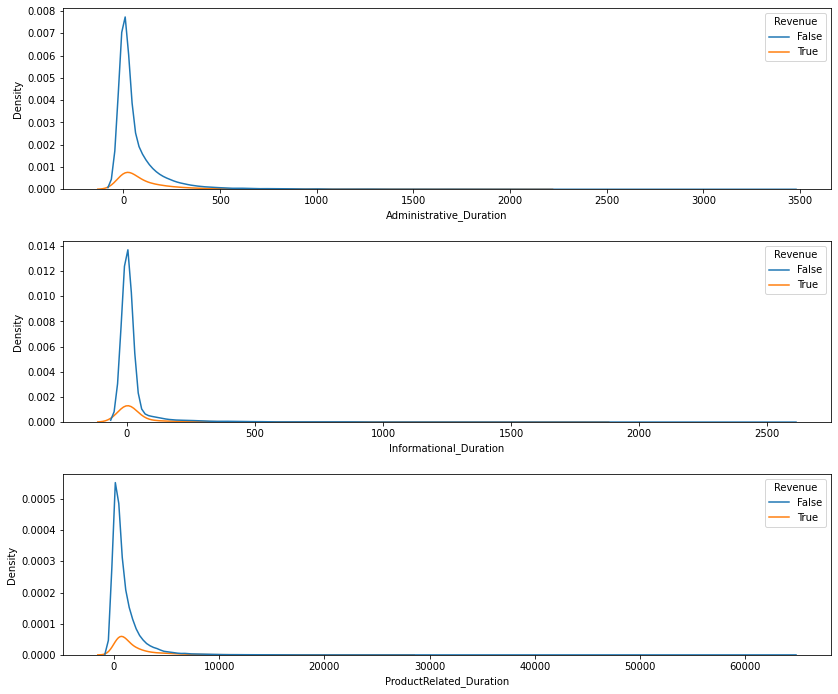

In [63]:
fig, ax = plt.subplots(3, 1, figsize=(12, 10))
sns.kdeplot(data=df, x='Administrative_Duration', hue='Revenue', ax=ax[0])
sns.kdeplot(data=df, x='Informational_Duration', hue='Revenue', ax=ax[1])
sns.kdeplot(data=df, x='ProductRelated_Duration', hue='Revenue', ax=ax[2])
plt.tight_layout(pad=2)
plt.show()

<AxesSubplot:xlabel='ProductRelated', ylabel='ProductRelated_Duration'>

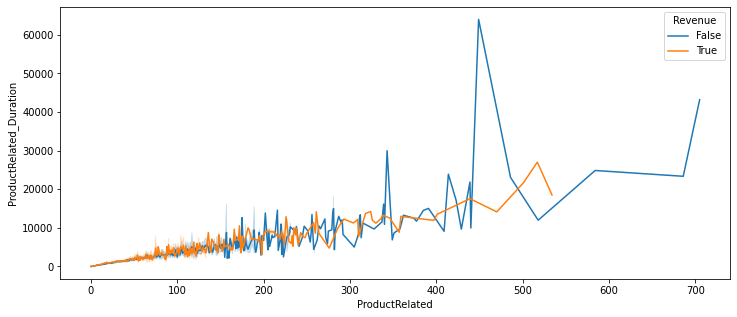

In [50]:
sns.lineplot(data=df, x='ProductRelated', y='ProductRelated_Duration', hue='Revenue')

In [23]:
df.groupby('Informational')['Revenue'].value_counts(normalize=True)

Informational  Revenue
0              False      0.866481
               True       0.133519
1              False      0.773295
               True       0.226705
2              False      0.788462
               True       0.211538
3              False      0.755263
               True       0.244737
4              False      0.720721
               True       0.279279
5              False      0.686869
               True       0.313131
6              False      0.782051
               True       0.217949
7              False      0.833333
               True       0.166667
8              False      0.714286
               True       0.285714
9              False      0.600000
               True       0.400000
10             False      0.714286
               True       0.285714
11             False      1.000000
12             False      0.600000
               True       0.400000
13             False      1.000000
14             False      1.000000
16             False      1.0000

In [9]:
frame = df.loc[df['Informational_Duration'] == 0, ['PageValues', 'Revenue', 'Informational_Duration', 'Informational']]
frame

,PageValues,Revenue,Informational_Duration,Informational
0,0.000000,False,0.0,0
1,0.000000,False,0.0,0
2,0.000000,False,0.0,0
3,0.000000,False,0.0,0
4,0.000000,False,0.0,0
...,...,...,...,...
12325,12.241717,False,0.0,0
12326,0.000000,False,0.0,0
12327,0.000000,False,0.0,0
12328,0.000000,False,0.0,0


In [14]:
frame.loc[(frame['Informational'] == 0) & (frame['Revenue'] == True), :]

,PageValues,Revenue,Informational_Duration,Informational
65,22.916036,True,0.0,0
76,11.439412,True,0.0,0
101,17.535959,True,0.0,0
198,109.176000,True,0.0,0
200,153.443248,True,0.0,0
...,...,...,...,...
12252,31.819677,True,0.0,0
12265,1.240071,True,0.0,0
12267,42.030441,True,0.0,0
12272,97.860836,True,0.0,0


In [10]:
frame.groupby('Informational')['Revenue'].value_counts()

Informational  Revenue
0              False      8404
               True       1295
1              False       171
               True         46
2              False         7
               True          2
Name: Revenue, dtype: int64

In [13]:
frame.groupby('Informational')['PageValues'].agg(['mean', 'median'])

,mean,median
Informational,,
0,5.327895,0.0
1,4.937615,0.0
2,2.408929,0.0


In [4]:
df.loc[df['Informational_Duration'] > 0, :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
57,4,56.000000,2,120.00,36,998.741667,0.000000,0.014736,19.447079,0.2,Feb,2,2,4,1,Returning_Visitor,False,False
103,2,31.000000,1,16.00,36,2083.530952,0.000000,0.013510,0.000000,0.8,Feb,2,2,4,3,Returning_Visitor,False,False
109,6,326.250000,4,94.00,128,5062.213753,0.000855,0.017918,0.000000,0.0,Feb,2,5,1,3,Returning_Visitor,False,False
114,0,0.000000,1,93.00,30,1045.833333,0.012903,0.035484,0.000000,0.2,Feb,1,1,1,3,Returning_Visitor,False,False
122,0,0.000000,2,75.00,14,442.333333,0.000000,0.034375,0.000000,0.8,Feb,1,1,3,3,Returning_Visitor,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12295,0,0.000000,3,33.75,9,313.928571,0.033333,0.027778,0.000000,0.0,Dec,3,2,2,10,Returning_Visitor,False,False
12307,2,305.125000,3,368.25,27,1121.250000,0.020000,0.042857,39.519807,0.0,Dec,3,2,1,2,Returning_Visitor,False,False
12311,1,0.000000,2,211.25,144,4627.489571,0.001361,0.020664,0.000000,0.0,Nov,2,2,1,2,Returning_Visitor,False,True
12312,7,150.357143,1,9.00,221,11431.001240,0.011149,0.021904,1.582473,0.0,Nov,2,5,1,2,Returning_Visitor,True,True


In [131]:
df.describe(include='object')

,Month,VisitorType
count,12330,12330
unique,10,3
top,May,Returning_Visitor
freq,3364,10551


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Administrative            12330 non-null  int64  
 1   Administrative_Duration   12330 non-null  float64
 2   Informational             12330 non-null  int64  
 3   Informational_Duration    12330 non-null  float64
 4   ProductRelated            12330 non-null  int64  
 5   ProductRelated_Duration   12330 non-null  float64
 6   BounceRates in %          12330 non-null  float64
 7   ExitRates in %            12330 non-null  float64
 8   PageValues                12330 non-null  float64
 9   SpecialDay (probability)  12330 non-null  float64
 10  Month                     12330 non-null  object 
 11  OperatingSystems          12330 non-null  int64  
 12  Browser                   12330 non-null  int64  
 13  Region                    12330 non-null  int64  
 14  Traffi

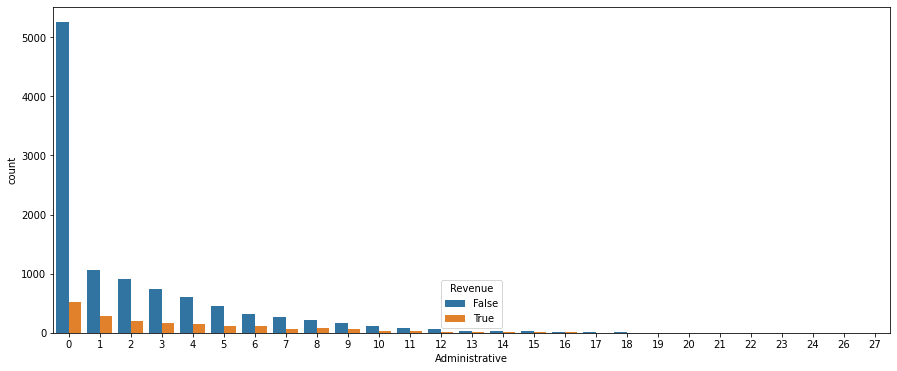

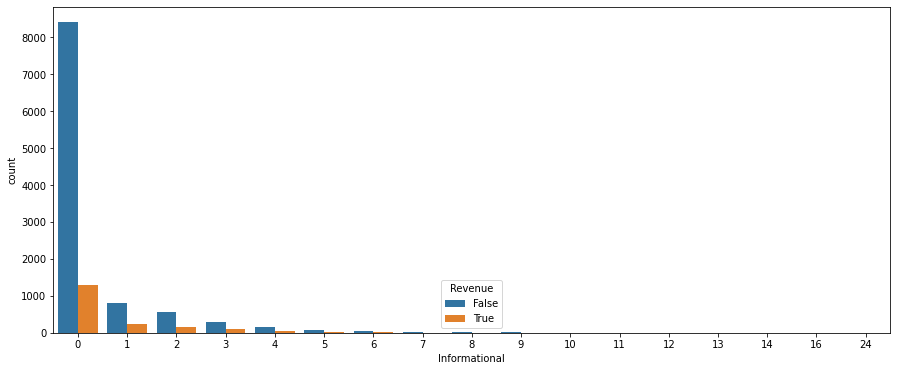

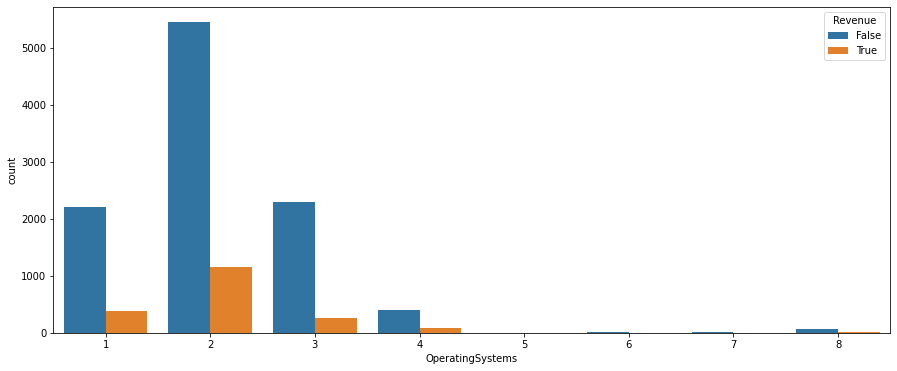

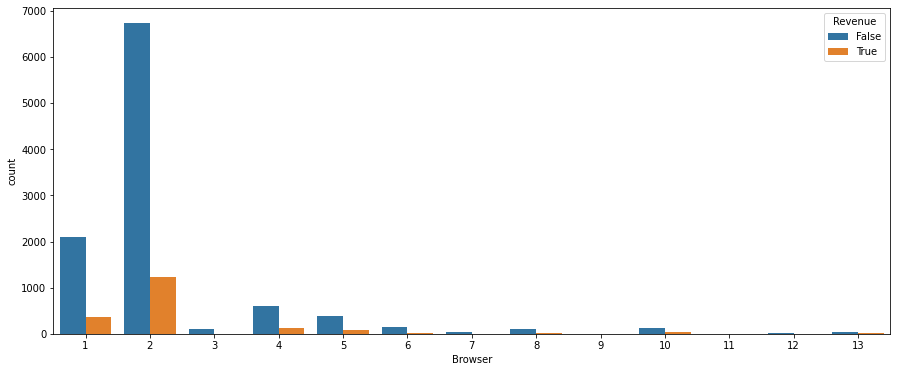

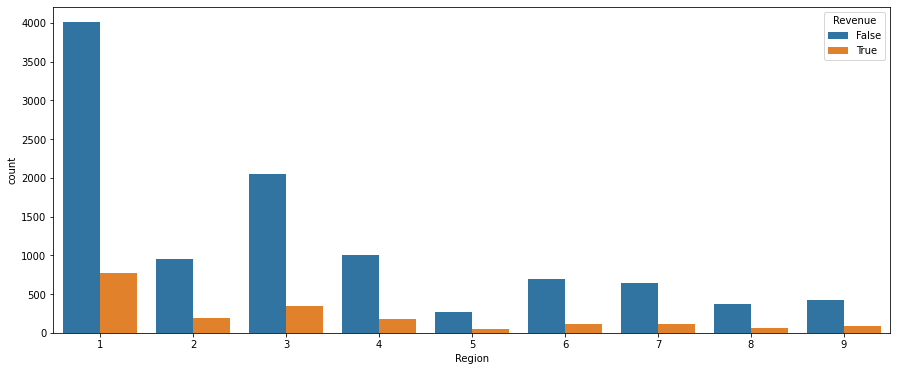

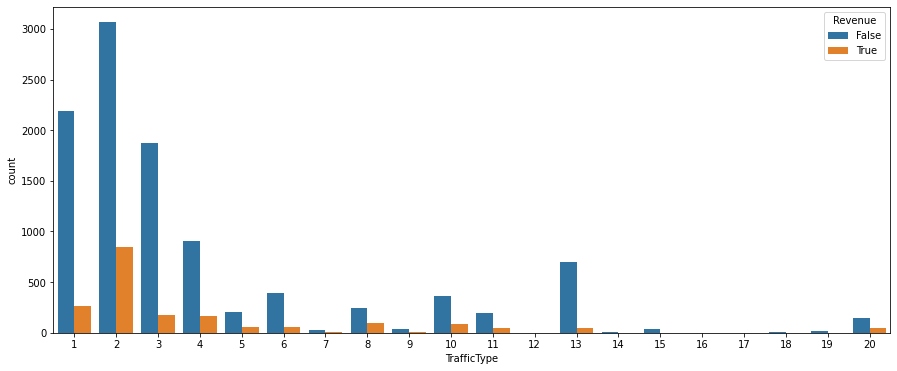

In [7]:
integer_cols = [col for col in df.columns if df[col].dtypes == 'int64' and col not in ['ProductRelated']]
for col in integer_cols:
    fig, ax = plt.subplots(figsize=(15, 6))
    sns.countplot(data=df, x=col, hue='Revenue', ax=ax)
    plt.show()

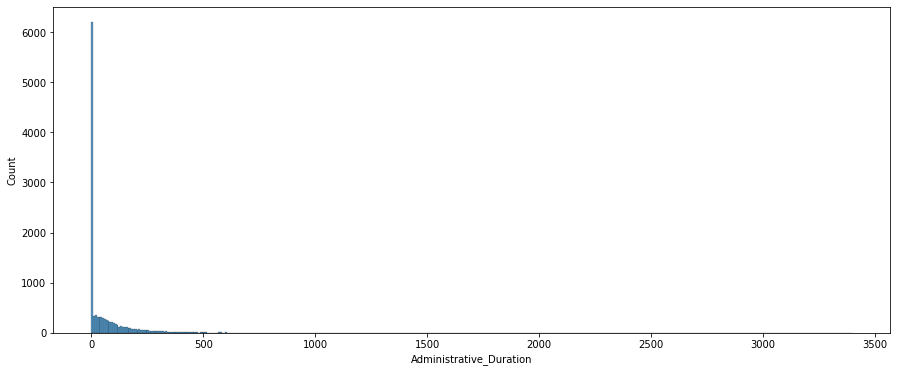

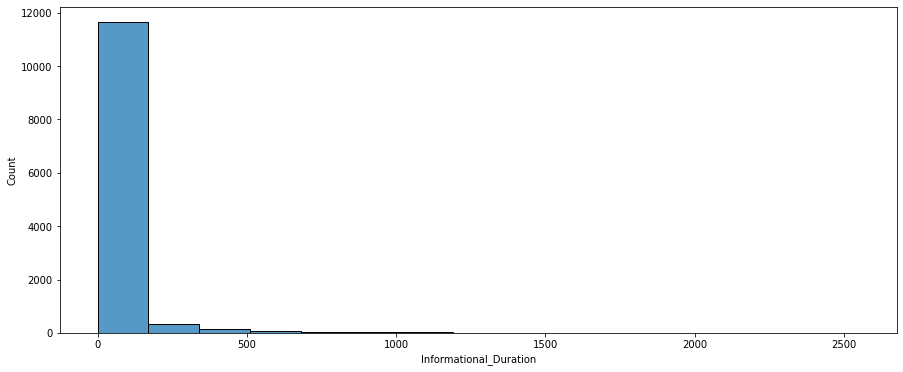

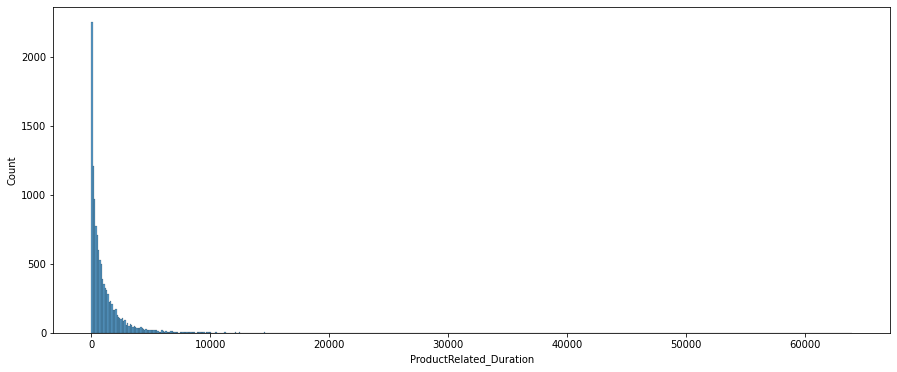

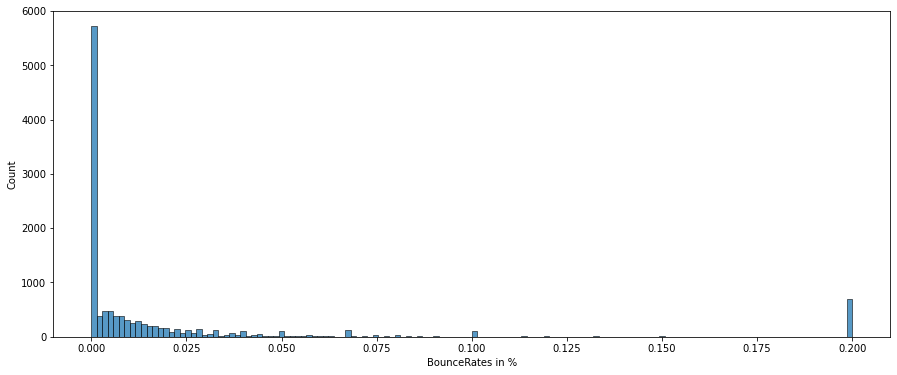

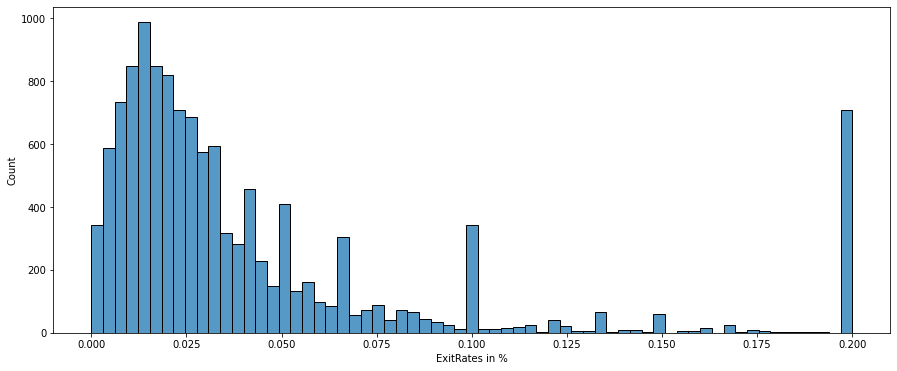

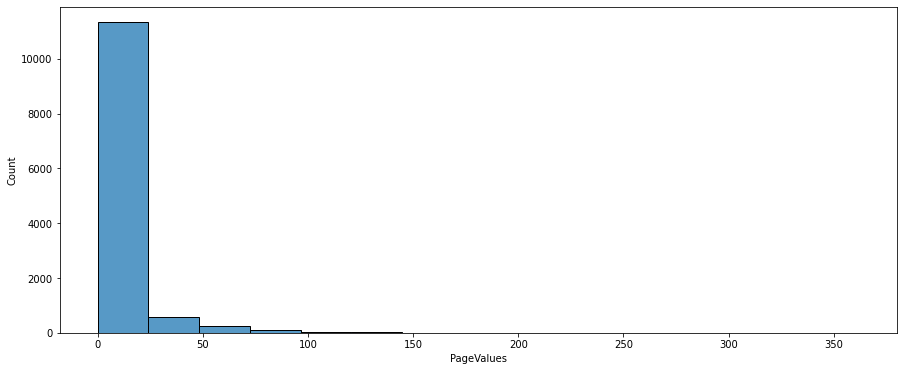

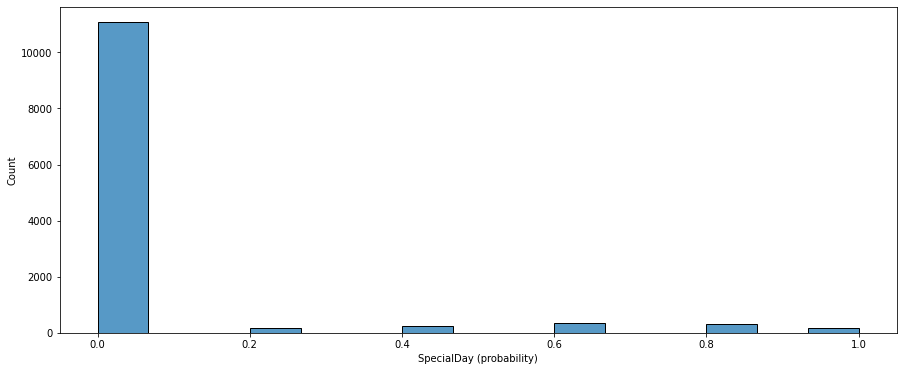

In [14]:
float_cols = [col for col in df.columns if df[col].dtypes == 'float64']
for col in float_cols:
    fig, ax = plt.subplots(figsize=(15, 6))
    sns.histplot(data=df, x=col, ax=ax)
    plt.show()

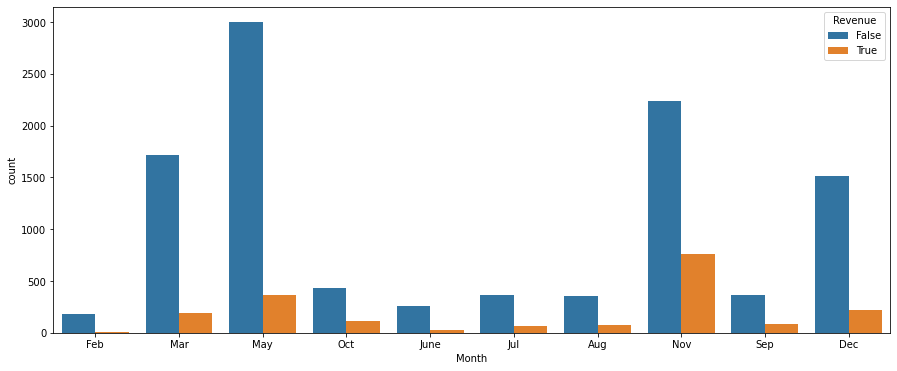

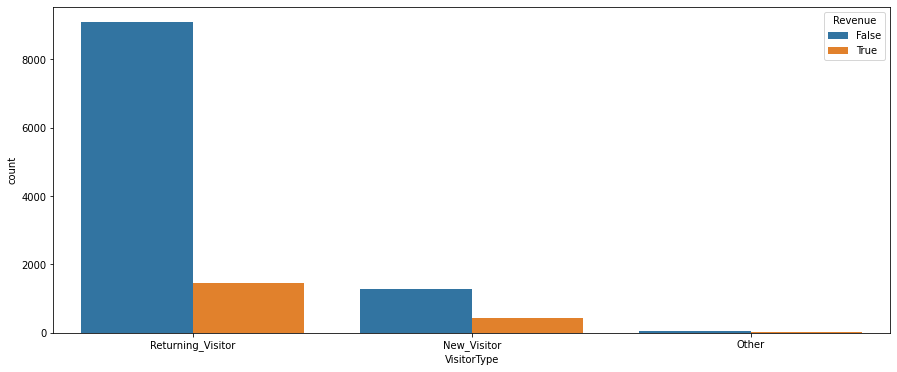

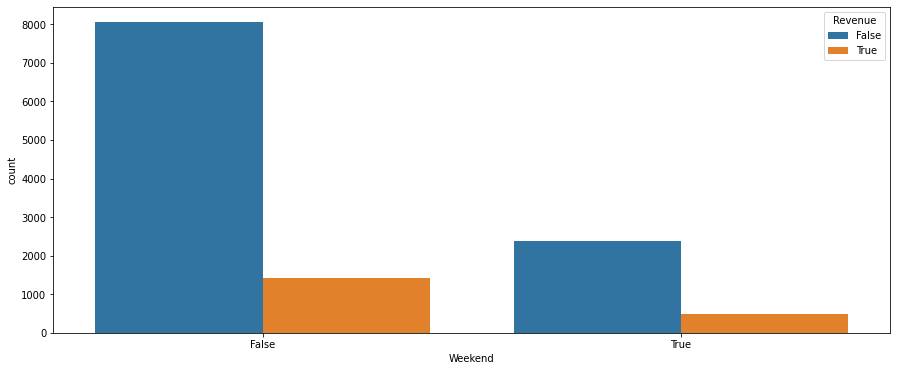

<Figure size 432x288 with 0 Axes>

In [11]:
categorical_cols = [col for col in df.columns if df[col].dtypes in ['object', 'bool'] and col not in ['Revenue']]
for col in categorical_cols:
    fig, ax = plt.subplots(figsize=(15, 6))
    sns.countplot(data=df, x=col, hue='Revenue', ax=ax)
    plt.show()
plt.savefig('countplot_hue_revenue.png')

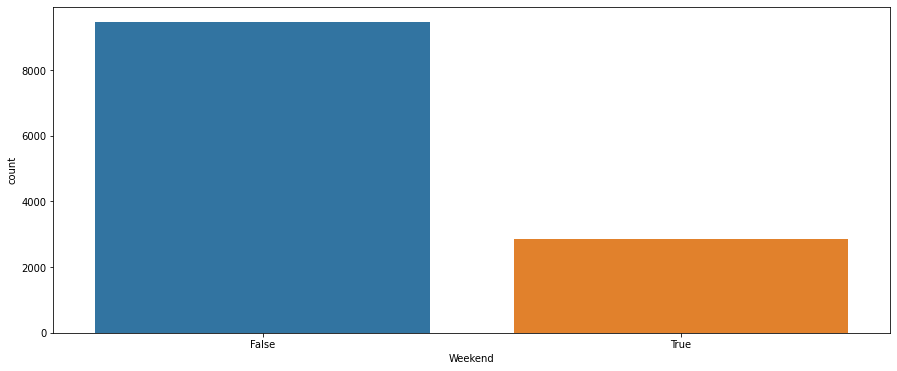

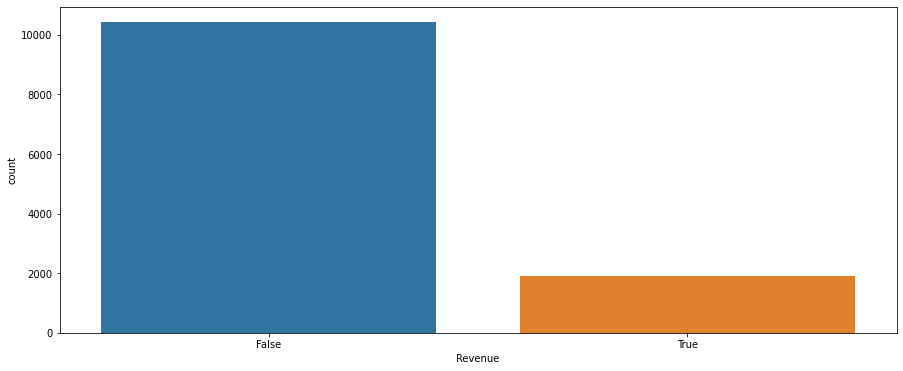

In [16]:
boolean_cols = [col for col in df.columns if df[col].dtypes == 'bool']
for col in boolean_cols:
    fig, ax = plt.subplots(figsize=(15, 6))
    sns.countplot(data=df, x=col, ax=ax)
    plt.show()

What is the distribution of the target variable?
What is the correlation between the features and the target variable?
What are the most common browsers used by online shoppers?
What is the distribution of the duration of time spent on different types of pages (Administrative, Informational, ProductRelated)?
How does the bounce rate vary across different types of pages?

In [30]:
df['Revenue'].value_counts()

False    10422
True      1908
Name: Revenue, dtype: int64

In [28]:
df['Revenue'].value_counts(normalize=True) * 100

False    84.525547
True     15.474453
Name: Revenue, dtype: float64

In [17]:
df['Weekend_int'] = df['Weekend'].astype('int64')
df['Revenue_int'] = df['Revenue'].astype('int64')

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Administrative            12330 non-null  int64  
 1   Administrative_Duration   12330 non-null  float64
 2   Informational             12330 non-null  int64  
 3   Informational_Duration    12330 non-null  float64
 4   ProductRelated            12330 non-null  int64  
 5   ProductRelated_Duration   12330 non-null  float64
 6   BounceRates in %          12330 non-null  float64
 7   ExitRates in %            12330 non-null  float64
 8   PageValues                12330 non-null  float64
 9   SpecialDay (probability)  12330 non-null  float64
 10  Month                     12330 non-null  object 
 11  OperatingSystems          12330 non-null  int64  
 12  Browser                   12330 non-null  int64  
 13  Region                    12330 non-null  int64  
 14  Traffi

In [5]:
df['Weekend'] = pd.factorize(df['Weekend'])[0]
df['Revenue'] = pd.factorize(df['Revenue'])[0]

In [6]:
features = [col for col in df.columns if df[col].dtypes in ['int64', 'float64']]

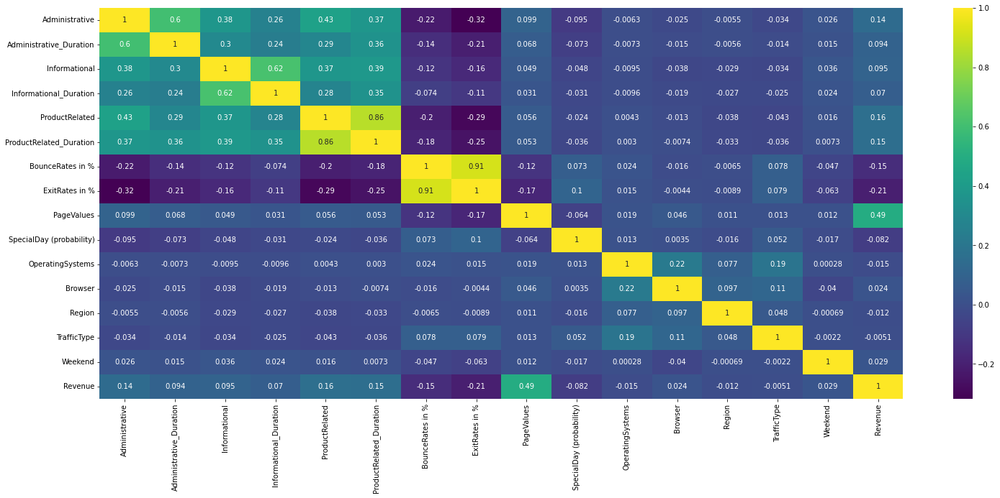

In [7]:
plt.figure(figsize=(25, 10))
sns.heatmap(df[features].corr(), annot=True, cmap='viridis')
plt.savefig('corr.png')
plt.show()

In [31]:
df.corr()['Revenue_int']

C:\Users\lenovo\AppData\Local\Temp\ipykernel_14740\3853640756.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()['Revenue_int']


Administrative              0.138917
Administrative_Duration     0.093587
Informational               0.095200
Informational_Duration      0.070345
ProductRelated              0.158538
ProductRelated_Duration     0.152373
BounceRates in %           -0.150673
ExitRates in %             -0.207071
PageValues                  0.492569
SpecialDay (probability)   -0.082305
OperatingSystems           -0.014668
Browser                     0.023984
Region                     -0.011595
TrafficType                -0.005113
Weekend                     0.029295
Revenue                     1.000000
Weekend_int                 0.029295
Revenue_int                 1.000000
Name: Revenue_int, dtype: float64

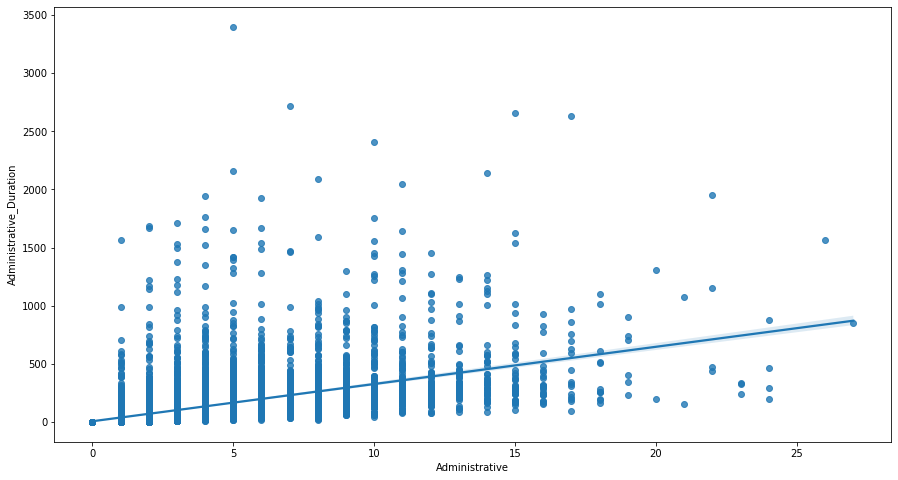

In [75]:
plt.figure(figsize=(15, 8))
sns.regplot(data=df, x='Administrative', y='Administrative_Duration')
plt.show()

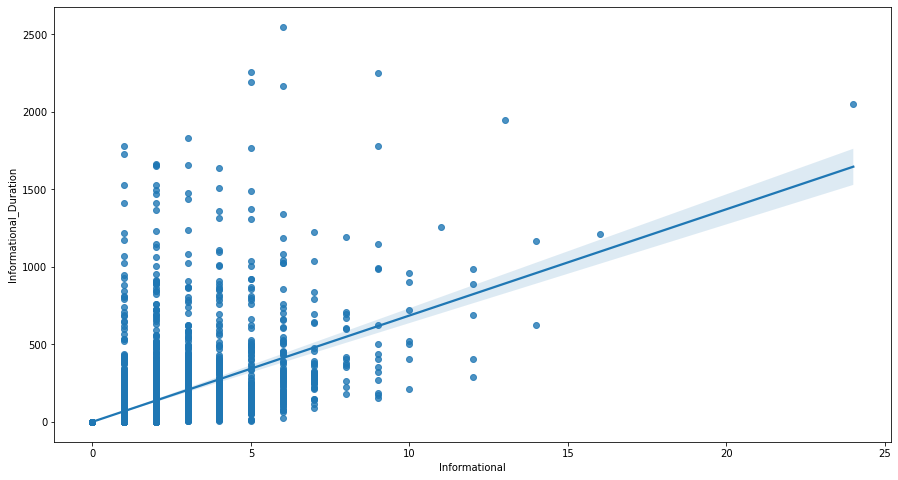

In [76]:
plt.figure(figsize=(15, 8))
sns.regplot(data=df, x='Informational', y='Informational_Duration')
plt.show()

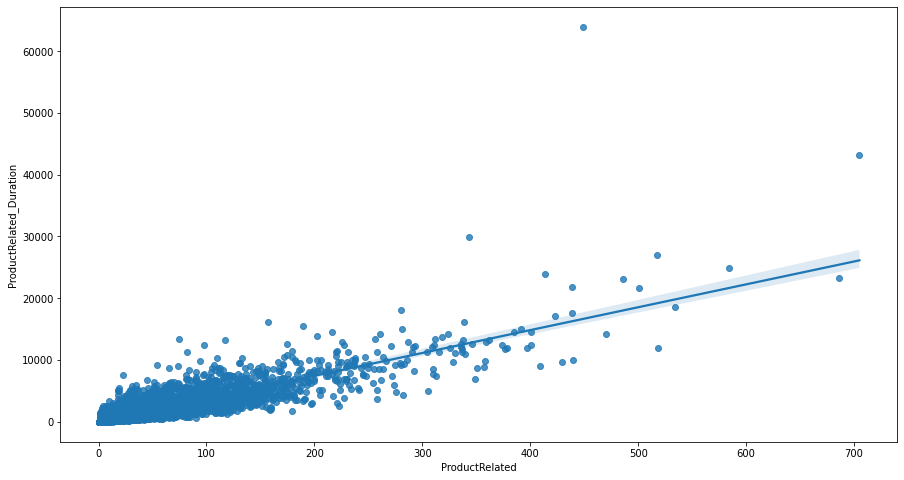

In [77]:
plt.figure(figsize=(15, 8))
sns.regplot(data=df, x='ProductRelated', y='ProductRelated_Duration')
plt.show()

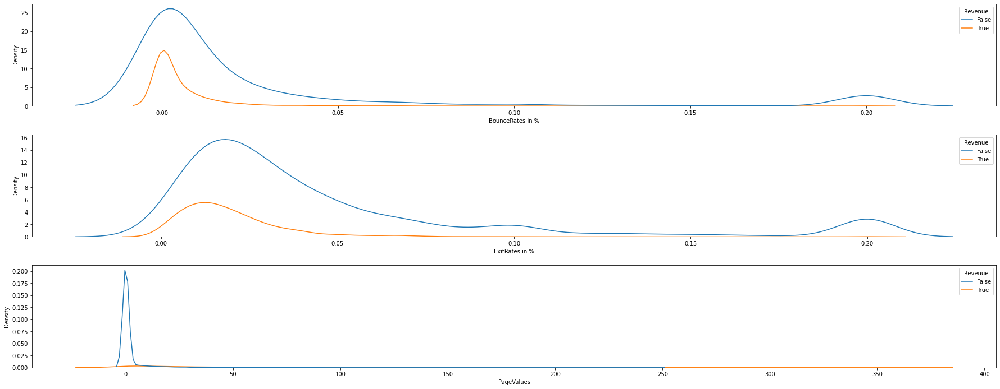

In [27]:
fig, ax = plt.subplots(3, 1, figsize=(25, 10))
sns.kdeplot(x="BounceRates in %", hue="Revenue", data=df, ax=ax[0])
sns.kdeplot(x="ExitRates in %", hue="Revenue", data=df, ax=ax[1])
sns.kdeplot(x="PageValues", hue="Revenue", data=df, ax=ax[2])
plt.tight_layout(pad=2)
plt.savefig('bounce_exit_page.png')
plt.show()

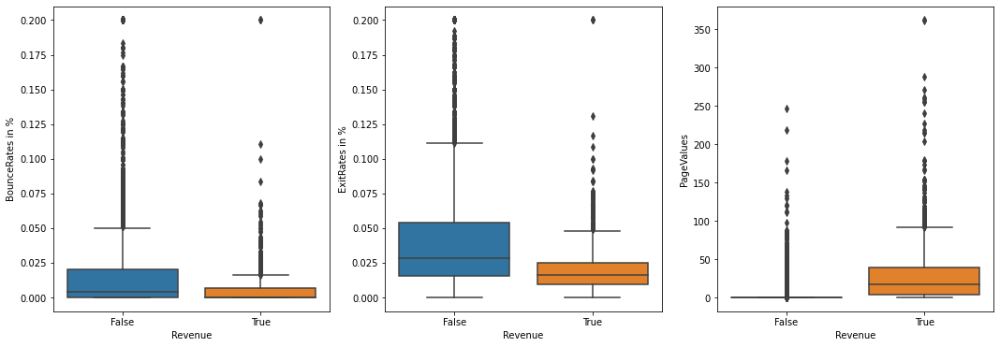

In [28]:
plt.figure(figsize=(18, 6))
plt.subplot(1,3,1)
sns.boxplot(y="BounceRates in %", x="Revenue",data=df)
plt.subplot(1,3,2)
sns.boxplot(y="ExitRates in %", x="Revenue",data=df)
plt.subplot(1,3,3)
sns.boxplot(y="PageValues",x="Revenue", data=df)
plt.savefig('bounce_exit_page_box.png')
plt.show()

In [63]:
df[['Administrative', 'Administrative_Duration', 'Revenue_int']].corr()

,Administrative,Administrative_Duration,Revenue_int
Administrative,1.000000,0.601583,0.138917
Administrative_Duration,0.601583,1.000000,0.093587
Revenue_int,0.138917,0.093587,1.000000


C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\matplotlib\axes\_axes.py:7622: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


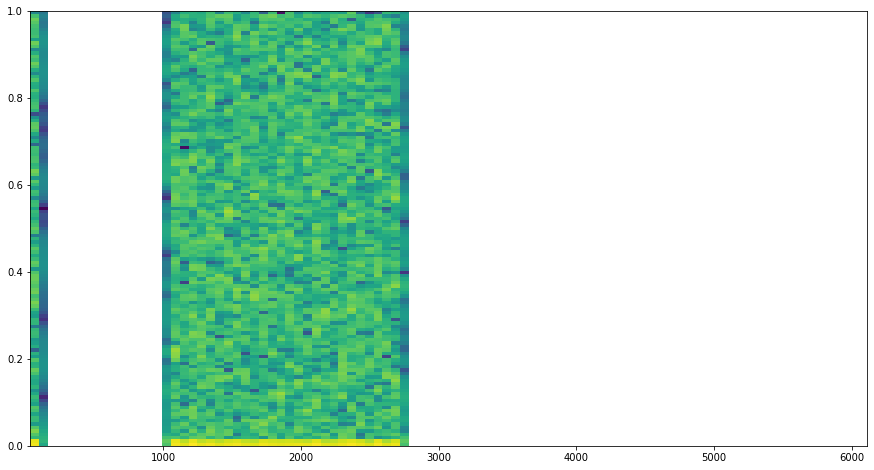

In [69]:
plt.figure(figsize=(15, 8))
plt.specgram(df['SpecialDay (probability)'])
plt.show()

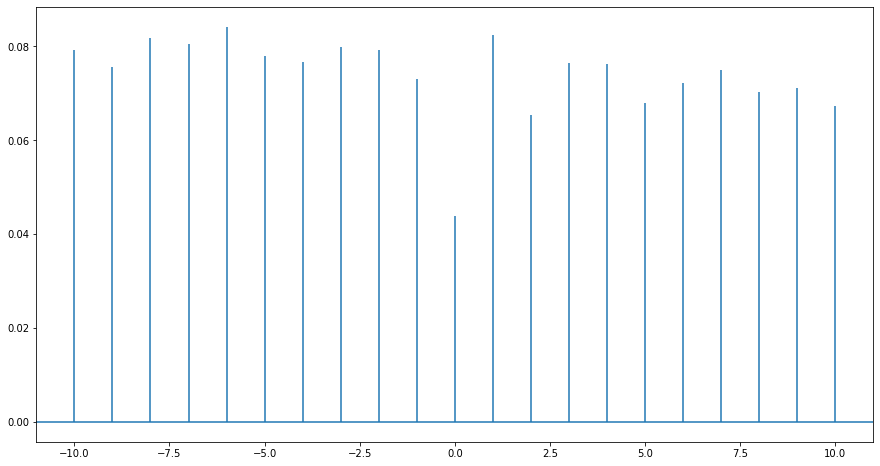

In [67]:
plt.figure(figsize=(15, 8))
plt.xcorr(df['SpecialDay (probability)'], df['Revenue_int'])
plt.show()

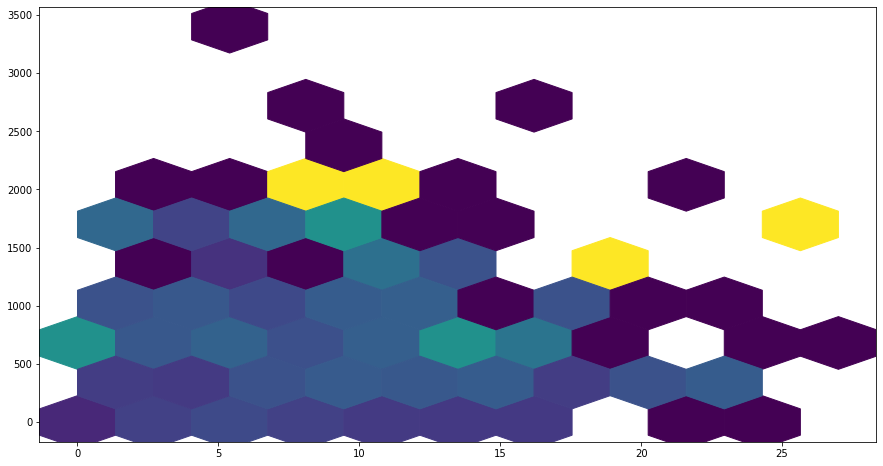

In [57]:
plt.figure(figsize=(15, 8))
plt.hexbin(df['Administrative'], df['Administrative_Duration'], C=df['Revenue_int'], gridsize=10)
plt.show()

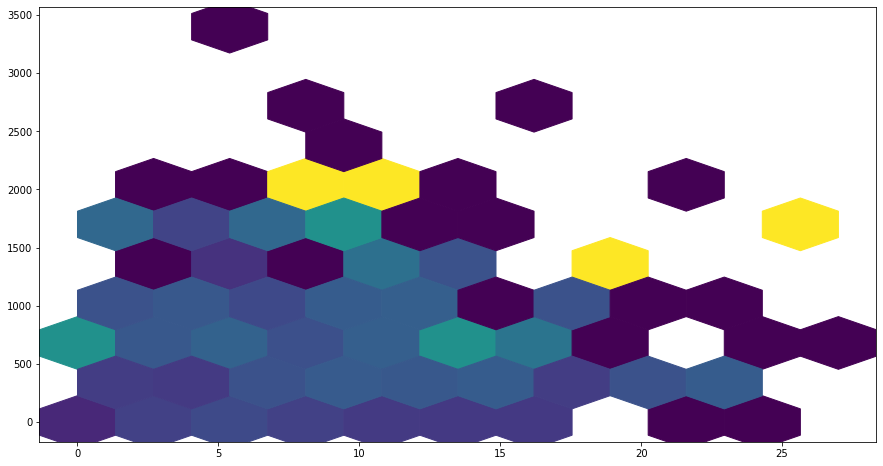

In [56]:
plt.figure(figsize=(15, 8))
plt.hexbin(df['Administrative'], df['Administrative_Duration'], C=df['Revenue_int'], reduce_C_function=np.mean,
           gridsize=10)
plt.show()

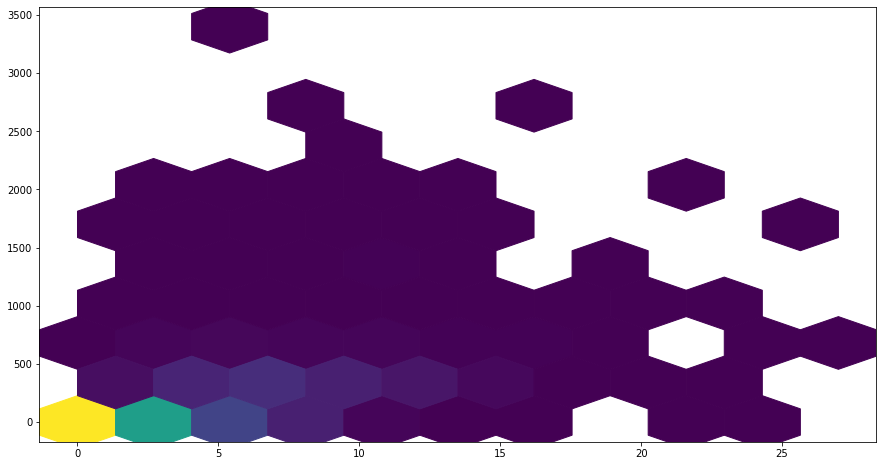

In [55]:
plt.figure(figsize=(15, 8))
plt.hexbin(df['Administrative'], df['Administrative_Duration'], C=df['Revenue_int'], reduce_C_function=np.sum,
           gridsize=10)
plt.show()

<Figure size 1800x720 with 0 Axes>

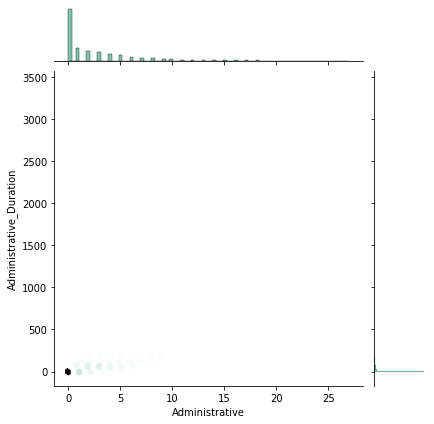

In [39]:
plt.figure(figsize=(25, 10))
sns.jointplot(data=df, x='Administrative', y='Administrative_Duration', kind="hex", color="#4CB391")
plt.show()

<Figure size 1800x720 with 0 Axes>

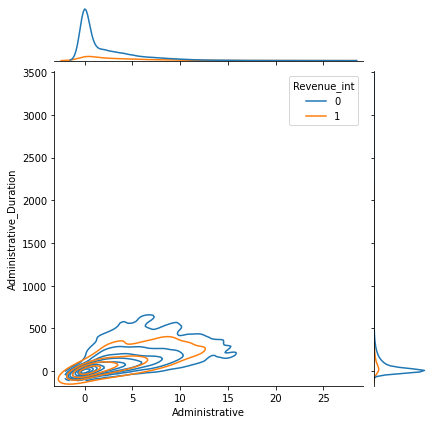

In [41]:
plt.figure(figsize=(25, 10))
sns.jointplot(data=df, x="Administrative", y="Administrative_Duration", hue="Revenue_int", kind="kde")
plt.show()

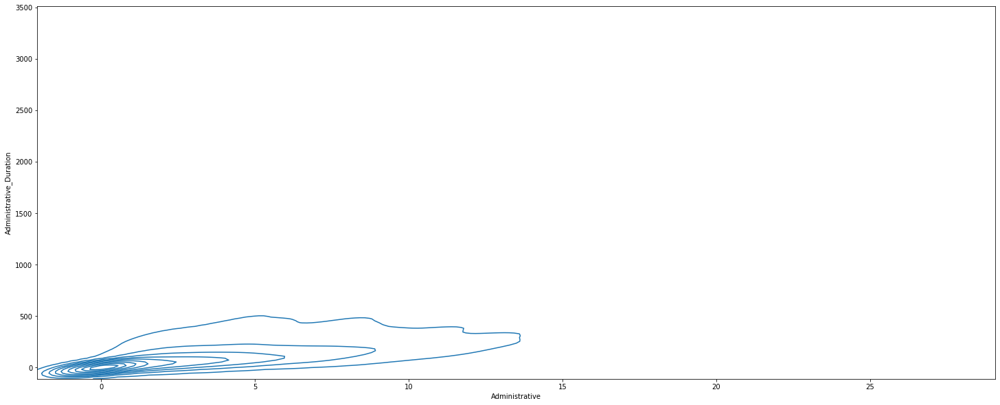

In [34]:
plt.figure(figsize=(25, 10))
sns.kdeplot(data=df, x='Administrative', y='Administrative_Duration')
plt.show()

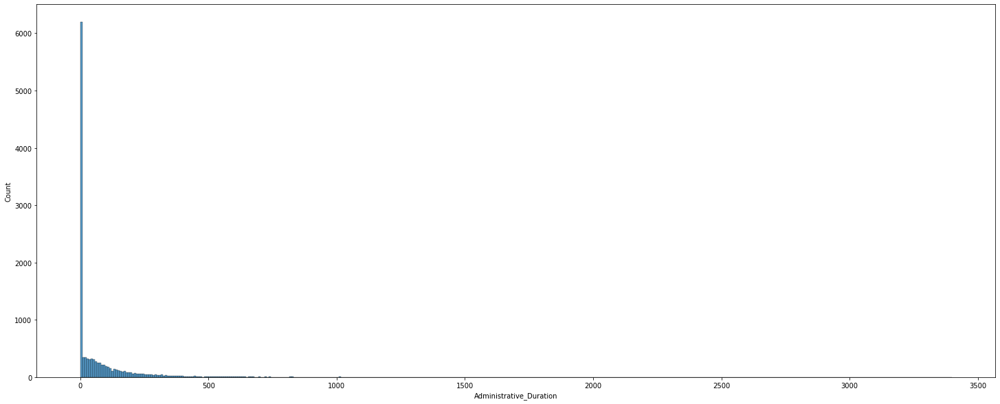

In [37]:
plt.figure(figsize=(25, 10))
sns.histplot(data=df, x='Administrative_Duration')
plt.show()

In [78]:
df.head(1)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Weekend_int,Revenue_int
0,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,0


In [81]:
df.groupby('VisitorType')['BounceRates in %'].mean()

VisitorType
New_Visitor          0.005261
Other                0.038551
Returning_Visitor    0.024778
Name: BounceRates in %, dtype: float64

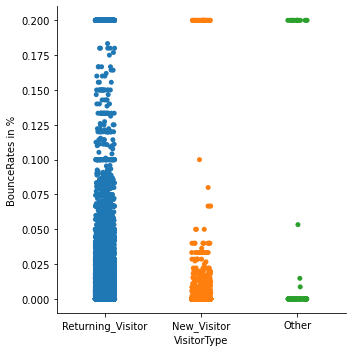

In [82]:
sns.catplot(data=df, x='VisitorType', y='BounceRates in %')

<AxesSubplot:xlabel='VisitorType', ylabel='BounceRates in %'>

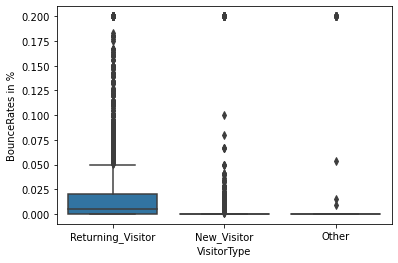

In [83]:
sns.boxplot(data=df, x='VisitorType', y='BounceRates in %')

<AxesSubplot:xlabel='BounceRates in %', ylabel='Density'>

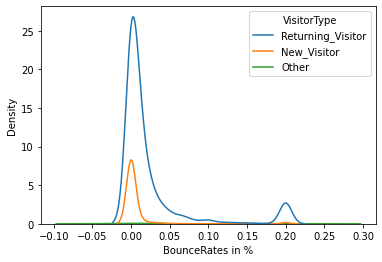

In [85]:
sns.kdeplot(data=df, hue='VisitorType', x='BounceRates in %')

<AxesSubplot:xlabel='TrafficType', ylabel='count'>

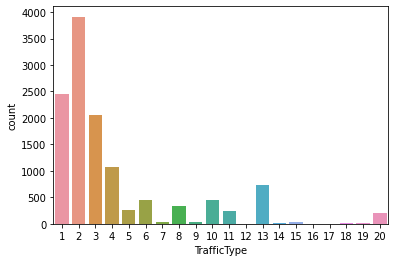

In [86]:
sns.countplot(data=df, x='TrafficType')

<AxesSubplot:xlabel='ProductRelated_Duration', ylabel='Density'>

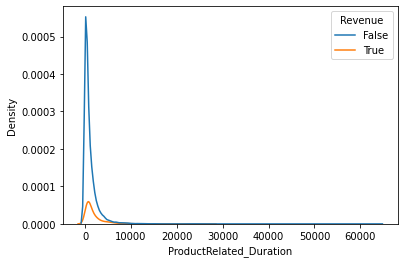

In [87]:
sns.kdeplot(data=df, hue='Revenue', x='ProductRelated_Duration')

<AxesSubplot:xlabel='Informational_Duration', ylabel='Density'>

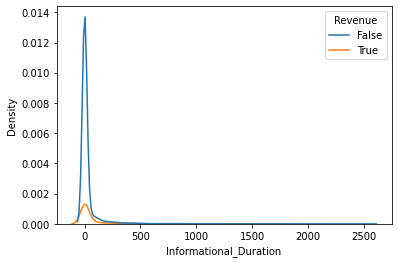

In [89]:
sns.kdeplot(data=df, hue='Revenue', x='Informational_Duration')

<AxesSubplot:xlabel='Administrative_Duration', ylabel='Density'>

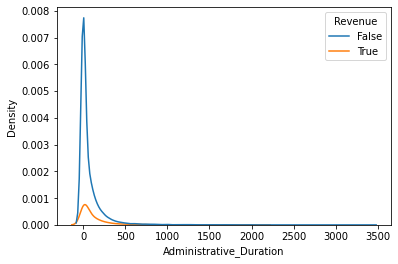

In [90]:
sns.kdeplot(data=df, hue='Revenue', x='Administrative_Duration')

In [92]:
df.groupby('VisitorType')['Administrative'].agg(['mean', 'median', 'count'])

,mean,median,count
VisitorType,,,
New_Visitor,2.551948,2.0,1694
Other,1.470588,0.0,85
Returning_Visitor,2.283954,1.0,10551


In [93]:
df.groupby('VisitorType')['Informational'].agg(['mean', 'median', 'count'])

,mean,median,count
VisitorType,,,
New_Visitor,0.333530,0.0,1694
Other,0.176471,0.0,85
Returning_Visitor,0.533504,0.0,10551


In [94]:
df.groupby('VisitorType')['ProductRelated'].agg(['mean', 'median', 'count'])

,mean,median,count
VisitorType,,,
New_Visitor,18.054900,13.0,1694
Other,12.470588,5.0,85
Returning_Visitor,34.082457,19.0,10551


In [104]:
unique_visitor_type = df['VisitorType'].unique()
frame = pd.DataFrame()
for col in tqdm.tqdm(unique_visitor_type):
    new_frame = df[df['VisitorType'] == col].groupby('VisitorType')[['Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'Administrative', 'Administrative_Duration']].agg(['mean', 'median', 'count'])
    frame = pd.concat([frame, new_frame])

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 159.65it/s]


In [105]:
frame

Informational               Informational_Duration         \
                           mean median  count                   mean median   
VisitorType                                                                   
Returning_Visitor      0.533504    0.0  10551              37.101992    0.0   
New_Visitor            0.333530    0.0   1694              19.237472    0.0   
Other                  0.176471    0.0     85              11.685490    0.0   

                         ProductRelated               ProductRelated_Duration  \
                   count           mean median  count                    mean   
VisitorType                                                                     
Returning_Visitor  10551      34.082457   19.0  10551             1289.421490   
New_Visitor         1694      18.054900   13.0   1694              636.393354   
Other                 85      12.470588    5.0     85              570.404862   

                                     Administrative                \
                       median  count           mean median  count   
VisitorType                                                         
Returning_Visitor  655.542857  10551       2.283954    1.0  10551   
New_Visitor        414.250000   1694       2.551948    2.0   1694   
Other              136.500000     85       1.470588    0.0     85   

                  Administrative_Duration                 
                                     mean  median  count  
VisitorType                                               
Returning_Visitor               79.183639   0.000  10551  
New_Visitor                     91.911315  48.175   1694  
Other                           62.695588   0.000     85

<AxesSubplot:xlabel='VisitorType', ylabel='Revenue_int'>

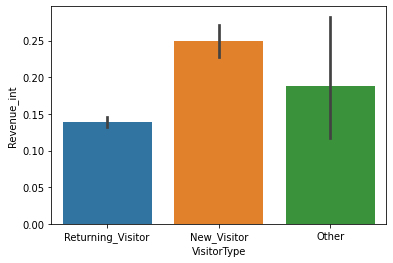

In [106]:
sns.barplot(data=df, x='VisitorType', y='Revenue_int')

In [109]:
conversion_rate = df.groupby('VisitorType')[['Informational', 'Informational_Duration', 'Revenue_int']].value_counts().sort_values(ascending=False)
conversion_rate

VisitorType        Informational  Informational_Duration  Revenue_int
Returning_Visitor  0              0.000000                0              7277
New_Visitor        0              0.000000                0              1063
Returning_Visitor  0              0.000000                1               922
New_Visitor        0              0.000000                1               359
Returning_Visitor  1              0.000000                0               156
                                                                         ... 
                   3              80.000000               1                 1
                                  82.000000               1                 1
                                  82.500000               0                 1
                                  84.000000               0                 1
                   24             2050.433333             0                 1
Length: 1904, dtype: int64

In [113]:
conversion_rate = conversion_rate.reset_index(name='freq')
conversion_rate

,VisitorType,Informational,Informational_Duration,Revenue_int,freq
0,Returning_Visitor,0,0.000000,0,7277
1,New_Visitor,0,0.000000,0,1063
2,Returning_Visitor,0,0.000000,1,922
3,New_Visitor,0,0.000000,1,359
4,Returning_Visitor,1,0.000000,0,156
...,...,...,...,...,...
1899,Returning_Visitor,3,80.000000,1,1
1900,Returning_Visitor,3,82.000000,1,1
1901,Returning_Visitor,3,82.500000,0,1
1902,Returning_Visitor,3,84.000000,0,1


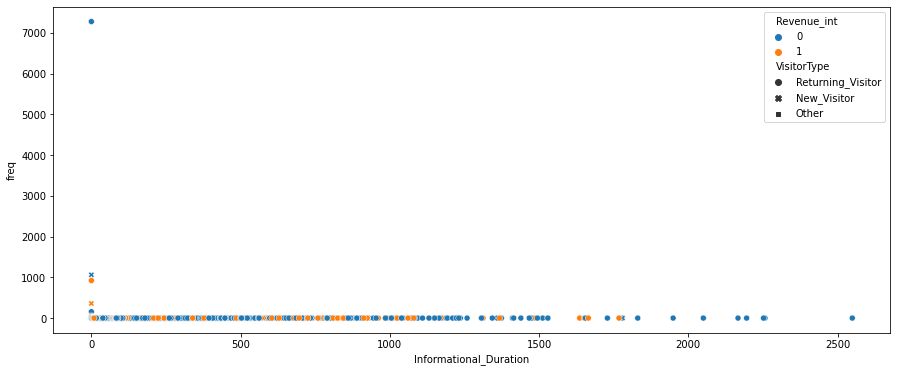

In [124]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=conversion_rate, x='Informational_Duration', y='freq', hue='Revenue_int', style='VisitorType')
plt.show()

What is the distribution of different visitor types in the dataset?
How does the revenue vary based on the month of the year?
Are there any significant differences in the bounce rates between new and returning visitors?
What are the most common sources of traffic for online shoppers?
Is there a relationship between the duration of a session and the revenue generated?
Are there any specific days of the week when online shoppers are more likely to make a purchase?
What is the average number of pages visited per session for different visitor types?
Is there a correlation between the operating system used and the likelihood of making a purchase?
Are there any significant differences in the revenue generated from different regions?
What is the impact of the number of website exits on the conversion rate?
How does the average time spent on the website vary between mobile and desktop users?
Are there any specific traffic sources that result in higher conversion rates?
What is the distribution of different special days (e.g., Black Friday) in the dataset?
Are there any particular visitor types that tend to have longer sessions?
How does the revenue vary based on the type of browser used?
What is the relationship between the number of product-related searches and the likelihood of making a purchase?
Are there any significant differences in the bounce rates between different regions?
How does the average session duration differ between weekdays and weekends?
What are the most common exit pages for online shoppers who do not make a purchase?
Is there a correlation between the number of different website categories visited and the revenue generated?
What is the distribution of different visitor types across different regions?
Are there any specific months when online shoppers are more likely to abandon their shopping carts?
How does the revenue vary based on the number of website visits?
Is there a correlation between the number of previous website visits and the likelihood of making a purchase?
What is the impact of the number of search queries on the conversion rate?
Are there any significant differences in the revenue generated between different traffic sources?
How does the average time spent on different website categories vary?
What is the relationship between the number of administrative pages visited and the likelihood of making a purchase?
Are there any particular visitor types that tend to have higher exit rates?
How does the revenue vary based on the number of different website categories visited?

The relationship between the visitor type (specifically returning visitors) with a high spend time duration on a website and revenue generation can vary depending on various factors. While a longer spend time duration may indicate engagement and interest from the visitor, it does not guarantee revenue generation on its own. However, there is a potential correlation between these factors.

Here are a few points to consider when examining the relationship:

Conversion Rate: Visitors spending more time on a website, especially returning visitors, may have a higher likelihood of converting into customers. The longer duration allows them to explore more products or services, leading to potential purchases and revenue generation.

Engagement and Interest: Returning visitors who spend a significant amount of time on a website likely indicate a higher level of engagement and interest in the offerings. This increased interest may increase the chances of revenue generation through purchases or transactions.

Website Usability and Content: If returning visitors spend a long time on the website, it could suggest that the website's content, design, and user experience are appealing and meet their needs. A positive user experience can contribute to a higher probability of revenue generation.

Intent and Decision-making: Longer spend time duration may also indicate that the returning visitors are actively researching or comparing products, which might be a positive sign. It shows they are invested in their decision-making process, increasing the likelihood of revenue generation.

However, it is essential to note that the relationship between spend time duration, visitor type, and revenue generation is not deterministic. Other factors such as pricing, product quality, website functionality, marketing strategies, and external influences can also impact revenue generation. Therefore, it's crucial to consider a holistic view and analyze multiple factors when studying the relationship between visitor behavior and revenue generation on a website.

In [16]:
df['Revenue'].value_counts(normalize=True) * 100

False    84.525547
True     15.474453
Name: Revenue, dtype: float64

In [18]:
(df['Revenue'] == True).mean() * 100

15.474452554744525

In [17]:
(df['Revenue'] == False).mean() * 100

84.52554744525548

In [23]:
df.groupby('VisitorType')['Revenue'].value_counts(normalize=True) * 100

VisitorType        Revenue
New_Visitor        False      75.088548
                   True       24.911452
Other              False      81.176471
                   True       18.823529
Returning_Visitor  False      86.067671
                   True       13.932329
Name: Revenue, dtype: float64

In [ ]:
100, 0 - 1 : 20, 20 / 100 

In [52]:
df.groupby('ProductRelated')['ProductRelated_Duration'].value_counts(normalize=True)

ProductRelated  ProductRelated_Duration
0               0.00000                    1.000000
1               0.00000                    0.889068
                8.00000                    0.004823
                13.00000                   0.004823
                4.00000                    0.003215
                                             ...   
518             11976.72135                1.000000
534             18504.12621                1.000000
584             24844.15620                1.000000
686             23342.08205                1.000000
705             43171.23338                1.000000
Name: ProductRelated_Duration, Length: 11068, dtype: float64

In [40]:
df['ProductRelated'] / (df['ProductRelated_Duration'] + 0.00001)

0        100000.000000
1             0.031250
2        100000.000000
3             0.749997
4             0.015936
             ...      
12325         0.029712
12326         0.010735
12327         0.032564
12328         0.043353
12329         0.141176
Length: 12330, dtype: float64

In [45]:
df.groupby('Informational')['Informational_Duration'].value_counts(normalize=True)

Informational  Informational_Duration
0              0.000000                  1.000000
1              0.000000                  0.208453
               6.000000                  0.016330
               9.000000                  0.014409
               4.000000                  0.013449
                                           ...   
13             1949.166667               1.000000
14             622.400000                0.500000
               1165.166667               0.500000
16             1210.397619               1.000000
24             2050.433333               1.000000
Name: Informational_Duration, Length: 1657, dtype: float64

In [43]:
df['Informational'] / (df['Informational_Duration'] + 0.00001)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
12325    0.0
12326    0.0
12327    0.0
12328    0.0
12329    0.0
Length: 12330, dtype: float64

In [51]:
df['Administrative'] / (df['Administrative_Duration'] + 0.00001)

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
           ...   
12325    0.020690
12326    0.000000
12327    0.000000
12328    0.053333
12329    0.000000
Length: 12330, dtype: float64

In [81]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


<AxesSubplot:xlabel='Browser', ylabel='Revenue'>

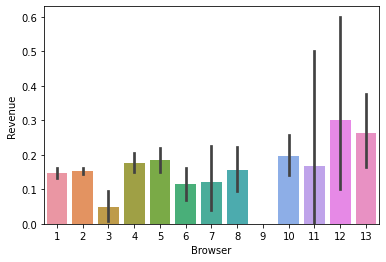

In [55]:
sns.barplot(data=df, x='Browser', y='Revenue')

In [63]:
df['Revenue_int'] = df['Revenue'].replace({True: 1, False: 0})

<AxesSubplot:xlabel='Browser', ylabel='Revenue_int'>

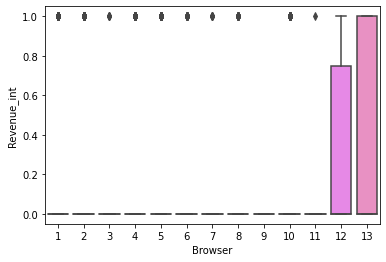

In [65]:
sns.boxplot(data=df, x='Browser', y='Revenue_int')

In [67]:
df.groupby('Browser')['Revenue_int'].describe()

,count,mean,std,min,25%,50%,75%,max
Browser,,,,,,,,
1,2462.0,0.148253,0.355423,0.0,0.0,0.0,0.00,1.0
2,7961.0,0.153624,0.360611,0.0,0.0,0.0,0.00,1.0
3,105.0,0.047619,0.213980,0.0,0.0,0.0,0.00,1.0
4,736.0,0.176630,0.381615,0.0,0.0,0.0,0.00,1.0
5,467.0,0.184154,0.388026,0.0,0.0,0.0,0.00,1.0
6,174.0,0.114943,0.319873,0.0,0.0,0.0,0.00,1.0
7,49.0,0.122449,0.331201,0.0,0.0,0.0,0.00,1.0
8,135.0,0.155556,0.363783,0.0,0.0,0.0,0.00,1.0
9,1.0,0.000000,NaN,0.0,0.0,0.0,0.00,0.0


In [72]:
pd.qcut(df['Browser'], q=4, duplicates='drop')

0        (0.999, 2.0]
1        (0.999, 2.0]
2        (0.999, 2.0]
3        (0.999, 2.0]
4         (2.0, 13.0]
             ...     
12325     (2.0, 13.0]
12326    (0.999, 2.0]
12327    (0.999, 2.0]
12328    (0.999, 2.0]
12329    (0.999, 2.0]
Name: Browser, Length: 12330, dtype: category
Categories (2, interval[float64, right]): [(0.999, 2.0] < (2.0, 13.0]]

In [60]:
from optbinning import OptimalBinning

In [61]:
features = [col for col in df.columns if col not in ['Revenue', 'Revenue_int']]

In [62]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report

In [10]:
cat_cols = [col for col in df.columns if df[col].dtypes in ['object', 'bool'] and col not in ['Revenue']]

In [11]:
for col in cat_cols:
    le = LabelEncoder()
    df.loc[:, col] = le.fit_transform(df[col])

C:\Users\lenovo\AppData\Local\Temp\ipykernel_11448\1663346978.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:, col] = le.fit_transform(df[col])
C:\Users\lenovo\AppData\Local\Temp\ipykernel_11448\1663346978.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.loc[:, col] = le.fit_transform(df[col])


In [12]:
num_cols = [col for col in df.columns if df[col].dtypes in ['int64', 'float64'] and col not in ['Revenue']]

In [13]:
for col in num_cols:
    scaler = StandardScaler()
    df.loc[:, col] = scaler.fit_transform(df[col].values.reshape(-1, 1))

In [14]:
target = df['Revenue']

In [16]:
ob = OptimalBinning(name='Browser', dtype="numerical", solver="cp")
ob.fit(df[col], target)
df[col] = ob.transform(df[col])

In [18]:
ob.status

'OPTIMAL'

In [19]:
ob.splits

array([0.63290408])

In [20]:
binning_table = ob.binning_table

In [21]:
type(binning_table)

optbinning.binning.binning_statistics.BinningTable

In [23]:
binning_table.build()

,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 0.63)",9462,0.767397,8053,1409,0.148911,0.045301,0.00155,0.000194
1,"[0.63, inf)",2868,0.232603,2369,499,0.173989,-0.140246,0.00480,0.000599
2,Special,0,0.000000,0,0,0.000000,0.0,0.00000,0.000000
3,Missing,0,0.000000,0,0,0.000000,0.0,0.00000,0.000000
Totals,,12330,1.000000,10422,1908,0.154745,,0.00635,0.000793


In [63]:
df_to_use = df[['Browser', 'Revenue']]

In [64]:
x = df_to_use['Browser']
var_name = 'Browser'
target = df_to_use['Revenue']

In [65]:
ob = OptimalBinning(name=var_name)
ob.fit(x, target)
df_to_use[var_name] = ob.transform(df_to_use[var_name])

C:\Users\lenovo\AppData\Local\Temp\ipykernel_11448\1705849007.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_use[var_name] = ob.transform(df_to_use[var_name])


In [66]:
df_to_use

,Browser,Revenue
0,0.050502,False
1,0.019245,False
2,0.050502,False
3,0.019245,False
4,0.019245,False
...,...,...
12325,-0.137162,False
12326,0.019245,False
12327,0.019245,False
12328,0.019245,False


In [67]:
ob.splits

array([1.5, 3.5, 4.5])

In [68]:
binning_table = ob.binning_table

In [69]:
binning_table.build()

,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 1.50)",2462,0.199676,2097,365,0.148253,0.050502,0.000500,0.000063
1,"[1.50, 3.50)",8066,0.654177,6838,1228,0.152244,0.019245,0.000241,0.000030
2,"[3.50, 4.50)",736,0.059692,606,130,0.176630,-0.158518,0.001583,0.000198
3,"[4.50, inf)",1066,0.086456,881,185,0.173546,-0.137162,0.001705,0.000213
4,Special,0,0.000000,0,0,0.000000,0.0,0.000000,0.000000
5,Missing,0,0.000000,0,0,0.000000,0.0,0.000000,0.000000
Totals,,12330,1.000000,10422,1908,0.154745,,0.004029,0.000503


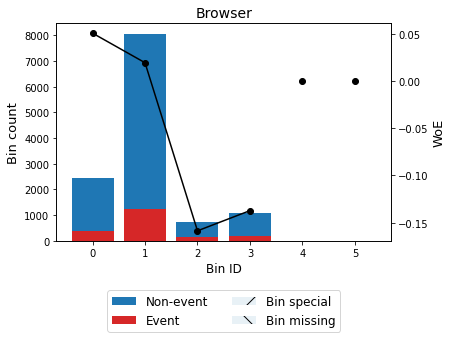

In [70]:
binning_table.plot(metric="woe")

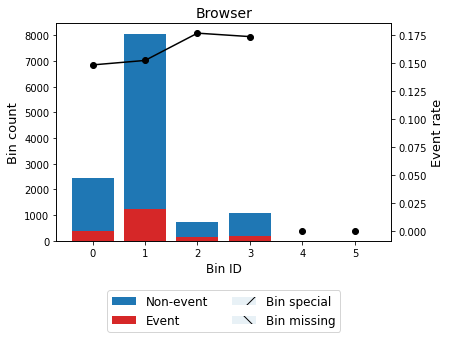

In [71]:
binning_table.plot(metric="event_rate")

In [72]:
x_transform_woe = ob.transform(x, metric="woe")

In [73]:
pd.Series(x_transform_woe).value_counts()

 0.019245    8066
 0.050502    2462
-0.137162    1066
-0.158518     736
dtype: int64

In [75]:
x_transform_event_rate = ob.transform(x, metric="event_rate")

In [76]:
pd.Series(x_transform_event_rate).value_counts()

0.152244    8066
0.148253    2462
0.173546    1066
0.176630     736
dtype: int64

In [77]:
x_transform_indices = ob.transform(x, metric="indices")

In [78]:
pd.Series(x_transform_indices).value_counts()

1    8066
0    2462
3    1066
2     736
dtype: int64

In [79]:
x_transform_bins = ob.transform(x, metric="bins")

In [80]:
pd.Series(x_transform_bins).value_counts()

[1.50, 3.50)    8066
(-inf, 1.50)    2462
[4.50, inf)     1066
[3.50, 4.50)     736
dtype: int64

<AxesSubplot:xlabel='Revenue', ylabel='Browser'>

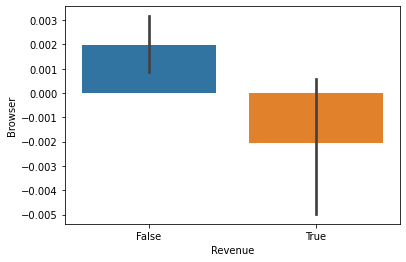

In [84]:
sns.barplot(data=df_to_use, x='Revenue', y='Browser')

(array([0, 1, 2, 3]),
 [Text(0, 0, '-0.1585178478471962'),
  Text(1, 0, '-0.1371615826030735'),
  Text(2, 0, '0.019245078031230583'),
  Text(3, 0, '0.05050229385850025')])

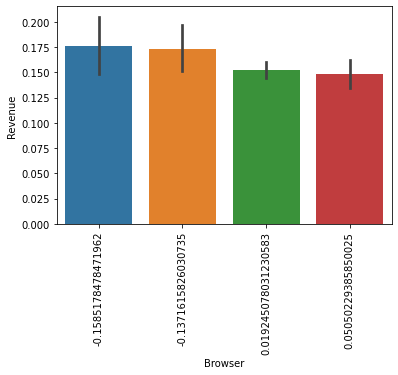

In [86]:
sns.barplot(data=df_to_use, y='Revenue', x='Browser')
plt.xticks(rotation=90)

In [88]:
df_to_use['Revenue_int'] = df['Revenue'].astype('int64')

C:\Users\lenovo\AppData\Local\Temp\ipykernel_11448\3167714052.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_use['Revenue_int'] = df['Revenue'].astype('int64')


(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

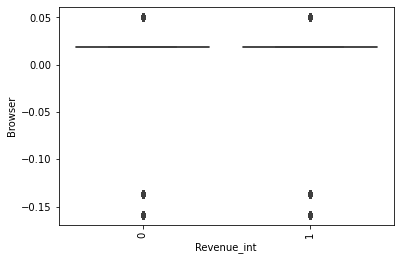

In [90]:
sns.boxplot(data=df_to_use, x='Revenue_int', y='Browser')
plt.xticks(rotation=90)

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

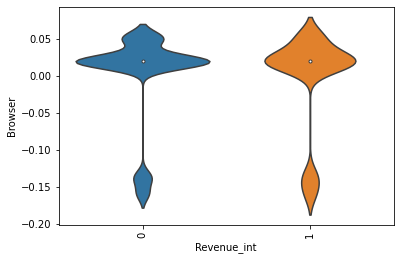

In [91]:
sns.violinplot(data=df_to_use, x='Revenue_int', y='Browser')
plt.xticks(rotation=90)

(array([-0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

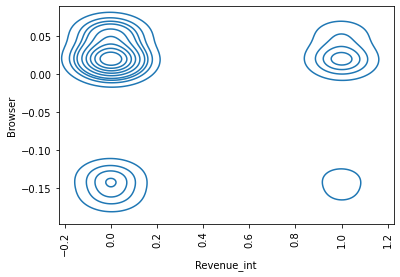

In [93]:
sns.kdeplot(data=df_to_use, x='Revenue_int', y='Browser')
plt.xticks(rotation=90)

In [103]:
df_to_use.loc[df_to_use['Browser'] >= -0.10, ['Revenue_int']].value_counts()

Revenue_int
0              8935
1              1593
dtype: int64

In [102]:
df_to_use.loc[df_to_use['Browser'] <= -0.10, ['Revenue_int']].value_counts()

Revenue_int
0              1487
1               315
dtype: int64

(array([-0.25, -0.2 , -0.15, -0.1 , -0.05,  0.  ,  0.05,  0.1 ,  0.15]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

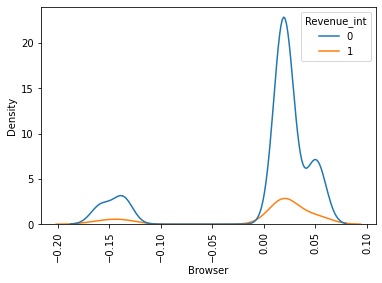

In [94]:
sns.kdeplot(data=df_to_use, x='Browser', hue='Revenue_int')
plt.xticks(rotation=90)

In [104]:
df.head(1)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False


In [106]:
df['TrafficType'].value_counts()

2     3913
1     2451
3     2052
4     1069
13     738
10     450
6      444
8      343
5      260
11     247
20     198
9       42
7       40
15      38
19      17
14      13
18      10
16       3
12       1
17       1
Name: TrafficType, dtype: int64

<AxesSubplot:xlabel='TrafficType', ylabel='Revenue'>

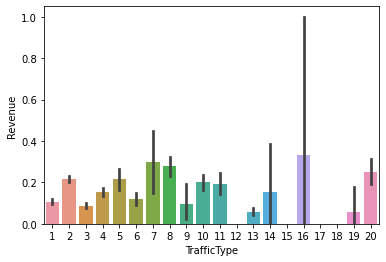

In [107]:
sns.barplot(data=df, x='TrafficType', y='Revenue')

<AxesSubplot:xlabel='Revenue', ylabel='TrafficType'>

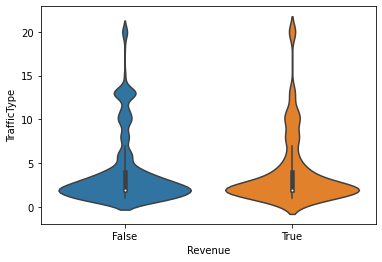

In [110]:
sns.violinplot(data=df, y='TrafficType', x='Revenue')

<AxesSubplot:xlabel='TrafficType', ylabel='Density'>

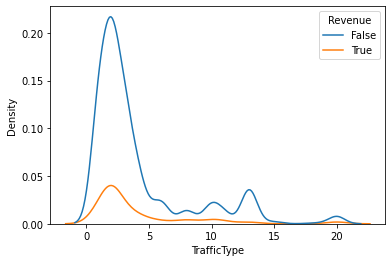

In [114]:
sns.kdeplot(data=df, x='TrafficType', hue='Revenue')

In [115]:
from pycaret.anomaly import *

In [117]:
anomaly_detector = setup(df, normalize=True, session_id=123)

,Description,Value
0,Session id,123
1,Original data shape,"(12330, 18)"
2,Transformed data shape,"(12330, 29)"
3,Numeric features,14
4,Categorical features,2
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [121]:
model = create_model('iforest')

Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [123]:
results = predict_model(model, df)

In [124]:
outliers = results[results['Anomaly'] == 1]

In [125]:
outliers

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),...,Browser,Region,TrafficType,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other,Weekend,Revenue,Anomaly,Anomaly_Score
76,2.313560,5.231871,-0.396478,-0.244931,0.095979,0.478992,-0.368012,-0.588132,0.298915,-0.308821,...,2.121412,-0.894178,-0.514182,0.410621,-0.399087,-0.083316,-0.550552,2.337149,1,0.008132
78,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,4.718598,...,-0.790293,-0.894178,-0.265735,0.410621,-0.399087,-0.083316,1.816360,-0.427872,1,0.044507
84,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,3.713114,...,-0.207952,-0.477771,-0.762629,0.410621,-0.399087,-0.083316,1.816360,-0.427872,1,0.018717
101,0.507228,-0.112114,-0.396478,-0.244931,-0.286270,-0.307143,-0.457683,-0.331080,0.627257,4.718598,...,-0.790293,1.604266,-0.017289,0.410621,-0.399087,-0.083316,1.816360,2.337149,1,0.019628
112,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,3.713114,...,-0.790293,-0.477771,-0.265735,0.410621,-0.399087,-0.083316,-0.550552,-0.427872,1,0.009691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12236,2.915670,0.783245,2.752868,5.845341,1.692428,0.755328,-0.457683,-0.567619,0.031773,-0.308821,...,-0.207952,-0.894178,-0.514182,0.410621,-0.399087,-0.083316,1.816360,2.337149,1,0.031981
12243,0.206173,-0.355365,-0.396478,-0.244931,-0.668518,-0.620167,-0.457683,0.142551,-0.317178,-0.308821,...,6.197799,2.437081,3.957861,-2.435336,-0.399087,12.002451,-0.550552,-0.427872,1,0.063967
12276,1.410394,0.332385,-0.396478,-0.244931,-0.038932,-0.108825,-0.457683,-0.651189,1.642833,-0.308821,...,4.450776,-0.894178,-0.514182,-2.435336,2.505720,-0.083316,-0.550552,2.337149,1,0.023000
12287,1.711449,0.492681,4.327541,3.646899,1.782369,2.688874,-0.388357,-0.692280,2.064368,-0.308821,...,-0.207952,1.187859,-0.514182,0.410621,-0.399087,-0.083316,-0.550552,-0.427872,1,0.039076


In [132]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [136]:
df['Revenue'].value_counts()

False    10422
True      1908
Name: Revenue, dtype: int64

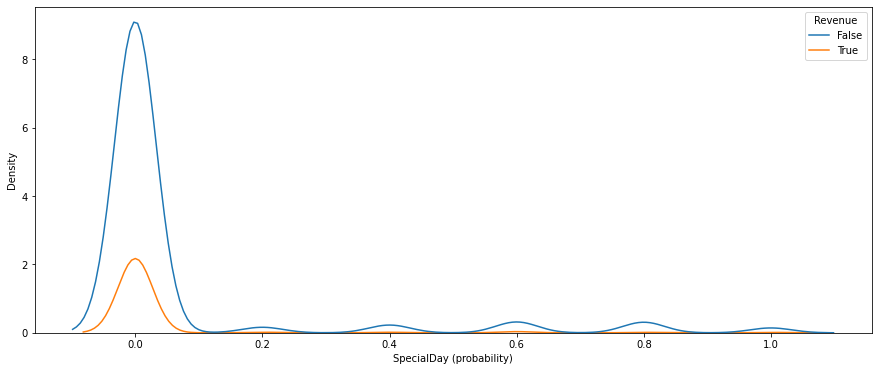

In [4]:
plt.figure(figsize=(15, 6))
sns.kdeplot(data=df, x='SpecialDay (probability)', hue='Revenue')
plt.show()

In [14]:
np.round(pd.crosstab(columns=df['Month'], index=df['SpecialDay (probability)'], values=df['Revenue'], aggfunc='count'), 2)

Month,Aug,Dec,Feb,Jul,June,Mar,May,Nov,Oct,Sep
SpecialDay (probability),,,,,,,,,,
0.0,433.0,1727.0,105.0,432.0,288.0,1907.0,2192.0,2998.0,549.0,448.0
0.2,NaN,NaN,15.0,NaN,NaN,NaN,163.0,NaN,NaN,NaN
0.4,NaN,NaN,21.0,NaN,NaN,NaN,222.0,NaN,NaN,NaN
0.6,NaN,NaN,19.0,NaN,NaN,NaN,332.0,NaN,NaN,NaN
0.8,NaN,NaN,19.0,NaN,NaN,NaN,306.0,NaN,NaN,NaN
1.0,NaN,NaN,5.0,NaN,NaN,NaN,149.0,NaN,NaN,NaN


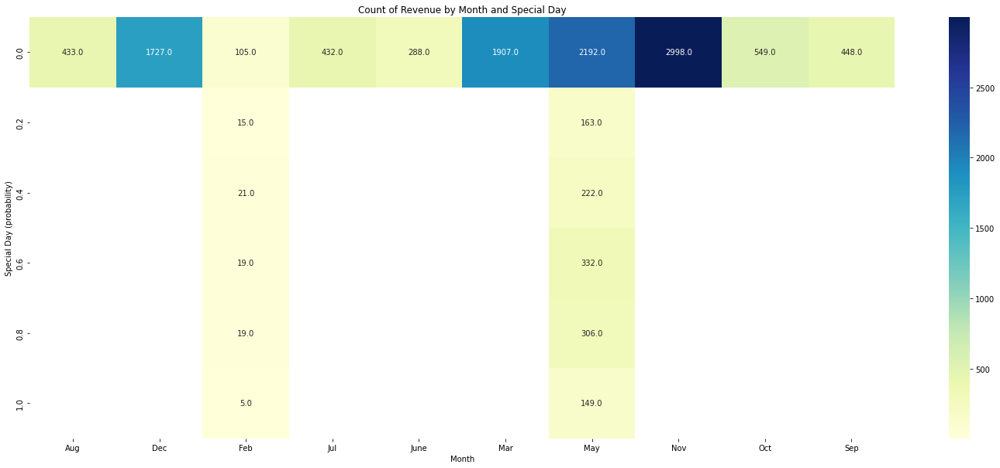

In [27]:
count_data = pd.crosstab(columns=df['Month'], index=df['SpecialDay (probability)'], values=df['Revenue'], 
                         aggfunc='count')

plt.figure(figsize=(25, 10))
sns.heatmap(count_data, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Count of Revenue by Month and Special Day')
plt.xlabel('Month')
plt.ylabel('Special Day (probability)')
plt.savefig('corr_month_specialday_revenue.png')
plt.show()

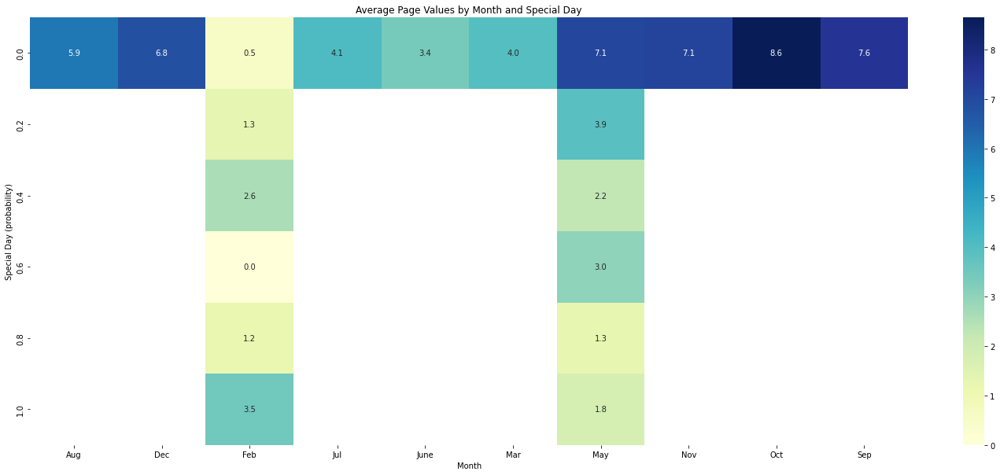

In [28]:
page_values_data = pd.crosstab(columns=df['Month'], index=df['SpecialDay (probability)'], values=df['PageValues'], aggfunc='mean')

plt.figure(figsize=(25, 10))
sns.heatmap(page_values_data, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Average Page Values by Month and Special Day')
plt.xlabel('Month')
plt.ylabel('Special Day (probability)')
plt.savefig('corr_month_specialday_page_values.png')
plt.show()

In [12]:
pd.crosstab(columns=df['Month'], index=df['SpecialDay (probability)'], values=df['PageValues'], aggfunc='mean')

Month,Aug,Dec,Feb,Jul,June,Mar,May,Nov,Oct,Sep
SpecialDay (probability),,,,,,,,,,
0.0,5.93807,6.833243,0.473790,4.104414,3.39144,3.959682,7.061279,7.129379,8.64558,7.556826
0.2,NaN,NaN,1.296472,NaN,NaN,NaN,3.910774,NaN,NaN,NaN
0.4,NaN,NaN,2.579989,NaN,NaN,NaN,2.248672,NaN,NaN,NaN
0.6,NaN,NaN,0.000000,NaN,NaN,NaN,3.017153,NaN,NaN,NaN
0.8,NaN,NaN,1.206107,NaN,NaN,NaN,1.270985,NaN,NaN,NaN
1.0,NaN,NaN,3.507192,NaN,NaN,NaN,1.786661,NaN,NaN,NaN


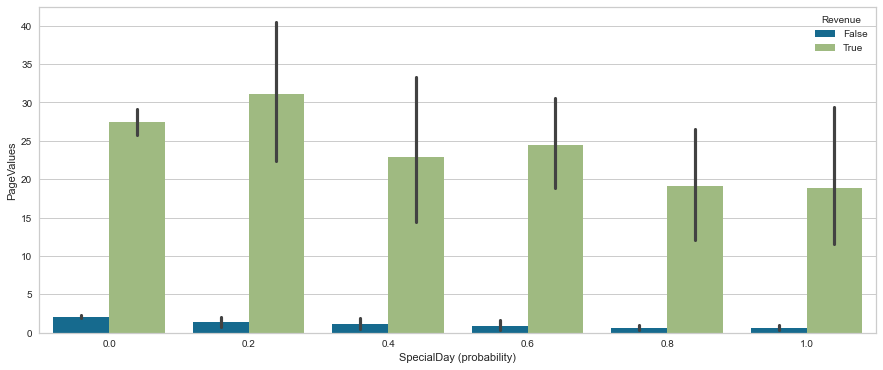

In [135]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='SpecialDay (probability)', y='PageValues', hue='Revenue')
plt.show()

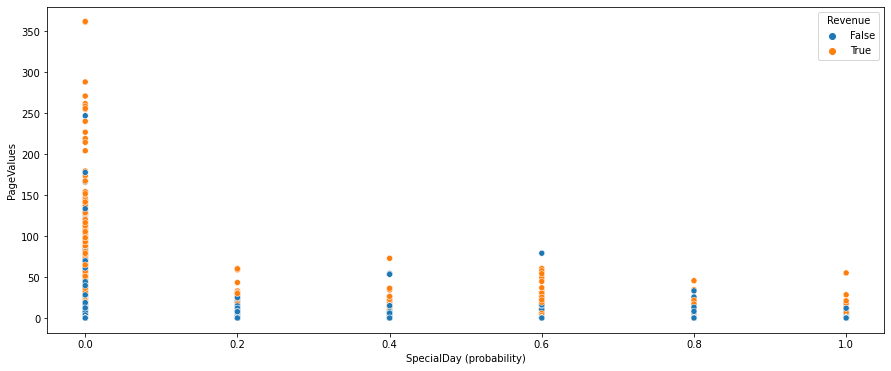

In [7]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='SpecialDay (probability)', y='PageValues', hue='Revenue')
plt.show()

In [6]:
df[['SpecialDay (probability)', 'PageValues', 'Revenue']].corr()

,SpecialDay (probability),PageValues,Revenue
SpecialDay (probability),1.000000,-0.063541,-0.082305
PageValues,-0.063541,1.000000,0.492569
Revenue,-0.082305,0.492569,1.000000


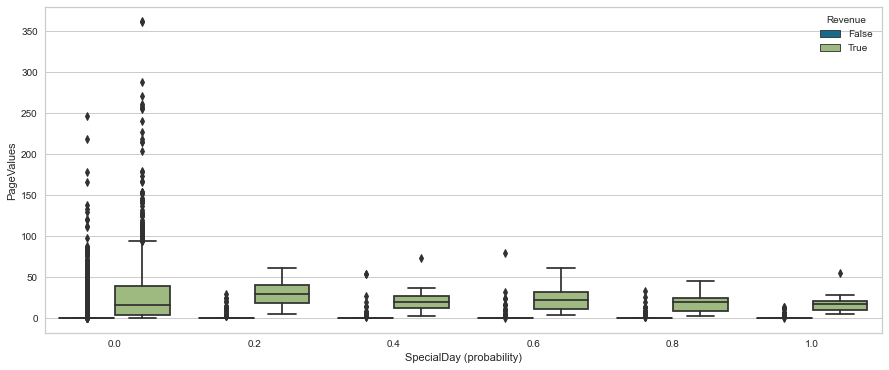

In [137]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, x='SpecialDay (probability)', y='PageValues', hue='Revenue')
plt.show()

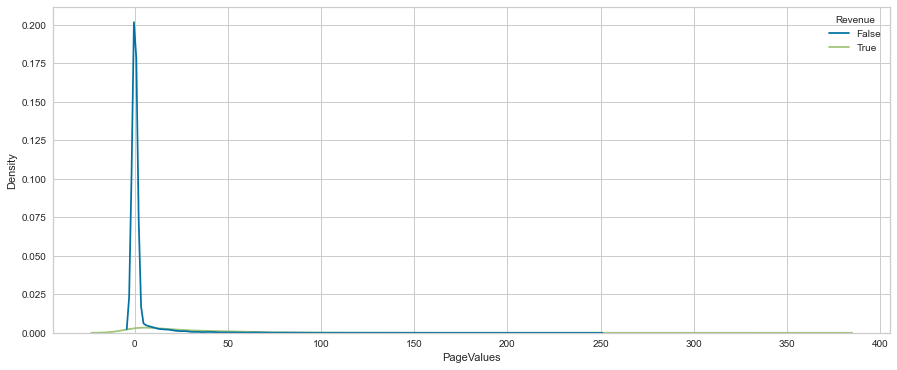

In [139]:
plt.figure(figsize=(15, 6))
sns.kdeplot(data=df, x='PageValues', hue='Revenue')
plt.show()

In [5]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [13]:
codes, uniques = pd.factorize(df['VisitorType'], sort=True)
codes

array([2, 2, 2, ..., 2, 2, 0], dtype=int64)

In [14]:
uniques

Index(['New_Visitor', 'Other', 'Returning_Visitor'], dtype='object')

In [6]:
df_copy = df.copy()

In [15]:
df['VisitorType'] = pd.factorize(df['VisitorType'])[0]
df['Month'] = pd.factorize(df['Month'])[0]

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Administrative            12330 non-null  int64  
 1   Administrative_Duration   12330 non-null  float64
 2   Informational             12330 non-null  int64  
 3   Informational_Duration    12330 non-null  float64
 4   ProductRelated            12330 non-null  int64  
 5   ProductRelated_Duration   12330 non-null  float64
 6   BounceRates in %          12330 non-null  float64
 7   ExitRates in %            12330 non-null  float64
 8   PageValues                12330 non-null  float64
 9   SpecialDay (probability)  12330 non-null  float64
 10  Month                     12330 non-null  int64  
 11  OperatingSystems          12330 non-null  int64  
 12  Browser                   12330 non-null  int64  
 13  Region                    12330 non-null  int64  
 14  Traffi

In [18]:
df['Weekend'] = df['Weekend'].astype('int64')
df['Revenue'] = df['Revenue'].astype('int64')

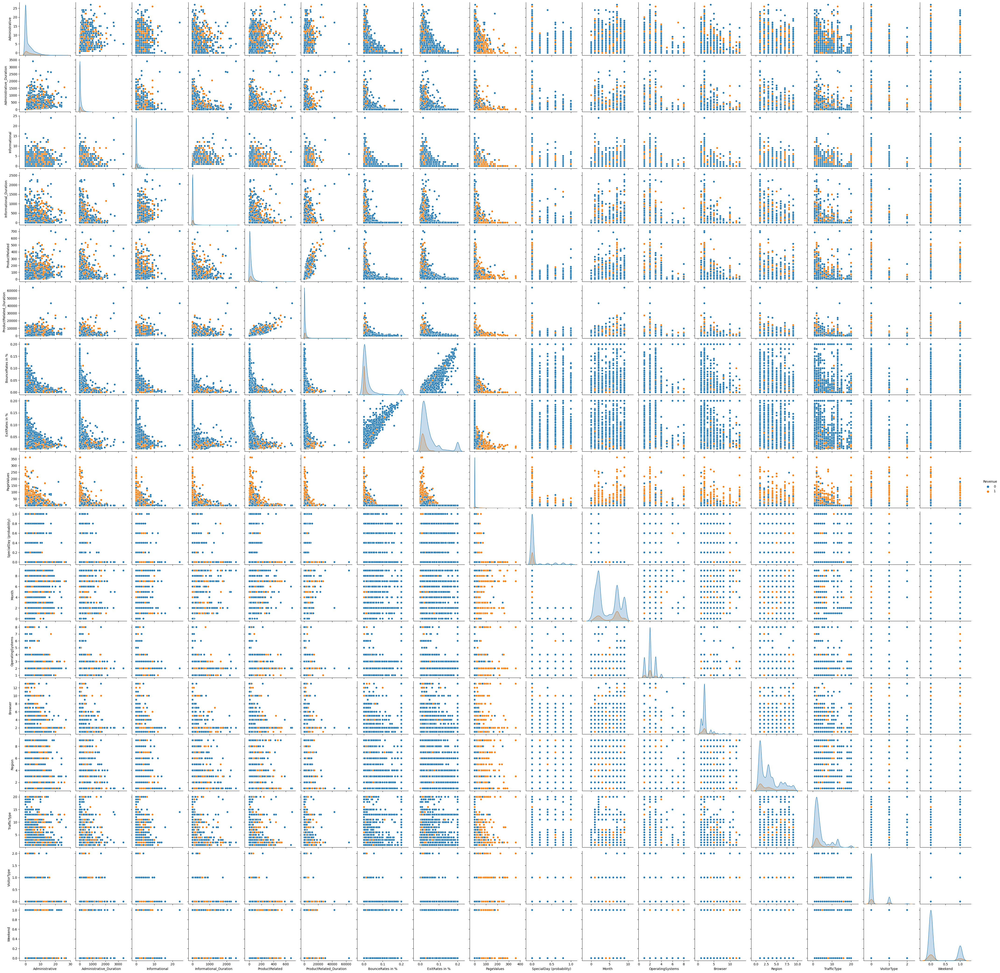

In [19]:
sns.pairplot(data=df, hue='Revenue')

<AxesSubplot:xlabel='PageValues', ylabel='Density'>

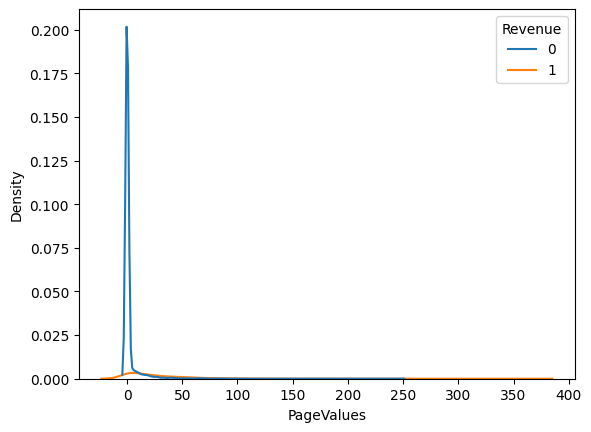

In [22]:
sns.kdeplot(data=df, x='PageValues', hue='Revenue')

In [23]:
df.loc[df['PageValues'] > 50, :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
29,1,6.000000,1,0.0,45,1582.750000,0.043478,0.050821,54.179764,0.4,0,3,2,1,1,0,0,0
198,0,0.000000,0,0.0,17,840.233333,0.000000,0.001667,109.176000,0.0,1,2,2,9,2,1,0,1
199,3,94.000000,2,125.0,55,1970.844805,0.000000,0.001724,96.255116,0.0,1,2,4,1,2,1,1,1
200,1,32.000000,0,0.0,50,2867.000000,0.000000,0.004000,153.443248,0.0,1,2,2,7,8,0,1,1
265,0,0.000000,0,0.0,63,5220.083333,0.000000,0.003330,51.463311,0.0,1,2,5,3,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12223,5,40.136364,0,0.0,35,840.995292,0.005263,0.012594,64.722389,0.0,7,2,2,1,1,0,0,1
12234,0,0.000000,0,0.0,36,872.833333,0.000000,0.007059,81.027296,0.0,7,2,4,1,8,1,0,1
12247,7,311.136111,0,0.0,36,1699.073611,0.010088,0.035614,133.281379,0.0,9,3,2,1,13,0,0,0
12272,6,133.466667,0,0.0,44,2664.445833,0.002041,0.010884,97.860836,0.0,7,2,2,1,3,0,1,1


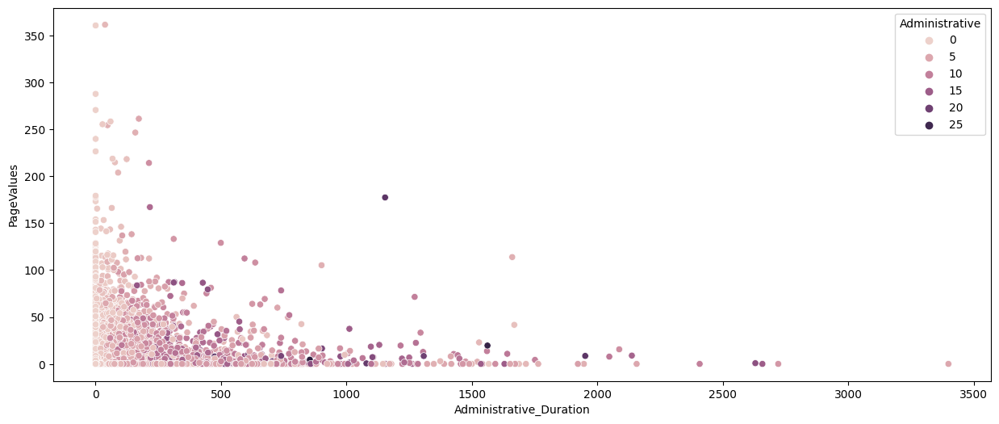

In [34]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='Administrative_Duration', y='PageValues', hue='Administrative')
plt.show()

In [29]:
(df['Administrative_Duration'] / df['PageValues'])

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
12325    11.844743
12326          NaN
12327          NaN
12328          inf
12329          NaN
Length: 12330, dtype: float64

In [31]:
(df['Informational_Duration'] / df['PageValues'])

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
12325    0.0
12326    NaN
12327    NaN
12328    NaN
12329    NaN
Length: 12330, dtype: float64

In [32]:
(df['ProductRelated_Duration'] / df['PageValues'])

0               NaN
1               inf
2               NaN
3               inf
4               inf
            ...    
12325    145.714168
12326           inf
12327           inf
12328           inf
12329           inf
Length: 12330, dtype: float64

<AxesSubplot:xlabel='Revenue', ylabel='PageValues'>

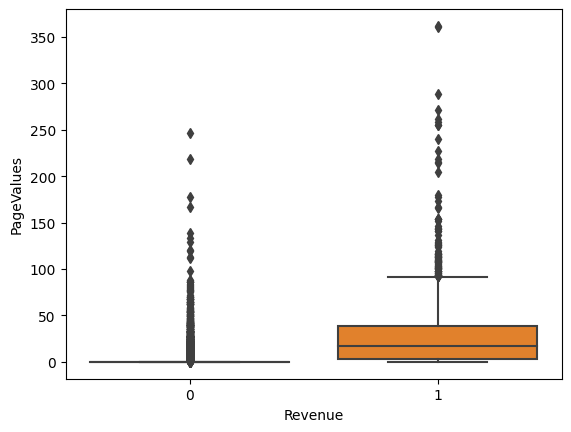

In [53]:
sns.boxplot(data=df, x='Revenue', y='PageValues')

<AxesSubplot:>

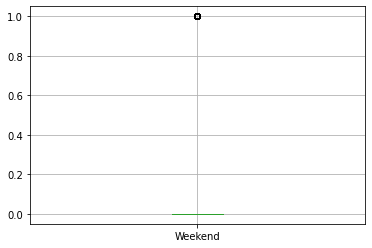

In [128]:
df.boxplot(['Weekend'])

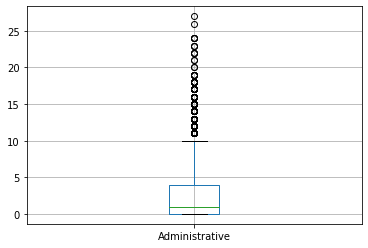

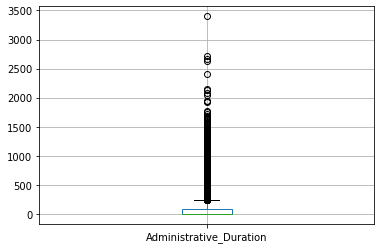

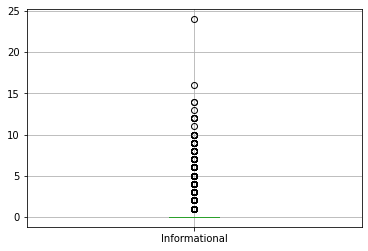

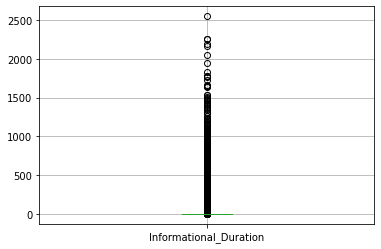

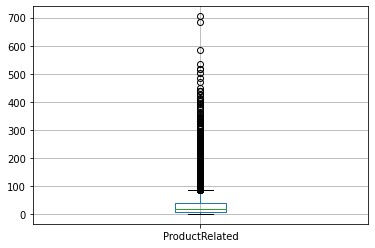

...

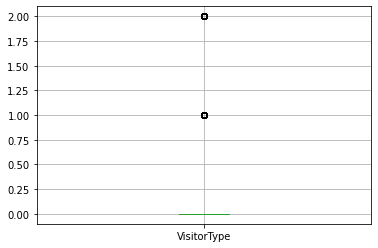

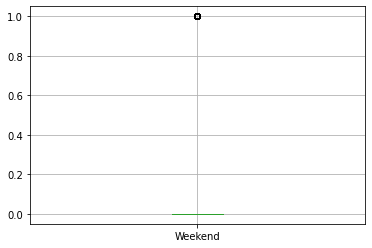

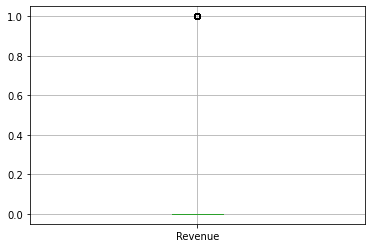

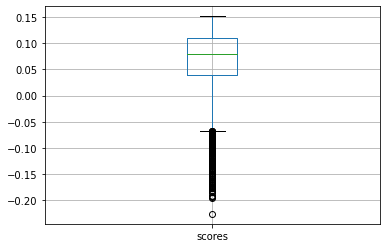

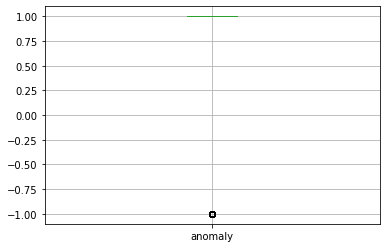

In [126]:
for column in df:
    plt.figure()
    df.boxplot([column])

In [51]:
from scipy import stats

In [70]:
Q1 = df.quantile(0.01)
Q3 = df.quantile(0.99)
IQR = df.apply(stats.iqr)

data_clean = df[~((df < (Q1-1.5*IQR)) | (df > (Q3+1.5*IQR))).any(axis=1)]

In [61]:
print(f"Shape before removing outliers (25% - 75%) : {df.shape}")
print(f"Shape after removing outliers (25% - 75%) : {data_clean.shape}")

Shape before removing outliers (25% - 75%) : (12330, 18)
Shape after removing outliers (25% - 75%) : (1590, 18)


In [63]:
print(f"Shape before removing outliers (5% - 95%) : {df.shape}")
print(f"Shape after removing outliers (5% - 95%) : {data_clean.shape}")

Shape before removing outliers (5% - 95%) : (12330, 18)
Shape after removing outliers (5% - 95%) : (9320, 18)


In [71]:
print(f"Shape before removing outliers (1% - 99%) : {df.shape}")
print(f"Shape after removing outliers (1% - 99%) : {data_clean.shape}")

Shape before removing outliers (1% - 99%) : (12330, 18)
Shape after removing outliers (1% - 99%) : (11711, 18)


In [77]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

In [78]:
X = data_clean.drop('Revenue', axis=1)
y = data_clean['Revenue']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y.values, test_size=0.2, random_state=42)

In [81]:
model = LogisticRegression(max_iter=10000, random_state=123, class_weight='balanced')
model.fit(X_train, y_train)
preds = model.predict(X_test)

print(classification_report(preds, y_test))

              precision    recall  f1-score   support

           0       0.90      0.96      0.93      1886
           1       0.77      0.57      0.65       457

    accuracy                           0.88      2343
   macro avg       0.84      0.76      0.79      2343
weighted avg       0.88      0.88      0.88      2343



In [72]:
from statsmodels.discrete.discrete_model import Logit

In [73]:
X = data_clean.drop('Revenue', axis=1)
y = data_clean['Revenue']

In [74]:
X_c = sm.add_constant(X)
model = Logit(y, X_c).fit()

Optimization terminated successfully.
         Current function value: 0.278430
         Iterations 9


In [75]:
print(model.summary())

                           Logit Regression Results                           
Dep. Variable:                Revenue   No. Observations:                11711
Model:                          Logit   Df Residuals:                    11693
Method:                           MLE   Df Model:                           17
Date:                Thu, 18 May 2023   Pseudo R-squ.:                  0.3254
Time:                        12:08:22   Log-Likelihood:                -3260.7
converged:                       True   LL-Null:                       -4833.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       -2.7518      0.156    -17.650      0.000      -3.057      -2.446
Administrative              -0.0080      0.013     -0.602      0.547      -0.034       0.

In [42]:
import statsmodels.api as sm

gamma_model = sm.GLM(y, X, family=sm.families.Binomial()).fit()

In [44]:
print(gamma_model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Revenue   No. Observations:                12330
Model:                            GLM   Df Residuals:                    12313
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3841.8
Date:                Thu, 18 May 2023   Deviance:                       7683.7
Time:                        11:40:01   Pearson chi2:                 1.71e+07
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2122
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Administrative          

In [45]:
gamma_model = sm.GLM(y, X, family=sm.families.Poisson()).fit()

In [46]:
print(gamma_model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Revenue   No. Observations:                12330
Model:                            GLM   Df Residuals:                    12313
Model Family:                 Poisson   Df Model:                           16
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4845.0
Date:                Thu, 18 May 2023   Deviance:                       5874.1
Time:                        11:40:31   Pearson chi2:                 1.32e+04
No. Iterations:                     8   Pseudo R-squ. (CS):            0.09615
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Administrative          

In [47]:
gamma_model = sm.GLM(y, X, family=sm.families.Tweedie()).fit()

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\genmod\families\family.py:1582: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\genmod\families\family.py:1582: RuntimeWarning: invalid value encountered in multiply
  endog * np.log(endog / mu) + (mu - endog))


In [48]:
print(gamma_model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Revenue   No. Observations:                12330
Model:                            GLM   Df Residuals:                    12313
Model Family:                 Tweedie   Df Model:                           16
Link Function:                    Log   Scale:                          1.0700
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Thu, 18 May 2023   Deviance:                       5874.1
Time:                        11:41:27   Pearson chi2:                 1.32e+04
No. Iterations:                    10   Pseudo R-squ. (CS):                nan
Covariance Type:            nonrobust                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Administrative          

In [89]:
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.lof import LOF

In [93]:
features = [col for col in df_copy.columns if col not in ['Revenue']]
features

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates in %',
 'ExitRates in %',
 'PageValues',
 'SpecialDay (probability)',
 'Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend']

In [95]:
df_copy['Month'] = pd.factorize(df['Month'])[0]
df_copy['VisitorType'] = pd.factorize(df['VisitorType'])[0]

In [96]:
scaler = StandardScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(df_copy[features]), index=df_copy[features].index, 
                         columns=df_copy[features].columns)

In [102]:
abod_model = ABOD(contamination=0.05, method='fast', n_neighbors=5)
abod_model.fit(X_train)

pred = abod_model.predict(X_train)

error = (pred != y_train).sum()
print (f'Error % = {(error/len(pred))*100}')

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3757: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3757: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:222: RuntimeWarning: 

Error % = 14.43210930828352


In [108]:
model = IForest(n_estimators=1000, max_samples='auto', contamination=float(0.1), max_features=1.0)
model.fit(X_train)

pred = model.predict(X_train)

error = (pred != y_train).sum()
print (f'Error % = {(error/len(pred))*100}')

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(


Error % = 19.075576430401366


In [109]:
from sklearn.ensemble import IsolationForest

In [183]:
model=IsolationForest(n_estimators=1000, max_samples='auto', contamination=float(0.1), random_state=42)
model.fit(df_copy[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.1, n_estimators=1000, random_state=42)

In [184]:
df['scores'] = model.decision_function(df_copy[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])
df['anomaly'] = model.predict(df_copy[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])
df.head(20)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,0,1,1,1,1,0,0,0,0.034187,1
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.0,0.0,0,2,2,1,2,0,0,0,0.128695,1
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,0,4,1,9,3,0,0,0,0.034187,1
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.0,0.0,0,3,2,2,4,0,0,0,0.080792,1
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.0,0.0,0,3,3,1,4,0,1,0,0.150593,1
5,0,0.0,0,0.0,19,154.216667,0.015789,0.024561,0.0,0.0,0,2,2,1,3,0,0,0,0.151367,1
6,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.4,0,2,4,3,3,0,0,0,0.034187,1
7,1,0.0,0,0.0,0,0.000000,0.200000,0.200000,0.0,0.0,0,1,2,1,5,0,1,0,-0.008059,-1
8,0,0.0,0,0.0,2,37.000000,0.000000,0.100000,0.0,0.8,0,2,2,2,3,0,0,0,0.128289,1
9,0,0.0,0,0.0,3,738.000000,0.000000,0.022222,0.0,0.4,0,2,4,1,2,0,0,0,0.157461,1


In [185]:
anomaly=df.loc[df['anomaly']==-1]
anomaly_index=list(anomaly.index)

In [186]:
anomaly

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
7,1,0.000000,0,0.00,0,0.000000,0.200000,0.200000,0.000000,0.0,0,1,2,1,5,0,1,0,-0.008059,-1
21,0,0.000000,0,0.00,2,0.000000,0.200000,0.200000,0.000000,0.0,0,3,3,1,3,0,0,0,-0.012341,-1
29,1,6.000000,1,0.00,45,1582.750000,0.043478,0.050821,54.179764,0.4,0,3,2,1,1,0,0,0,-0.003928,-1
76,10,1005.666667,0,0.00,36,2111.341667,0.004348,0.014493,11.439412,0.0,0,2,6,1,2,0,0,1,-0.022579,-1
109,6,326.250000,4,94.00,128,5062.213753,0.000855,0.017918,0.000000,0.0,0,2,5,1,3,0,0,0,-0.017547,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12301,0,0.000000,0,0.00,2,0.000000,0.200000,0.200000,0.000000,0.0,7,1,1,4,1,0,0,0,-0.012341,-1
12307,2,305.125000,3,368.25,27,1121.250000,0.020000,0.042857,39.519807,0.0,9,3,2,1,2,0,0,0,-0.057113,-1
12312,7,150.357143,1,9.00,221,11431.001240,0.011149,0.021904,1.582473,0.0,7,2,5,1,2,0,1,1,-0.071641,-1
12313,3,16.000000,3,86.00,15,2773.500000,0.000000,0.030000,78.811725,0.0,9,2,2,1,2,0,0,1,-0.033551,-1


In [132]:
df.groupby('Administrative')[['Administrative_Duration', 'PageValues']].agg(['mean', 'median', 'count', 'skew'])

Administrative_Duration                               \
                                  mean       median count      skew   
Administrative                                                        
0                             0.000000     0.000000  5768  0.000000   
1                            42.498097    20.100000  1354  8.150144   
2                            86.221918    48.916667  1114  6.196393   
3                           116.705127    74.000000   915  5.174805   
4                           147.919727    93.500000   765  4.748026   
5                           180.173656   112.333333   575  6.428681   
6                           203.345833   136.102778   432  3.894338   
7                           202.869406   150.750000   338  6.175512   
8                           259.517689   185.000000   287  3.282252   
9                           270.417164   210.666667   225  2.192718   
10                          357.780888   247.750000   153  2.960013   
11                          388.352386   286.933333   105  2.581206   
12                          363.100097   256.633333    86  2.052222   
13                          379.089782   312.431713    56  2.047316   
14                          487.852399   341.693274    44  2.160466   
15                          503.589234   313.326136    38  2.792051   
16                          373.663094   309.433333    24  1.478014   
17                          593.205154   396.821487    16  2.801329   
18                          446.174254   271.055952    12  1.306607   
19                          553.437002   553.527820     6  0.090964   
20                          753.565636   753.565636     2       NaN   
21                          618.536324   618.536324     2       NaN   
22                         1004.442189   814.079332     4  0.964608   
23                          299.272384   322.941667     3 -1.625236   
24                          457.833239   379.480516     4  1.240528   
26                         1561.717567  1561.717567     1       NaN   
27                          853.735949   853.735949     1       NaN   

               PageValues                             
                     mean     median count      skew  
Administrative                                        
0                3.352355   0.000000  5768  8.522484  
1                8.425506   0.000000  1354  4.960838  
2                8.013220   0.000000  1114  4.490932  
3                6.822536   0.000000   915  8.115062  
4                6.964674   0.000000   765  6.170858  
5                8.174606   0.000000   575  5.469345  
6                8.446823   0.000000   432  3.396951  
7                8.559837   0.000000   338  3.400449  
8               10.249913   0.384720   287  4.917464  
9                8.837289   1.725866   225  2.556654  
10               8.565022   1.088158   153  3.301921  
11               8.526647   4.289679   105  1.989224  
12               7.513370   1.134381    86  2.714163  
13              13.705558   4.154417    56  4.035395  
14               8.300987   4.160649    44  1.334257  
15               7.609648   2.715397    38  2.082919  
16              15.550440   3.695102    24  2.095200  
17              13.015585   2.330281    16  2.428456  
18               4.660262   0.653841    12  2.284338  
19               6.054336   4.050692     6  1.445881  
20               4.276907   4.276907     2       NaN  
21               0.274406   0.274406     2       NaN  
22              49.002687   8.221762     4  1.992968  
23               4.529859   6.277684     3 -1.599890  
24               2.408236   1.741801     4  1.151024  
26              19.567464  19.567464     1       NaN  
27               4.511100   4.511100     1       NaN

<AxesSubplot:xlabel='Administrative_Duration', ylabel='PageValues'>

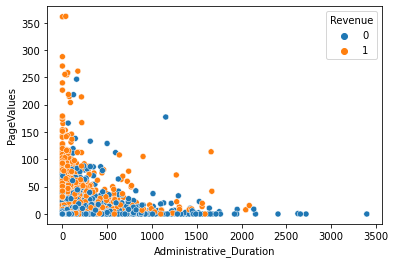

In [134]:
sns.scatterplot(data=df, x='Administrative_Duration', y='PageValues', hue='Revenue')

<AxesSubplot:xlabel='ProductRelated_Duration', ylabel='PageValues'>

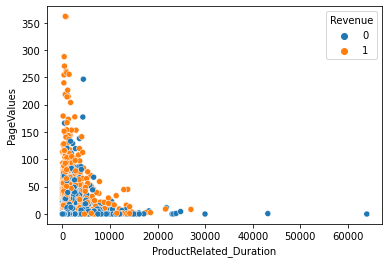

In [144]:
sns.scatterplot(data=df, x='ProductRelated_Duration', y='PageValues', hue='Revenue')

In [149]:
df.loc[df['anomaly'] == -1]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
2,0,0.000000,0,0.00,1,0.000000,0.200000,0.200000,0.000000,0.0,0,4,1,9,3,0,0,0,-0.023269,-1
6,0,0.000000,0,0.00,1,0.000000,0.200000,0.200000,0.000000,0.4,0,2,4,3,3,0,0,0,-0.000454,-1
7,1,0.000000,0,0.00,0,0.000000,0.200000,0.200000,0.000000,0.0,0,1,2,1,5,0,1,0,-0.014863,-1
50,0,0.000000,0,0.00,1,0.000000,0.200000,0.200000,0.000000,0.0,0,1,1,3,4,0,1,0,-0.012868,-1
56,0,0.000000,0,0.00,1,0.000000,0.200000,0.200000,0.000000,0.6,0,3,2,3,3,0,0,0,-0.008486,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12287,8,167.910714,6,547.75,111,6340.152381,0.003361,0.009432,44.219794,0.0,9,3,2,6,2,0,0,0,-0.063869,-1
12303,0,0.000000,0,0.00,3,172.000000,0.000000,0.066667,0.000000,0.0,9,2,13,9,20,0,0,0,-0.030390,-1
12312,7,150.357143,1,9.00,221,11431.001240,0.011149,0.021904,1.582473,0.0,7,2,5,1,2,0,1,1,-0.065468,-1
12314,0,0.000000,0,0.00,7,705.833333,0.028571,0.085714,0.000000,0.0,9,5,11,4,1,0,1,0,-0.017139,-1


In [148]:
df[(df['ProductRelated_Duration'] < 1000)].loc[(df['PageValues'] > 0) & (df['Revenue'] == 1), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
65,3,87.833333,0,0.0,27,798.333333,0.000000,0.012644,22.916036,0.8,0,2,2,3,1,0,0,1,0.019448,1
101,4,61.000000,0,0.0,19,607.000000,0.000000,0.026984,17.535959,1.0,0,1,1,7,4,0,1,1,-0.047573,-1
198,0,0.000000,0,0.0,17,840.233333,0.000000,0.001667,109.176000,0.0,1,2,2,9,2,1,0,1,-0.027243,-1
220,2,38.000000,0,0.0,14,643.000000,0.000000,0.013333,35.092800,0.0,1,2,2,5,1,0,0,1,0.075177,1
248,16,155.631313,0,0.0,32,908.013456,0.005000,0.018053,4.368516,0.0,1,2,2,3,2,0,0,1,0.037802,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12223,5,40.136364,0,0.0,35,840.995292,0.005263,0.012594,64.722389,0.0,7,2,2,1,1,0,0,1,0.063222,1
12228,0,0.000000,0,0.0,14,999.000000,0.000000,0.023077,8.482952,0.0,9,2,2,3,6,0,0,1,0.087553,1
12234,0,0.000000,0,0.0,36,872.833333,0.000000,0.007059,81.027296,0.0,7,2,4,1,8,1,0,1,0.004184,1
12267,0,0.000000,0,0.0,5,277.500000,0.000000,0.040000,42.030441,0.0,7,2,2,3,2,0,0,1,0.082778,1


In [142]:
df[df['Administrative_Duration'] == 0].loc[(df['PageValues'] > 0) & (df['Revenue'] == 1), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
198,0,0.0,0,0.0,17,840.233333,0.000000,0.001667,109.176000,0.0,1,2,2,9,2,1,0,1,-0.027243,-1
228,0,0.0,0,0.0,16,2337.000000,0.000000,0.013333,17.762667,0.0,1,2,2,1,1,0,0,1,0.083371,1
265,0,0.0,0,0.0,63,5220.083333,0.000000,0.003330,51.463311,0.0,1,2,5,3,1,0,1,1,-0.023541,-1
281,0,0.0,0,0.0,11,300.071429,0.000000,0.020000,53.989200,0.0,1,2,2,1,11,0,1,1,0.019154,1
295,0,0.0,0,0.0,13,328.916667,0.000000,0.014286,59.790143,0.0,1,3,2,1,3,0,0,1,0.060265,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12210,0,0.0,0,0.0,16,853.416667,0.013333,0.037778,50.814180,0.0,9,1,1,7,2,1,0,1,-0.001215,-1
12228,0,0.0,0,0.0,14,999.000000,0.000000,0.023077,8.482952,0.0,9,2,2,3,6,0,0,1,0.087553,1
12234,0,0.0,0,0.0,36,872.833333,0.000000,0.007059,81.027296,0.0,7,2,4,1,8,1,0,1,0.004184,1
12252,0,0.0,0,0.0,24,1010.250000,0.008333,0.016667,31.819677,0.0,9,3,2,8,2,0,0,1,0.043982,1


In [143]:
df[(df['Administrative_Duration'] == 0) & (df['Informational_Duration'] == 0) & 
   (df['ProductRelated_Duration'] == 0)].loc[(df['PageValues'] > 0) & (df['Revenue'] == 1), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly


In [150]:
def find_anomalies(df):
    # Create a boolean mask for rows where all page columns are 0
    page_columns = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration']
    mask = (df[page_columns] == 0).all(axis=1)
    
    # Filter the rows using the mask and check for page value > 0
    anomalies = df[mask & (df['PageValues'] > 0)]
    
    return anomalies

In [151]:
find_anomalies(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly


In [152]:
def find_anomalies(df):
    # Create a boolean mask for rows where all page columns are 0
    page_columns = ['Administrative_Duration', 'Informational_Duration', 'ProductRelated_Duration']
    mask = (df[page_columns] == 0).any(axis=1)
    
    # Filter the rows using the mask and check for page value > 0
    anomalies = df[mask & (df['PageValues'] > 0)]
    
    return anomalies

In [153]:
find_anomalies(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
29,1,6.000000,1,0.0,45,1582.750000,0.043478,0.050821,54.179764,0.4,0,3,2,1,1,0,0,0,0.009054,1
62,12,279.416667,0,0.0,42,1553.583333,0.009000,0.019667,38.308493,0.0,0,1,1,3,2,0,0,0,0.028019,1
65,3,87.833333,0,0.0,27,798.333333,0.000000,0.012644,22.916036,0.8,0,2,2,3,1,0,0,1,0.019448,1
76,10,1005.666667,0,0.0,36,2111.341667,0.004348,0.014493,11.439412,0.0,0,2,6,1,2,0,0,1,-0.034220,-1
101,4,61.000000,0,0.0,19,607.000000,0.000000,0.026984,17.535959,1.0,0,1,1,7,4,0,1,1,-0.047573,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12273,5,134.333333,0,0.0,56,959.811742,0.000000,0.011421,11.618644,0.0,7,2,2,1,1,0,1,0,0.088501,1
12276,7,139.575000,0,0.0,30,986.500000,0.000000,0.011429,36.392861,0.0,9,2,10,1,2,1,0,1,-0.023764,-1
12278,5,181.866667,0,0.0,192,4845.989214,0.005412,0.022099,18.675649,0.0,7,2,2,1,1,0,0,0,0.061574,1
12319,0,0.000000,0,0.0,21,1128.583333,0.000000,0.013043,3.685401,0.0,9,2,2,1,2,0,0,0,0.135496,1


In [158]:
df['BounceRates in %'] * 100

0        20.000000
1         0.000000
2        20.000000
3         5.000000
4         2.000000
           ...    
12325     0.714286
12326     0.000000
12327     8.333333
12328     0.000000
12329     0.000000
Name: BounceRates in %, Length: 12330, dtype: float64

In [159]:
def find_anomalies(df):
    # Create a boolean mask for rows where BounceRates and ExitRates are 100%
    df['BounceRates in %'] * 100
    mask = ((df['BounceRates in %'] * 100) > 0) & ((df['ExitRates in %'] * 100) > 0)
    
    # Filter the rows using the mask and check for PageValues > 0
    anomalies = df[mask & (df['PageValues'] > 0)]
    
    return anomalies

In [160]:
find_anomalies(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
29,1,6.000000,1,0.00,45,1582.750000,0.043478,0.050821,54.179764,0.4,0,3,2,1,1,0,0,0,0.009054,1
62,12,279.416667,0,0.00,42,1553.583333,0.009000,0.019667,38.308493,0.0,0,1,1,3,2,0,0,0,0.028019,1
76,10,1005.666667,0,0.00,36,2111.341667,0.004348,0.014493,11.439412,0.0,0,2,6,1,2,0,0,1,-0.034220,-1
185,0,0.000000,0,0.00,20,927.450000,0.011111,0.027249,8.000741,0.0,1,1,1,3,1,0,0,0,0.121527,1
189,3,47.000000,1,51.00,68,3008.124108,0.007143,0.016728,46.530175,0.0,1,2,2,1,1,0,0,0,0.068574,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12278,5,181.866667,0,0.00,192,4845.989214,0.005412,0.022099,18.675649,0.0,7,2,2,1,1,0,0,0,0.061574,1
12287,8,167.910714,6,547.75,111,6340.152381,0.003361,0.009432,44.219794,0.0,9,3,2,6,2,0,0,0,-0.063869,-1
12307,2,305.125000,3,368.25,27,1121.250000,0.020000,0.042857,39.519807,0.0,9,3,2,1,2,0,0,0,0.017361,1
12312,7,150.357143,1,9.00,221,11431.001240,0.011149,0.021904,1.582473,0.0,7,2,5,1,2,0,1,1,-0.065468,-1


<AxesSubplot:xlabel='SpecialDay (probability)', ylabel='PageValues'>

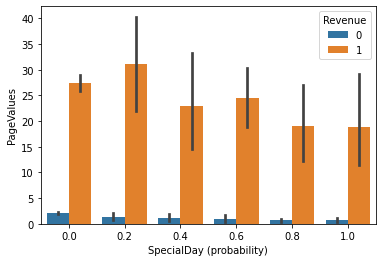

In [167]:
sns.barplot(data=df, x='SpecialDay (probability)', y='PageValues', hue='Revenue')

In [164]:
def find_anomalies_1(df):
    # Create a boolean mask for rows where SpecialDay is 1
    mask = (df['SpecialDay (probability)'] == 1)
    
    # Filter the rows using the mask and check for PageValues == 0
    anomalies = df[mask & (df['PageValues'] == 0)]
    
    return anomalies

In [165]:
find_anomalies_1(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
20,0,0.000000,0,0.0,8,136.166667,0.000000,0.008333,0.0,1.0,0,2,2,5,1,0,1,0,0.023448,1
52,0,0.000000,0,0.0,2,29.000000,0.000000,0.100000,0.0,1.0,0,2,4,4,2,0,1,0,0.002029,1
78,0,0.000000,0,0.0,1,0.000000,0.200000,0.200000,0.0,1.0,0,1,1,1,3,0,1,0,-0.068911,-1
174,5,41.300000,0,0.0,24,446.927778,0.000000,0.008602,0.0,1.0,0,2,2,8,1,0,1,0,-0.004912,-1
2140,9,175.933333,0,0.0,28,717.219048,0.005882,0.017059,0.0,1.0,2,2,2,5,4,0,1,0,0.008526,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5328,0,0.000000,0,0.0,3,69.000000,0.000000,0.066667,0.0,1.0,2,3,2,1,20,0,1,0,-0.018020,-1
5330,0,0.000000,0,0.0,14,128.500000,0.071429,0.114286,0.0,1.0,2,3,2,1,13,0,1,0,-0.015512,-1
5360,4,200.523809,0,0.0,36,1934.990476,0.042083,0.043815,0.0,1.0,2,3,2,7,2,0,1,0,-0.010453,-1
5373,0,0.000000,0,0.0,38,1417.666667,0.016117,0.048718,0.0,1.0,2,2,6,3,6,0,1,0,0.010335,1


In [173]:
def find_anomalies_2(df):
    # Create a boolean mask for rows where VisitorType is 'Returning_Visitor'
    mask = (df['VisitorType'] == 'Returning_Visitor')
    
    # Filter the rows using the mask and check for BounceRates and ExitRates > 50%
    anomalies = df[mask & ((df['BounceRates in %'] * 100) > 0.5) & ((df['ExitRates in %'] * 100) > 0.5)]
    
    return anomalies

In [174]:
find_anomalies_2(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly


In [175]:
def find_anomalies_3(df):
    # Create a boolean mask for rows where Weekend is True
    mask = (df['Weekend'] == True)
    
    # Filter the rows using the mask and check for Administrative_Duration and Informational_Duration == 0
    anomalies = df[mask & (df['Administrative_Duration'] == 0) & (df['Informational_Duration'] == 0)]
    
    return anomalies

In [176]:
find_anomalies_3(df)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.0,0.0,0,3,3,1,4,0,1,0,0.083549,1
7,1,0.0,0,0.0,0,0.000000,0.200000,0.200000,0.0,0.0,0,1,2,1,5,0,1,0,-0.014863,-1
17,0,0.0,0,0.0,13,334.966667,0.000000,0.007692,0.0,0.0,0,1,1,1,4,0,1,0,0.085669,1
20,0,0.0,0,0.0,8,136.166667,0.000000,0.008333,0.0,1.0,0,2,2,5,1,0,1,0,0.023448,1
24,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,0,2,2,4,1,0,1,0,0.004891,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12315,0,0.0,0,0.0,7,212.500000,0.000000,0.033333,0.0,0.0,7,3,2,1,11,0,1,0,0.096417,1
12318,0,0.0,0,0.0,6,279.000000,0.000000,0.033333,0.0,0.0,9,1,2,3,10,0,1,0,0.082164,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.0,0.0,7,3,2,1,8,0,1,0,0.102318,1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.0,0.0,7,3,2,1,13,0,1,0,0.049519,1


In [291]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

In [248]:
anomaly_inputs = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 
                   'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']

In [298]:
model=OneClassSVM(kernel='rbf', nu=0.01)
model.fit(df[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 
                   'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])

df['scores_SVM'] = model.decision_function(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                                'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                                'BounceRates in %', 'ExitRates in %', 'PageValues']])
df['anomaly_SVM'] = model.predict(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                       'BounceRates in %', 'ExitRates in %', 'PageValues']])

In [280]:
model=IsolationForest(n_estimators=1000, max_samples='auto', contamination=float(0.01), random_state=42)
model.fit(df[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 
                   'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])

df['scores_IF'] = model.decision_function(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                                'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                                'BounceRates in %', 'ExitRates in %', 'PageValues']])
df['anomaly_IF'] = model.predict(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                       'BounceRates in %', 'ExitRates in %', 'PageValues']])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [281]:
model=LocalOutlierFactor(n_neighbors=5, contamination=float(0.01), novelty=True)
model.fit(df[['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 
                   'ProductRelated', 'ProductRelated_Duration', 'BounceRates in %', 'ExitRates in %', 'PageValues']])

df['scores_LOF'] = model.decision_function(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                                'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                                'BounceRates in %', 'ExitRates in %', 'PageValues']])
df['anomaly_LOF'] = model.predict(df[['Administrative', 'Administrative_Duration', 'Informational', 
                                       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 
                                       'BounceRates in %', 'ExitRates in %', 'PageValues']])

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


In [299]:
def outliers(data, outlier_method_name, x_var, y_var, name={'Isolation Forest': 'IF', 'Local Outlier Factor': 'LOF', 'One Class SVM': 'SVM'}):
    print(f"Outlier Method Name: {outlier_method_name}")
    method = f"anomaly_{name[outlier_method_name]}"
    print(f"Number of anomalous values: {len(data[data[method] == -1])}")
    print(f"Number of non-anomalous values: {len(data[data[method] == 1])}")
    print(f"Number of total values: {len(data)}")
    g = sns.FacetGrid(data=data, col=method, height=4, hue=method, hue_order=[1, -1])
    g.map(sns.scatterplot, x_var, y_var)
    g.fig.suptitle(f"Outlier Method: {outlier_method_name}", y=1.10, fontweight='bold')
    axes = g.axes.flatten()
    axes[0].set_title(f"Outliers\n{len(data[data[method] == -1])} points")
    axes[1].set_title(f"Inliers\n{len(data[data[method] == 1])} points")
    return g

Outlier Method Name: Isolation Forest
Number of anomalous values: 124
Number of non-anomalous values: 12206
Number of total values: 12330


C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


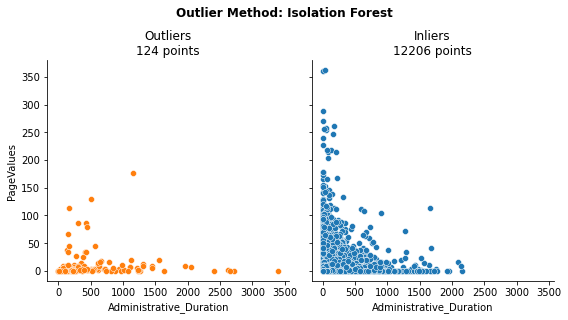

In [287]:
outliers(df, 'Isolation Forest', 'Administrative_Duration', 'PageValues')

Outlier Method Name: Local Outlier Factor
Number of anomalous values: 81
Number of non-anomalous values: 12249
Number of total values: 12330


C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


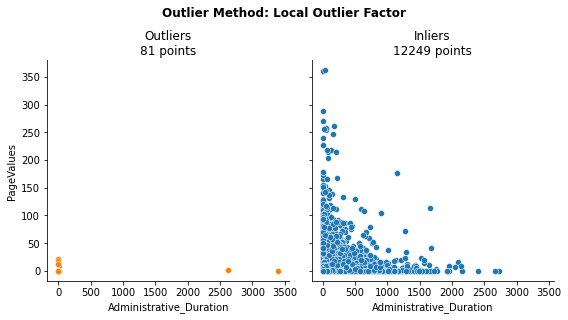

In [288]:
outliers(df, 'Local Outlier Factor', 'Administrative_Duration', 'PageValues')

Outlier Method Name: One Class SVM
Number of anomalous values: 117
Number of non-anomalous values: 12213
Number of total values: 12330


C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


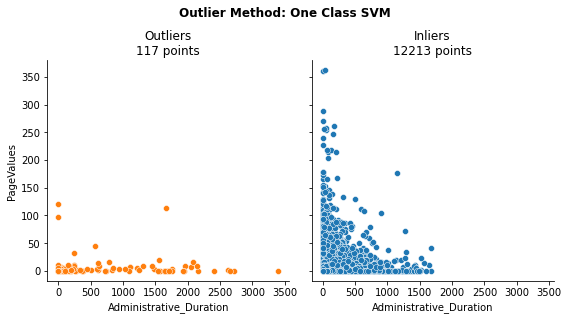

In [300]:
outliers(df, 'One Class SVM', 'Administrative_Duration', 'PageValues')

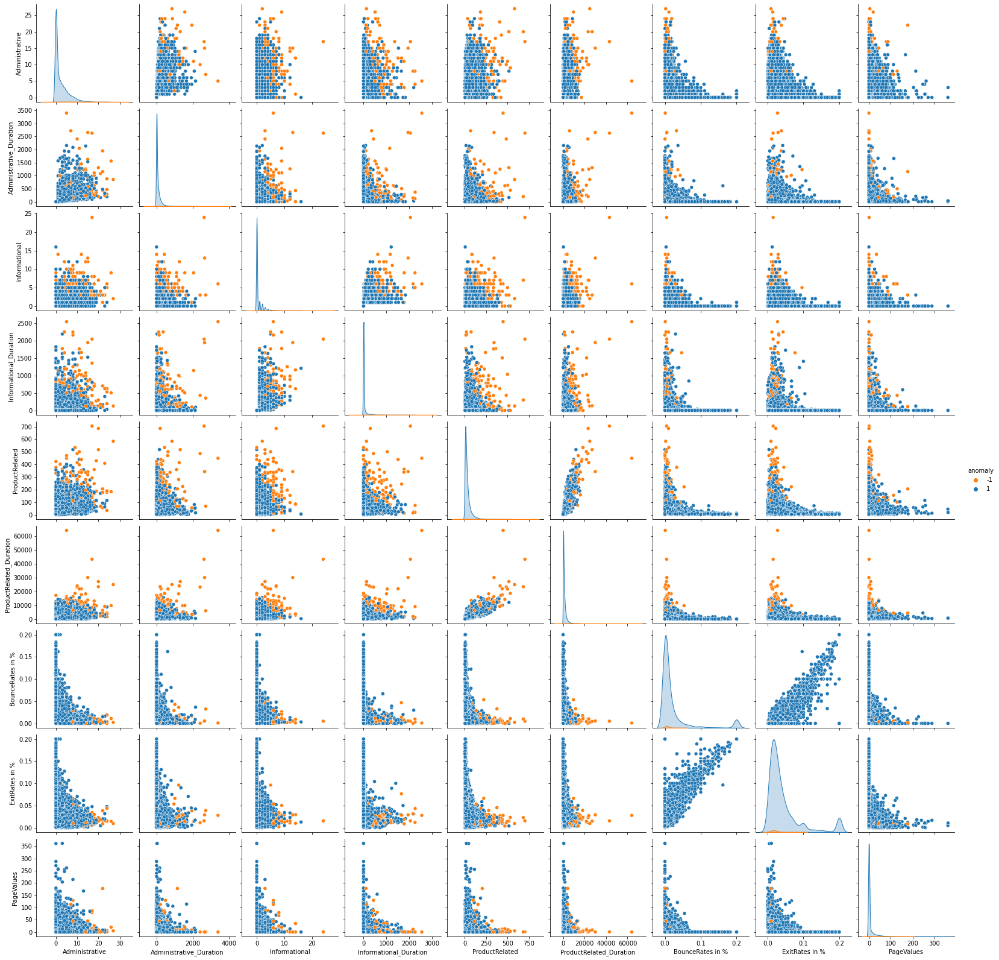

In [260]:
palette = ['#ff7f0e', '#1f77b4']
sns.pairplot(data=df, vars=anomaly_inputs, hue='anomaly', palette=palette)

In [259]:
df.loc[df['anomaly'] == -1]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly
191,3,1226.000000,5,3.000000,24,3230.250000,0.036190,0.096000,0.000000,0.0,Mar,2,2,1,2,Returning_Visitor,False,False,-0.011270,-1
373,1,3.000000,14,1165.166667,81,2820.952419,0.008897,0.029431,0.000000,0.0,Mar,2,2,3,2,Returning_Visitor,False,False,-0.001793,-1
502,18,280.950000,6,762.500000,79,2096.911364,0.003333,0.014009,25.967020,0.0,Mar,2,4,2,2,Returning_Visitor,False,False,-0.023928,-1
510,14,416.392857,6,449.333333,258,11301.204160,0.000000,0.007425,33.611792,0.0,Mar,2,4,9,2,Returning_Visitor,False,True,-0.085167,-1
769,15,937.174603,3,357.000000,109,6682.677557,0.000833,0.005345,2.526617,0.0,Mar,1,2,3,2,Returning_Visitor,False,False,-0.017770,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11888,6,337.000000,4,693.000000,261,14150.546130,0.005983,0.026011,0.951934,0.0,Nov,2,2,3,2,Returning_Visitor,False,True,-0.042727,-1
11986,12,397.716667,3,431.333333,336,12595.627760,0.002377,0.013316,1.178990,0.0,Nov,2,2,1,11,Returning_Visitor,False,True,-0.041977,-1
11988,14,228.748539,6,121.583333,336,12166.694240,0.000000,0.012144,0.067050,0.0,Nov,2,2,7,2,Returning_Visitor,False,True,-0.051621,-1
12178,26,1561.717567,9,503.722222,183,9676.093180,0.011055,0.014200,19.567464,0.0,Nov,3,2,2,13,Returning_Visitor,False,True,-0.124161,-1


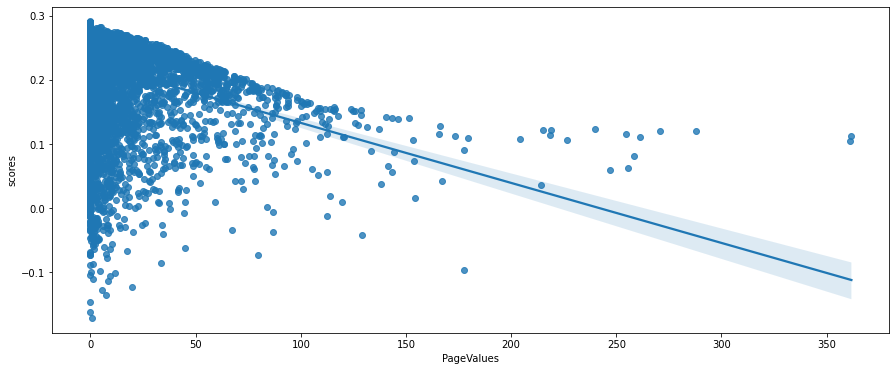

In [267]:
plt.figure(figsize=(15, 6))
sns.regplot(data=df, x='PageValues', y='scores')
plt.show()

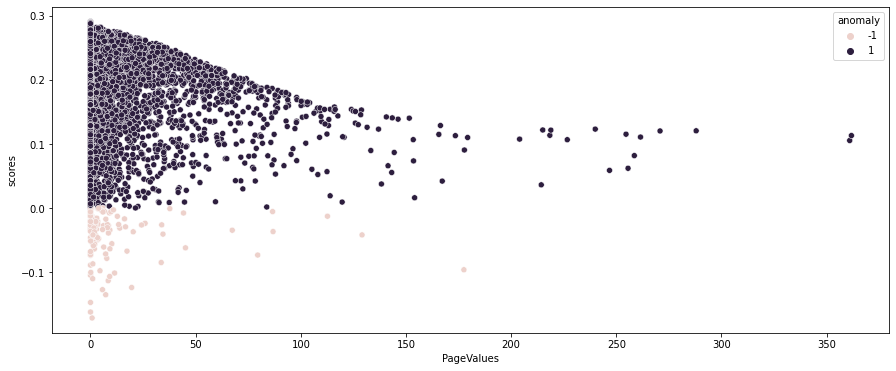

In [268]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='PageValues', y='scores', hue='anomaly')
plt.show()

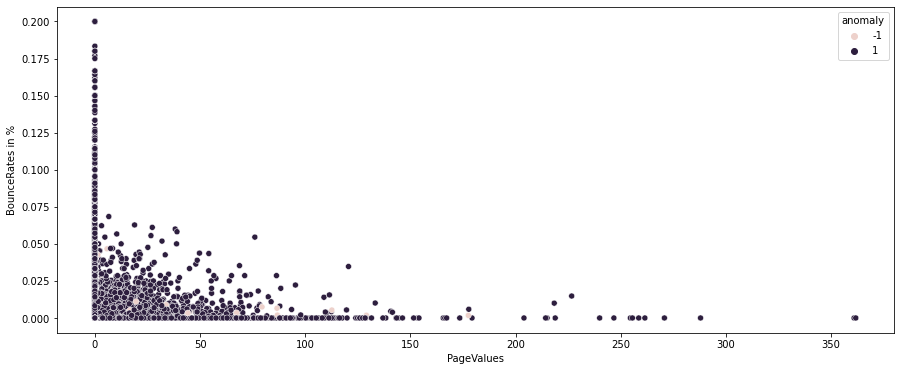

In [269]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='PageValues', y='BounceRates in %', hue='anomaly')
plt.show()

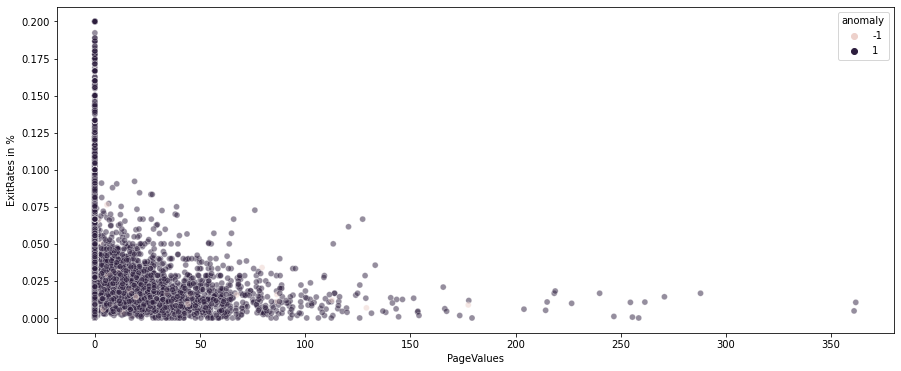

In [273]:
plt.figure(figsize=(15, 6))
sns.scatterplot(data=df, x='PageValues', y='ExitRates in %', hue='anomaly', alpha=0.5)
plt.show()

In [309]:
df.loc[df['Revenue'] == False, ['PageValues']].agg(['mean', 'median'])

,PageValues
mean,1.975998
median,0.000000


In [314]:
df.loc[df['Revenue'] == True, ['PageValues']].agg(['mean', 'median'])

,PageValues
mean,27.264518
median,16.758134


In [313]:
df.groupby('Revenue')['PageValues'].describe().T

Revenue,False,True
count,10422.000000,1908.000000
mean,1.975998,27.264518
std,9.072424,35.191954
min,0.000000,0.000000
25%,0.000000,3.641144
50%,0.000000,16.758134
75%,0.000000,38.897742
max,246.758590,361.763742


In [324]:
df['Revenue'] = pd.factorize(df['Revenue'])[0]

In [329]:
df.loc[df['Revenue'].quantile(0.75), :]

Administrative                              0
Administrative_Duration                   0.0
Informational                               0
Informational_Duration                    0.0
ProductRelated                              1
ProductRelated_Duration                   0.0
BounceRates in %                          0.2
ExitRates in %                            0.2
PageValues                                0.0
SpecialDay (probability)                  0.0
Month                                     Feb
OperatingSystems                            1
Browser                                     1
Region                                      1
TrafficType                                 1
VisitorType                 Returning_Visitor
Weekend                                 False
Revenue                                     0
scores                               2.857583
anomaly                                     1
scores_IF                            0.160835
anomaly_IF                        

In [331]:
df['Revenue'].quantile(0.75)

0.0

In [327]:
threshold = df['Revenue'].quantile(0.90)
rows = df.loc[df['Revenue'] == False].loc[df['Revenue'] > threshold, :]
rows

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),...,Weekend,Revenue,scores,anomaly,scores_IF,anomaly_IF,scores_LOF,anomaly_LOF,scores_SVM,anomaly_SVM


In [315]:
df.loc[(df['Revenue'] == False) & (df['PageValues'] > 240), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),...,Weekend,Revenue,scores,anomaly,scores_IF,anomaly_IF,scores_LOF,anomaly_LOF,scores_SVM,anomaly_SVM
5773,4,158.2,0,0.0,62,4402.25,0.0,0.001042,246.75859,0.0,...,False,False,2.10105,1,0.05875,1,2.10105,1,0.37571,1


In [332]:
df.loc[(df['Revenue'] == False) & (df['PageValues'] > 1), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),...,Weekend,Revenue,scores,anomaly,scores_IF,anomaly_IF,scores_LOF,anomaly_LOF,scores_SVM,anomaly_SVM
29,1,6.000000,1,0.00,45,1582.750000,0.043478,0.050821,54.179764,0.4,...,False,0,2.313708,1,0.122720,1,2.313708,1,1.122119,1
57,4,56.000000,2,120.00,36,998.741667,0.000000,0.014736,19.447079,0.2,...,False,0,2.879623,1,0.200552,1,2.879623,1,2.164603,1
62,12,279.416667,0,0.00,42,1553.583333,0.009000,0.019667,38.308493,0.0,...,False,0,2.960655,1,0.145055,1,2.960655,1,2.110816,1
185,0,0.000000,0,0.00,20,927.450000,0.011111,0.027249,8.000741,0.0,...,False,0,2.464788,1,0.269772,1,2.464788,1,1.573859,1
189,3,47.000000,1,51.00,68,3008.124108,0.007143,0.016728,46.530175,0.0,...,False,0,2.624610,1,0.162143,1,2.624610,1,0.395851,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12285,6,369.333333,2,225.50,133,3918.363736,0.000000,0.009275,7.147604,0.0,...,False,0,2.571867,1,0.108751,1,2.571867,1,1.785662,1
12287,8,167.910714,6,547.75,111,6340.152381,0.003361,0.009432,44.219794,0.0,...,False,0,2.792042,1,-0.007819,-1,2.792042,1,1.194121,1
12307,2,305.125000,3,368.25,27,1121.250000,0.020000,0.042857,39.519807,0.0,...,False,0,2.750798,1,0.069535,1,2.750798,1,3.421070,1
12319,0,0.000000,0,0.00,21,1128.583333,0.000000,0.013043,3.685401,0.0,...,False,0,2.867236,1,0.280827,1,2.867236,1,1.512150,1


In [303]:
df.loc[df['PageValues'] >= 1, ['Revenue']].value_counts()

Revenue
True       1521
False      1144
dtype: int64

In [306]:
df.loc[df['PageValues'] == 0, ['Revenue']].value_counts()

Revenue
False      9230
True        370
dtype: int64

In [307]:
df.loc[df['PageValues'] >= 100, ['Revenue']].value_counts()

Revenue
True       71
False      11
dtype: int64

In [308]:
df.loc[df['PageValues'] >= 100, :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),...,Weekend,Revenue,scores,anomaly,scores_IF,anomaly_IF,scores_LOF,anomaly_LOF,scores_SVM,anomaly_SVM
198,0,0.000000,0,0.000000,17,840.233333,0.000000,0.001667,109.176000,0.0,...,False,True,2.553896,1,0.151478,1,2.553896,1,1.522633,1
200,1,32.000000,0,0.000000,50,2867.000000,0.000000,0.004000,153.443248,0.0,...,True,True,1.810201,1,0.106711,1,1.810201,1,0.103480,1
1050,1,21.000000,1,61.000000,49,1647.152381,0.000000,0.000800,144.393489,0.0,...,True,True,2.112166,1,0.086720,1,2.112166,1,1.267964,1
1491,5,172.200000,0,0.000000,23,792.722222,0.000000,0.010714,261.491286,0.0,...,False,True,2.426722,1,0.110796,1,2.426722,1,1.917782,1
2024,0,0.000000,0,0.000000,68,809.245635,0.002985,0.005970,109.912405,0.0,...,False,True,2.275696,1,0.134881,1,2.275696,1,1.504199,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11816,0,0.000000,0,0.000000,7,432.000000,0.000000,0.014286,270.784693,0.0,...,False,True,2.702465,1,0.120297,1,2.702465,1,0.893693,1
11858,1,42.500000,1,12.833333,104,4054.755952,0.003883,0.010097,141.459054,0.0,...,False,True,2.174921,1,0.065970,1,2.174921,1,0.197944,1
12108,0,0.000000,0,0.000000,28,1107.922619,0.014815,0.009877,226.677702,0.0,...,False,True,2.116337,1,0.106639,1,2.116337,1,1.325994,1
12117,1,46.500000,0,0.000000,14,398.979167,0.000000,0.014286,116.337865,0.0,...,False,True,2.398748,1,0.153898,1,2.398748,1,1.244050,1


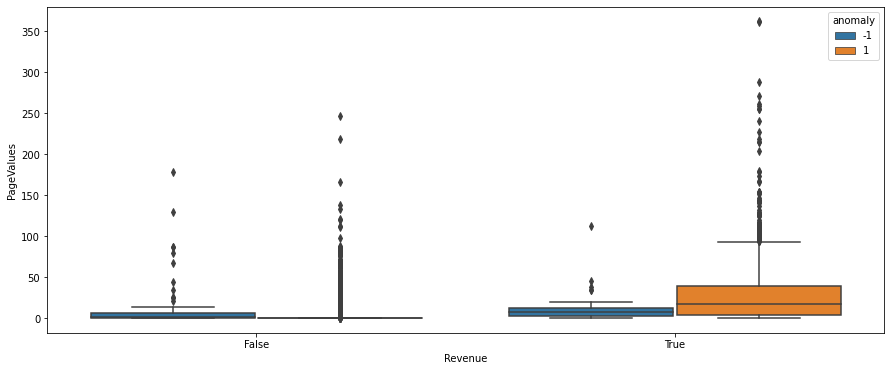

In [262]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, y='PageValues', x='Revenue', hue='anomaly')
plt.show()

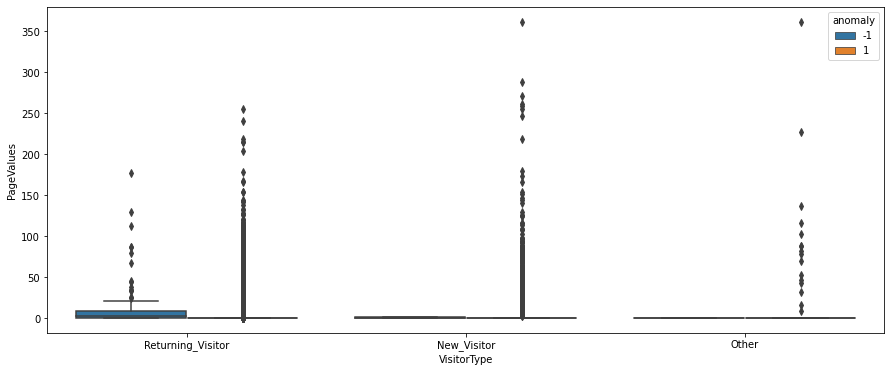

In [261]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, y='PageValues', x='VisitorType', hue='anomaly')
plt.show()

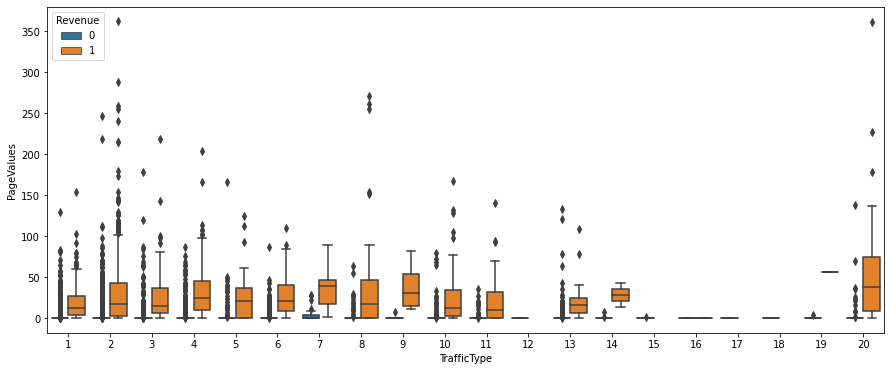

In [335]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, y='PageValues', x='TrafficType', hue='Revenue')
plt.show()

In [347]:
df.corr()['TrafficType']

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16080\2230818460.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()['TrafficType']


Administrative             -0.033561
Administrative_Duration    -0.014376
Informational              -0.034491
Informational_Duration     -0.024675
ProductRelated             -0.043064
ProductRelated_Duration    -0.036377
BounceRates in %            0.078286
ExitRates in %              0.078616
PageValues                  0.012532
SpecialDay (probability)    0.052301
OperatingSystems            0.189154
Browser                     0.111938
Region                      0.047520
TrafficType                 1.000000
Weekend                    -0.002221
Revenue                    -0.005113
scores                     -0.005868
anomaly                    -0.014557
scores_IF                  -0.015551
anomaly_IF                  0.001944
scores_LOF                 -0.005868
anomaly_LOF                -0.014557
scores_SVM                 -0.036189
anomaly_SVM                -0.007245
Name: TrafficType, dtype: float64

In [346]:
df[['PageValues', 'TrafficType', 'Revenue', 'ProductRelated_Duration', 'Informational_Duration', 'Administrative_Duration']].corr()

,PageValues,TrafficType,Revenue,ProductRelated_Duration,Informational_Duration,Administrative_Duration
PageValues,1.000000,0.012532,0.492569,0.052823,0.030861,0.067608
TrafficType,0.012532,1.000000,-0.005113,-0.036377,-0.024675,-0.014376
Revenue,0.492569,-0.005113,1.000000,0.152373,0.070345,0.093587
ProductRelated_Duration,0.052823,-0.036377,0.152373,1.000000,0.347364,0.355422
Informational_Duration,0.030861,-0.024675,0.070345,0.347364,1.000000,0.238031
Administrative_Duration,0.067608,-0.014376,0.093587,0.355422,0.238031,1.000000


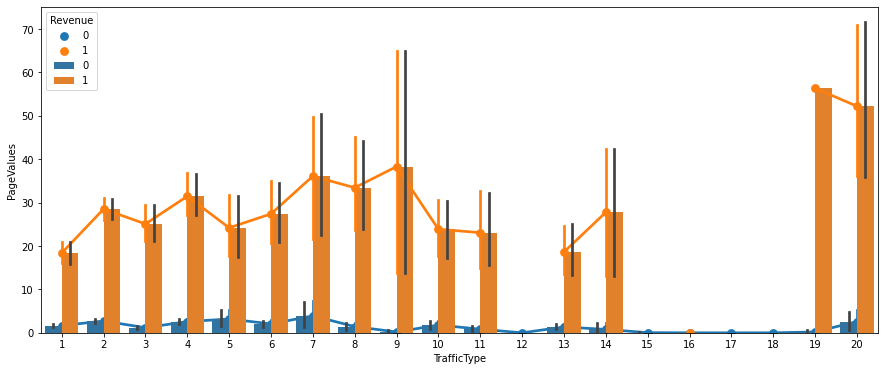

In [348]:
plt.figure(figsize=(15, 6))
sns.pointplot(data=df, y='PageValues', x='TrafficType', hue='Revenue')
sns.barplot(data=df, y='PageValues', x='TrafficType', hue='Revenue')
plt.show()

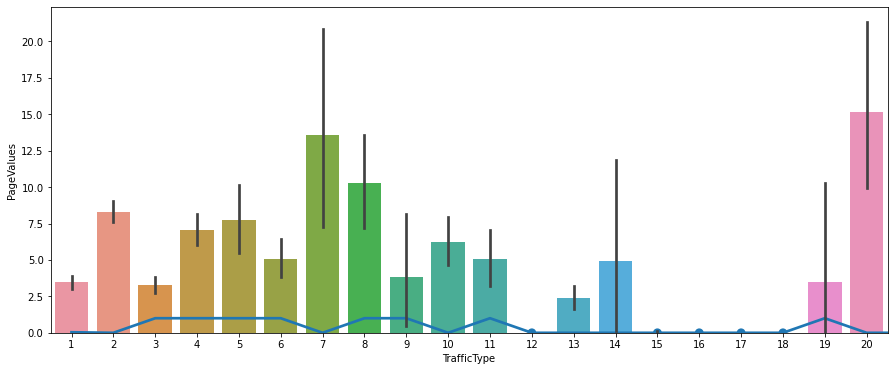

In [339]:
plt.figure(figsize=(15, 6))
sns.pointplot(data=df, x='PageValues', y='Revenue')
sns.barplot(data=df, y='PageValues', x='TrafficType')
plt.show()

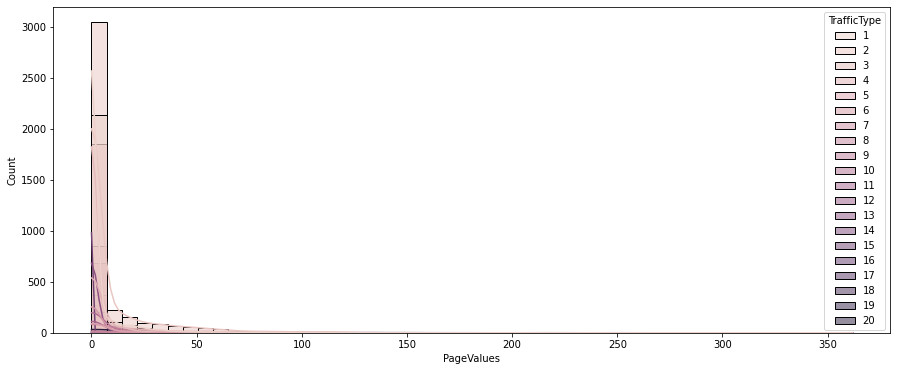

In [336]:
plt.figure(figsize=(15, 6))
sns.histplot(data=df, x='PageValues', hue='TrafficType', bins=50, kde=True)
plt.show()

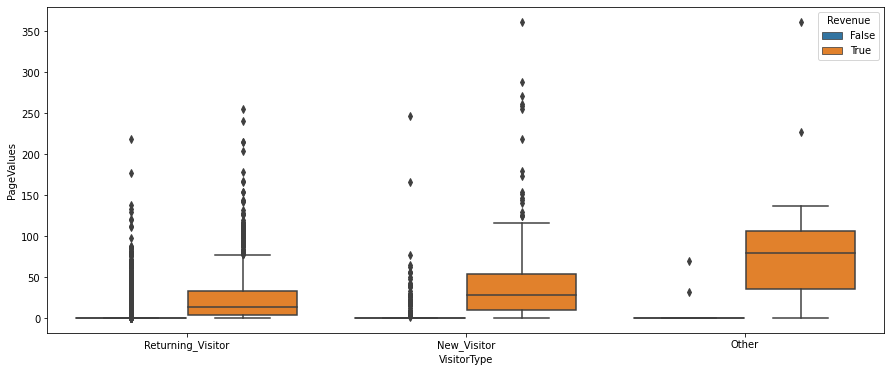

In [254]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, y='PageValues', x='VisitorType', hue='Revenue')
plt.show()

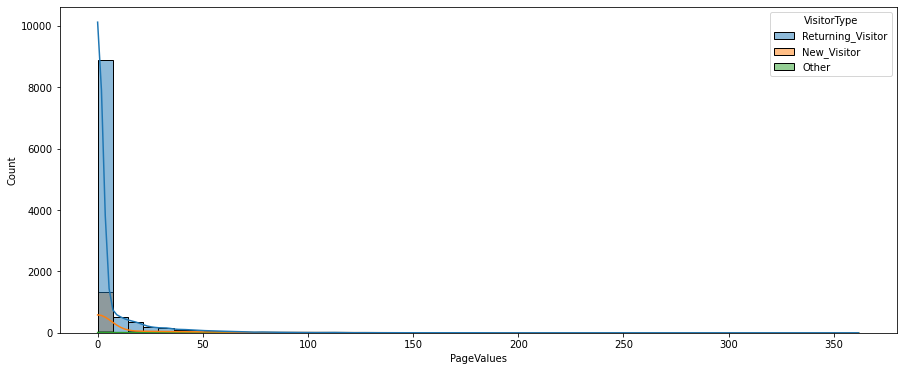

In [255]:
plt.figure(figsize=(15, 6))
sns.histplot(data=df, x='PageValues', hue='VisitorType', bins=50, kde=True)
plt.show()

<AxesSubplot:xlabel='VisitorType', ylabel='Revenue'>

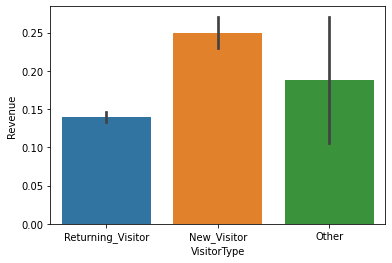

In [256]:
sns.barplot(data=df, x='VisitorType', y='Revenue')

<AxesSubplot:xlabel='Revenue', ylabel='PageValues'>

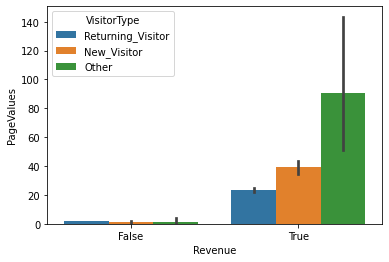

In [257]:
sns.barplot(data=df, x='Revenue', y='PageValues', hue='VisitorType')

In [350]:
df.loc[(df['PageValues'] > 0) & (df['Revenue'] == 0), :]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,scores,anomaly,scores_IF,anomaly_IF,scores_LOF,anomaly_LOF,scores_SVM,anomaly_SVM
29,1,6.000000,1,0.00,45,1582.750000,0.043478,0.050821,54.179764,0.4,Feb,3,2,1,1,Returning_Visitor,False,0,2.313708,1,0.122720,1,2.313708,1,1.122119,1
57,4,56.000000,2,120.00,36,998.741667,0.000000,0.014736,19.447079,0.2,Feb,2,2,4,1,Returning_Visitor,False,0,2.879623,1,0.200552,1,2.879623,1,2.164603,1
62,12,279.416667,0,0.00,42,1553.583333,0.009000,0.019667,38.308493,0.0,Feb,1,1,3,2,Returning_Visitor,False,0,2.960655,1,0.145055,1,2.960655,1,2.110816,1
185,0,0.000000,0,0.00,20,927.450000,0.011111,0.027249,8.000741,0.0,Mar,1,1,3,1,Returning_Visitor,False,0,2.464788,1,0.269772,1,2.464788,1,1.573859,1
189,3,47.000000,1,51.00,68,3008.124108,0.007143,0.016728,46.530175,0.0,Mar,2,2,1,1,Returning_Visitor,False,0,2.624610,1,0.162143,1,2.624610,1,0.395851,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12285,6,369.333333,2,225.50,133,3918.363736,0.000000,0.009275,7.147604,0.0,Nov,2,2,2,2,Returning_Visitor,False,0,2.571867,1,0.108751,1,2.571867,1,1.785662,1
12287,8,167.910714,6,547.75,111,6340.152381,0.003361,0.009432,44.219794,0.0,Dec,3,2,6,2,Returning_Visitor,False,0,2.792042,1,-0.007819,-1,2.792042,1,1.194121,1
12307,2,305.125000,3,368.25,27,1121.250000,0.020000,0.042857,39.519807,0.0,Dec,3,2,1,2,Returning_Visitor,False,0,2.750798,1,0.069535,1,2.750798,1,3.421070,1
12319,0,0.000000,0,0.00,21,1128.583333,0.000000,0.013043,3.685401,0.0,Dec,2,2,1,2,Returning_Visitor,False,0,2.867236,1,0.280827,1,2.867236,1,1.512150,1


In [356]:
df.groupby('Administrative').agg({'Administrative_Duration': [np.sum, np.mean],
                                  'PageValues': [np.mean, np.median],
                                  'TrafficType': 'size',
                                  'VisitorType': 'size'})

Administrative_Duration              PageValues             \
                                   sum         mean       mean     median   
Administrative                                                              
0                             0.000000     0.000000   3.352355   0.000000   
1                         57542.423901    42.498097   8.425506   0.000000   
2                         96051.216248    86.221918   8.013220   0.000000   
3                        106785.191627   116.705127   6.822536   0.000000   
4                        113158.591194   147.919727   6.964674   0.000000   
5                        103599.852132   180.173656   8.174606   0.000000   
6                         87845.399784   203.345833   8.446823   0.000000   
7                         68569.859137   202.869406   8.559837   0.000000   
8                         74481.576749   259.517689  10.249913   0.384720   
9                         60843.861990   270.417164   8.837289   1.725866   
10                        54740.475928   357.780888   8.565022   1.088158   
11                        40777.000547   388.352386   8.526647   4.289679   
12                        31226.608364   363.100097   7.513370   1.134381   
13                        21229.027809   379.089782  13.705558   4.154417   
14                        21465.505559   487.852399   8.300987   4.160649   
15                        19136.390890   503.589234   7.609648   2.715397   
16                         8967.914263   373.663094  15.550440   3.695102   
17                         9491.282467   593.205154  13.015585   2.330281   
18                         5354.091044   446.174254   4.660262   0.653841   
19                         3320.622014   553.437002   6.054336   4.050692   
20                         1507.131273   753.565636   4.276907   4.276907   
21                         1237.072647   618.536324   0.274406   0.274406   
22                         4017.768757  1004.442189  49.002687   8.221762   
23                          897.817154   299.272384   4.529859   6.277684   
24                         1831.332957   457.833239   2.408236   1.741801   
26                         1561.717567  1561.717567  19.567464  19.567464   
27                          853.735949   853.735949   4.511100   4.511100   

               TrafficType VisitorType  
                      size        size  
Administrative                          
0                     5768        5768  
1                     1354        1354  
2                     1114        1114  
3                      915         915  
4                      765         765  
5                      575         575  
6                      432         432  
7                      338         338  
8                      287         287  
9                      225         225  
10                     153         153  
11                     105         105  
12                      86          86  
13                      56          56  
14                      44          44  
15                      38          38  
16                      24          24  
17                      16          16  
18                      12          12  
19                       6           6  
20                       2           2  
21                       2           2  
22                       4           4  
23                       3           3  
24                       4           4  
26                       1           1  
27                       1           1

In [207]:
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import cross_val_score

In [214]:
y = df_copy['Revenue']

In [215]:
scaled_df, y

(       Administrative  Administrative_Duration  Informational  \
 0           -0.696993                -0.457191      -0.396478   
 1           -0.696993                -0.457191      -0.396478   
 2           -0.696993                -0.457191      -0.396478   
 3           -0.696993                -0.457191      -0.396478   
 4           -0.696993                -0.457191      -0.396478   
 ...               ...                      ...            ...   
 12325        0.206173                 0.363075      -0.396478   
 12326       -0.696993                -0.457191      -0.396478   
 12327       -0.696993                -0.457191      -0.396478   
 12328        0.507228                -0.032916      -0.396478   
 12329       -0.696993                -0.457191      -0.396478   
 
        Informational_Duration  ProductRelated  ProductRelated_Duration  \
 0                   -0.244931       -0.691003                -0.624348   
 1                   -0.244931       -0.668518          

In [216]:
X_train, X_test, y_train, y_test = train_test_split(scaled_df, y, stratify=y.values, test_size=0.2, random_state=42)

In [218]:
contamination_values = np.arange(0.01, 0.5, 0.01)
cv_scores = {}

for contamination in contamination_values:
    model = IsolationForest(contamination=contamination, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
    cv_scores[contamination] = scores.mean()

best_contamination = max(cv_scores, key=cv_scores.get)
best_model = IsolationForest(contamination=best_contamination, random_state=42)
best_model.fit(X_train, y_train)
predictions = best_model.predict(X_test)

print("Cross-validation scores:")
for contamination, score in cv_scores.items():
    print(f"Contamination: {contamination}, Mean Score: {score}")

print("\nBest Contamination:", best_contamination)
print("Predictions on X_test:", predictions)

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\lenovo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but Iso

Cross-validation scores:
Contamination: 0.01, Mean Score: 0.15176382173541597
Contamination: 0.02, Mean Score: 0.14882387895822818
Contamination: 0.03, Mean Score: 0.14699909220727284
Contamination: 0.04, Mean Score: 0.14497167131529193
Contamination: 0.05, Mean Score: 0.1431467817565532
Contamination: 0.060000000000000005, Mean Score: 0.14172726328764898
Contamination: 0.06999999999999999, Mean Score: 0.13980121087007255
Contamination: 0.08, Mean Score: 0.13817910966403446
Contamination: 0.09, Mean Score: 0.13665847974018416
Contamination: 0.09999999999999999, Mean Score: 0.13534053536125112
Contamination: 0.11, Mean Score: 0.13351574861029578
Contamination: 0.12, Mean Score: 0.13118406808342647
Contamination: 0.13, Mean Score: 0.13027170040989464
Contamination: 0.14, Mean Score: 0.1282441767101304
Contamination: 0.15000000000000002, Mean Score: 0.12641938995917504
Contamination: 0.16, Mean Score: 0.12489870863143307
Contamination: 0.17, Mean Score: 0.12276976505337267
Contamination: 

In [4]:
pd.set_option('display.max_columns', 26)
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [85]:
df['Month'].value_counts()

May     3364
Nov     2998
Mar     1907
Dec     1727
Oct      549
Sep      448
Aug      433
Jul      432
June     288
Feb      184
Name: Month, dtype: int64

<AxesSubplot:xlabel='SpecialDay (probability)', ylabel='Revenue'>

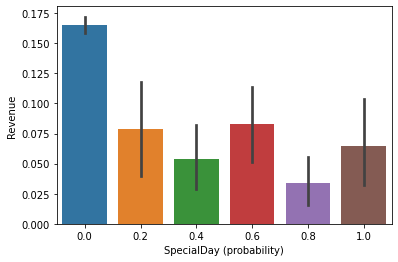

In [6]:
sns.barplot(data=df, x='SpecialDay (probability)', y='Revenue')

<AxesSubplot:xlabel='Month', ylabel='Revenue'>

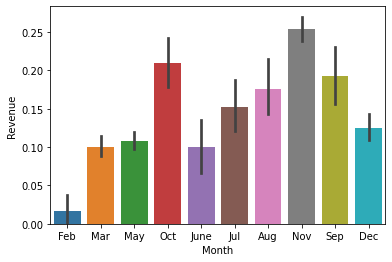

In [19]:
sns.barplot(data=df, x='Month', y='Revenue')

In [82]:
df[df['Revenue'] == False].groupby('Month')['PageValues'].mean()

Month
Aug     1.995851
Dec     2.475384
Feb     0.618427
Jul     1.938753
June    1.853306
Mar     1.028214
May     1.795734
Nov     2.351262
Oct     3.096897
Sep     2.995934
Name: PageValues, dtype: float64

In [83]:
df[df['Revenue'] == True].groupby('Month')['PageValues'].mean()

Month
Aug     24.456123
Dec     37.318080
Feb     17.297136
Jul     16.113984
June    17.128564
Mar     30.144408
May     35.305225
Nov     21.199676
Oct     29.585830
Sep     26.754999
Name: PageValues, dtype: float64

In [79]:
df.groupby('Month')['Revenue'].value_counts(normalize=True)

Month  Revenue
Aug    False      0.824480
       True       0.175520
Dec    False      0.874928
       True       0.125072
Feb    False      0.983696
       True       0.016304
Jul    False      0.847222
       True       0.152778
June   False      0.899306
       True       0.100694
Mar    False      0.899318
       True       0.100682
May    False      0.891498
       True       0.108502
Nov    False      0.746498
       True       0.253502
Oct    False      0.790528
       True       0.209472
Sep    False      0.808036
       True       0.191964
Name: Revenue, dtype: float64

<AxesSubplot:xlabel='Month', ylabel='Count'>

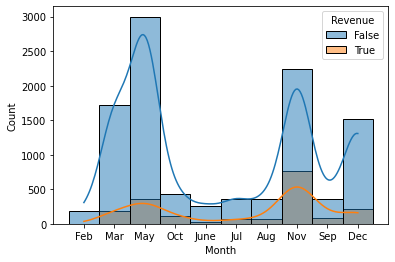

In [10]:
sns.histplot(data=df, x='Month', hue='Revenue', bins=100, kde=True)

In [84]:
df['Month'].sort_values(ascending=False)

6681    Sep
6474    Sep
6469    Sep
7399    Sep
6464    Sep
       ... 
6982    Aug
5566    Aug
5568    Aug
5570    Aug
6907    Aug
Name: Month, Length: 12330, dtype: object

In [12]:
df.groupby('Month')['PageValues'].mean().pct_change()

Month
Aug          NaN
Dec     0.150752
Feb    -0.869701
Jul     3.609822
June   -0.173709
Mar     0.167552
May     0.371720
Nov     0.312581
Oct     0.212670
Sep    -0.125932
Name: PageValues, dtype: float64

<AxesSubplot:xlabel='Month'>

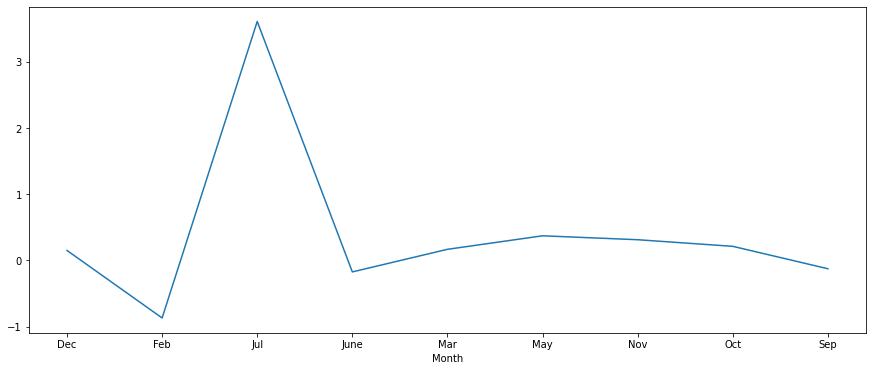

In [13]:
df.groupby('Month')['PageValues'].mean().pct_change().plot(figsize=(15, 6))

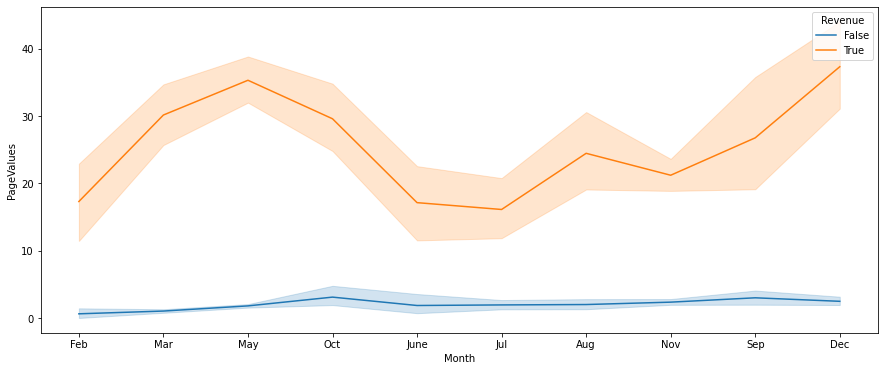

In [29]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='Month', y='PageValues', hue='Revenue')
plt.savefig('page_value_month_hue_revenue.png')
plt.show()

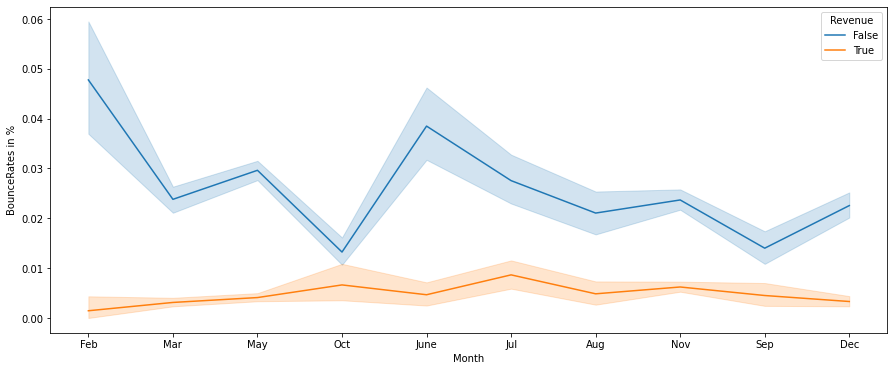

In [27]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='Month', y='BounceRates in %', hue='Revenue')
plt.savefig('bounce_rate_month_hue_revenue.png')
plt.show()

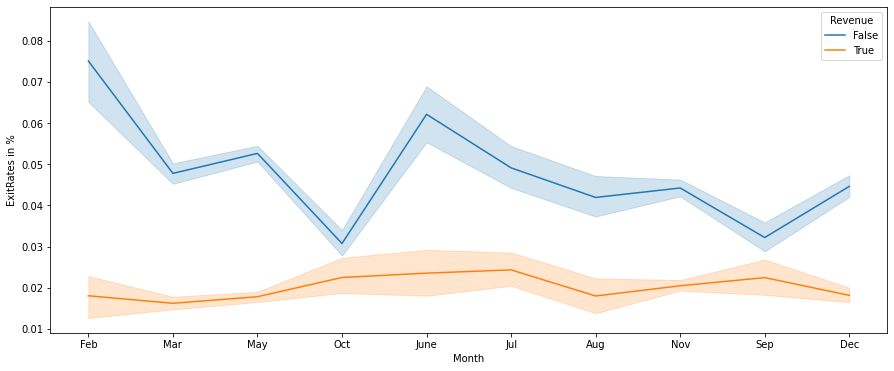

In [28]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='Month', y='ExitRates in %', hue='Revenue')
plt.savefig('exit_rate_month_hue_revenue.png')
plt.show()

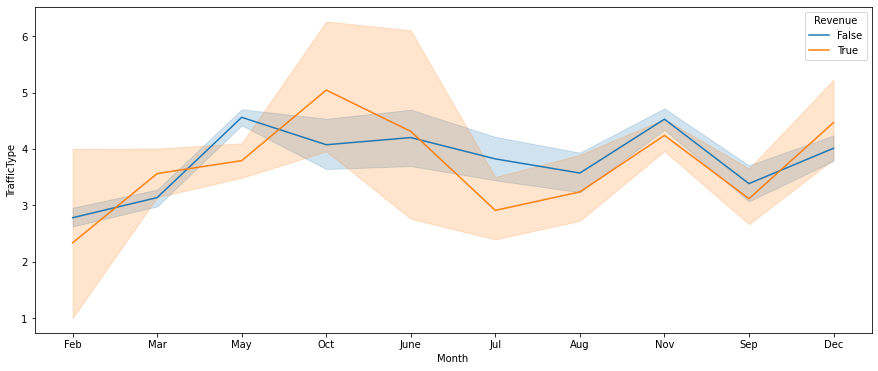

In [23]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='Month', y='TrafficType', hue='Revenue')
plt.show()

In [24]:
df['TrafficType'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 18, 19,
       16, 17, 20], dtype=int64)

In [25]:
df['TrafficType'].value_counts()

2     3913
1     2451
3     2052
4     1069
13     738
10     450
6      444
8      343
5      260
11     247
20     198
9       42
7       40
15      38
19      17
14      13
18      10
16       3
12       1
17       1
Name: TrafficType, dtype: int64

In [29]:
df.groupby('TrafficType').agg({'PageValues': ['mean', 'size'], 'ProductRelated_Duration': ['mean', 'size']})

PageValues       ProductRelated_Duration      
                  mean  size                    mean  size
TrafficType                                               
1             3.455074  2451             1234.034177  2451
2             8.304366  3913             1457.941637  3913
3             3.276033  2052              892.757712  2052
4             7.043113  1069              988.944497  1069
5             7.712489   260              742.331026   260
6             5.076244   444             1140.418002   444
7            13.567345    40             1035.012620    40
8            10.302436   343             1084.488987   343
9             3.818558    42              541.791785    42
10            6.208230   450             1258.305854   450
11            5.068642   247              899.127394   247
12            0.000000     1               15.000000     1
13            2.354585   738             1266.757306   738
14            4.936097    13             4211.236295    13
15            0.036468    38              535.145553    38
16            0.000000     3              603.266667     3
17            0.000000     1               60.000000     1
18            0.000000    10              503.226120    10
19            3.497520    17             1511.367386    17
20           15.128326   198              738.328088   198

In [33]:
page_value_duration = df.groupby('TrafficType')[['PageValues', 'ProductRelated_Duration']].mean()
page_value_duration = page_value_duration.reset_index()
page_value_duration

,TrafficType,PageValues,ProductRelated_Duration
0,1,3.455074,1234.034177
1,2,8.304366,1457.941637
2,3,3.276033,892.757712
3,4,7.043113,988.944497
4,5,7.712489,742.331026
5,6,5.076244,1140.418002
6,7,13.567345,1035.012620
7,8,10.302436,1084.488987
8,9,3.818558,541.791785
9,10,6.208230,1258.305854


<AxesSubplot:xlabel='TrafficType', ylabel='PageValues'>

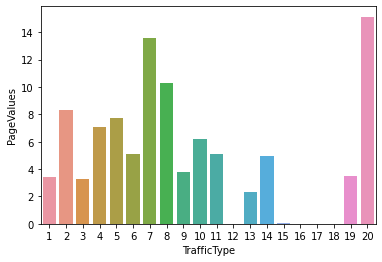

In [34]:
sns.barplot(data=page_value_duration, x='TrafficType', y='PageValues')

<AxesSubplot:xlabel='ProductRelated_Duration', ylabel='PageValues'>

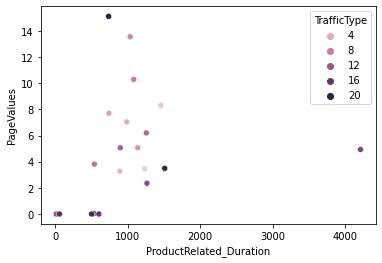

In [35]:
sns.scatterplot(data=page_value_duration, x='ProductRelated_Duration', y='PageValues', hue='TrafficType')

<AxesSubplot:xlabel='ProductRelated_Duration', ylabel='PageValues'>

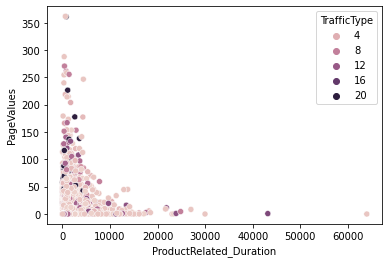

In [36]:
sns.scatterplot(data=df, x='ProductRelated_Duration', y='PageValues', hue='TrafficType')

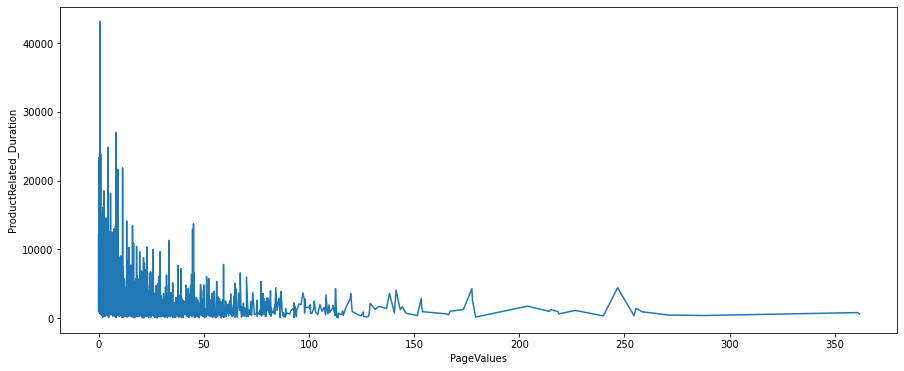

In [39]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, y='ProductRelated_Duration', x='PageValues')
plt.show()

In [48]:
max(df['ProductRelated_Duration'])

63973.52223

In [63]:
np.histogram_bin_edges(df['ProductRelated_Duration'], bins='sturges')

array([    0.      ,  4264.901482,  8529.802964, 12794.704446,
       17059.605928, 21324.50741 , 25589.408892, 29854.310374,
       34119.211856, 38384.113338, 42649.01482 , 46913.916302,
       51178.817784, 55443.719266, 59708.620748, 63973.52223 ])

In [88]:
ranges = np.histogram_bin_edges(df['ProductRelated_Duration'], bins='sturges')
labels = ['Range 1', 'Range 2', 'Range 3', 'Range 4', 'Range 5', 'Range 6', 'Range 7', 'Range 8', 'Range 9', 
          'Range 10', 'Range 11', 'Range 12', 'Range 13', 'Range 14', 'Range 15']
df['ProductDurationCategory'] = pd.cut(df['ProductRelated_Duration'], bins=ranges, labels=labels)

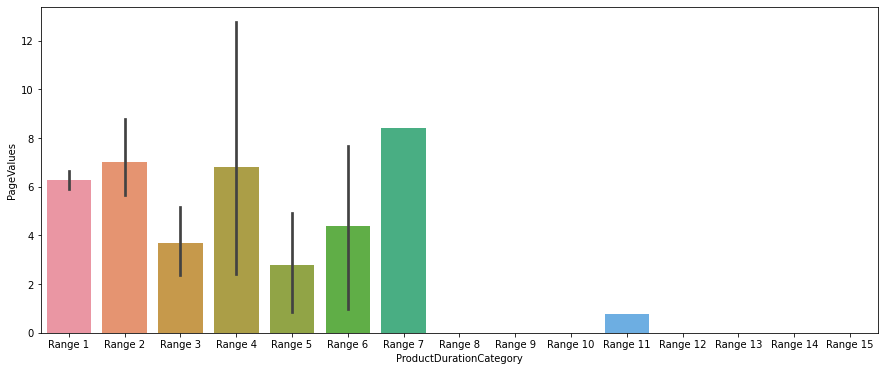

In [89]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='ProductDurationCategory', y='PageValues')
plt.show()

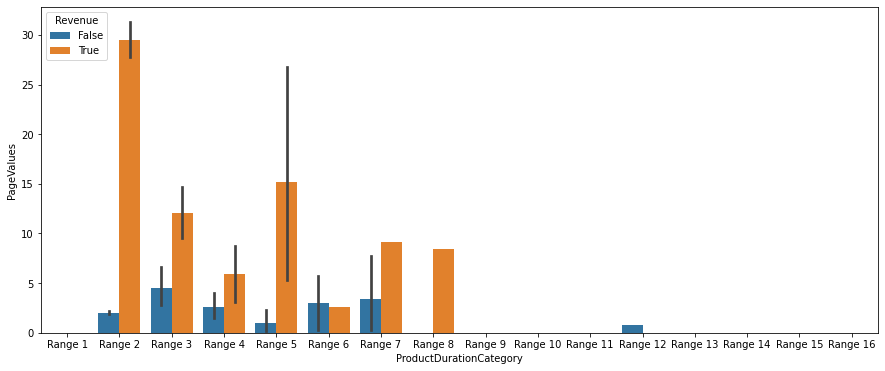

In [67]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='ProductDurationCategory', y='PageValues', hue='Revenue')
plt.show()

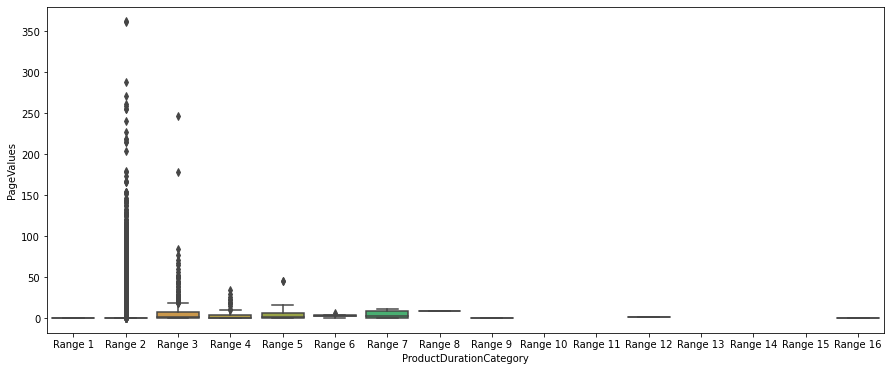

In [68]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, x='ProductDurationCategory', y='PageValues')
plt.show()

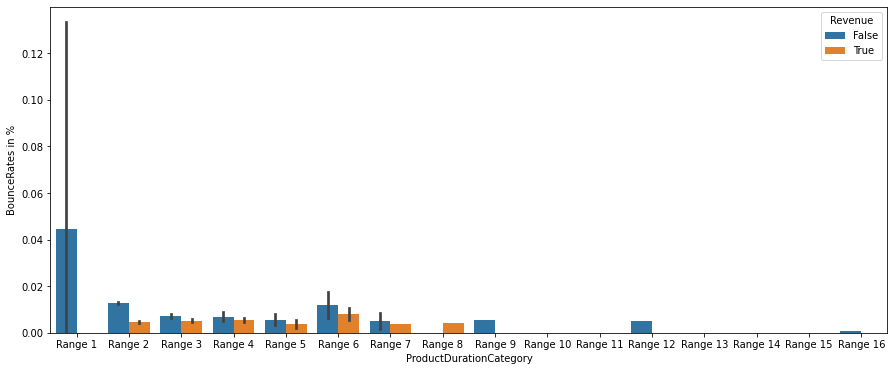

In [69]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='ProductDurationCategory', y='BounceRates in %', hue='Revenue')
plt.show()

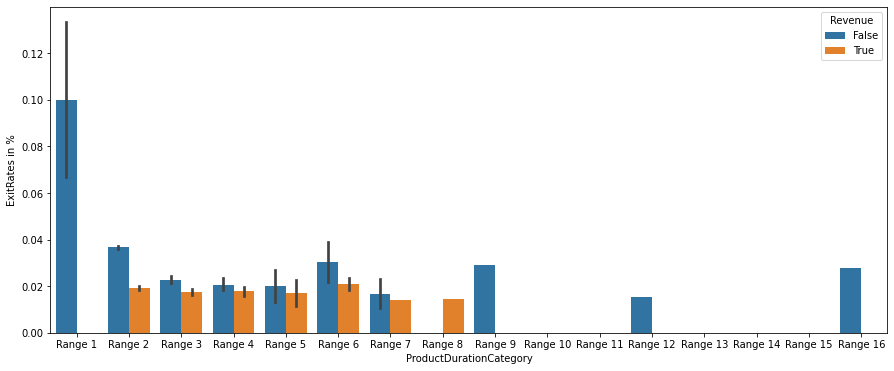

In [70]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='ProductDurationCategory', y='ExitRates in %', hue='Revenue')
plt.show()

In [62]:
df['ExitRates in %'].describe()

count    12330.000000
mean         0.043073
std          0.048597
min          0.000000
25%          0.014286
50%          0.025156
75%          0.050000
max          0.200000
Name: ExitRates in %, dtype: float64

In [71]:
df[df['Revenue'] == True].groupby('ProductDurationCategory').agg({'ExitRates in %': 'mean', 'PageValues': 'mean'})

,ExitRates in %,PageValues
ProductDurationCategory,,
Range 1,NaN,NaN
Range 2,0.019261,29.489727
Range 3,0.017471,12.054433
Range 4,0.017748,5.883291
Range 5,0.017033,15.191717
Range 6,0.020873,2.587433
Range 7,0.014292,9.131387
Range 8,0.014594,8.403164
Range 9,NaN,NaN


In [72]:
df[df['Revenue'] == False].groupby('ProductDurationCategory').agg({'ExitRates in %': 'mean', 'PageValues': 'mean'})

,ExitRates in %,PageValues
ProductDurationCategory,,
Range 1,0.100000,0.000000
Range 2,0.036641,2.042455
Range 3,0.022858,4.480626
Range 4,0.020716,2.625518
Range 5,0.020005,1.027367
Range 6,0.030290,2.975190
Range 7,0.016585,3.426948
Range 8,NaN,NaN
Range 9,0.028971,0.000000


<AxesSubplot:xlabel='Revenue', ylabel='PageValues'>

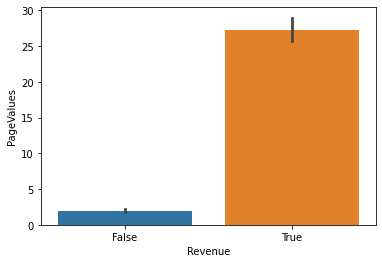

In [75]:
sns.barplot(data=df, x='Revenue', y='PageValues')

<AxesSubplot:xlabel='PageValues', ylabel='Density'>

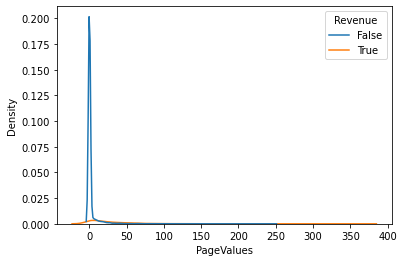

In [76]:
sns.kdeplot(data=df, x='PageValues', hue='Revenue')

<AxesSubplot:xlabel='Revenue', ylabel='PageValues'>

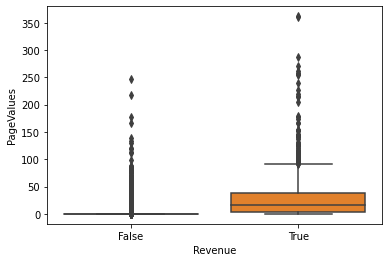

In [77]:
sns.boxplot(data=df, x='Revenue', y='PageValues')

In [90]:
df.isnull().sum()

Administrative                0
Administrative_Duration       0
Informational                 0
Informational_Duration        0
ProductRelated                0
ProductRelated_Duration       0
BounceRates in %              0
ExitRates in %                0
PageValues                    0
SpecialDay (probability)      0
Month                         0
OperatingSystems              0
Browser                       0
Region                        0
TrafficType                   0
VisitorType                   0
Weekend                       0
Revenue                       0
ProductDurationCategory     755
dtype: int64

In [91]:
df['total_page_view'] = df['Administrative'] + df['Informational'] + df['ProductRelated']
df['total_page_duration'] = df['Administrative_Duration'] + df['Informational_Duration'] + df['ProductRelated_Duration']

df['product_view_percent'] = (df['ProductRelated'] / df['total_page_view']) * 100
df['product_dur_percent'] = (df['ProductRelated'] / df['total_page_duration']) * 100
df['ave_product_duration'] = df['ProductRelated_Duration'] / df['ProductRelated']

df['admin_view_percent'] = (df['Administrative'] / df['total_page_view']) * 100
df['admin_dur_percent'] = (df['Administrative'] / df['total_page_duration']) * 100
df['ave_admin_duration'] = df['Administrative_Duration'] / df['Administrative']

df['info_view_percent'] = (df['Informational'] / df['total_page_view']) * 100
df['info_dur_percent'] = (df['Informational'] / df['total_page_duration']) * 100
df['ave_info_duration'] = df['Informational_Duration'] / df['Informational']

df['page_values_x_bounce_rate'] = df['PageValues'] * (1 - df['BounceRates in %'])
df['page_values_x_exit_rate'] = df['PageValues'] * (1 - df['ExitRates in %'])

df['page_values_per_product_view'] = df['PageValues'] / df['ProductRelated']
df['page_values_per_product_dur'] = df['PageValues'] / df['ProductRelated_Duration']

df['page_values_per_admin_view'] = df['PageValues'] / df['Administrative']
df['page_values_per_admin_dur'] = df['PageValues'] / df['Administrative_Duration']

df['page_values_per_info_view'] = df['PageValues'] / df['Informational']
df['page_values_per_info_dur'] = df['PageValues'] / df['Informational_Duration']

In [92]:
df.groupby('TrafficType')['Revenue'].value_counts(normalize=True)

TrafficType  Revenue
1            False      0.893105
             True       0.106895
2            False      0.783542
             True       0.216458
3            False      0.912281
             True       0.087719
4            False      0.845650
             True       0.154350
5            False      0.784615
             True       0.215385
6            False      0.880631
             True       0.119369
7            False      0.700000
             True       0.300000
8            False      0.723032
             True       0.276968
9            False      0.904762
             True       0.095238
10           False      0.800000
             True       0.200000
11           False      0.809717
             True       0.190283
12           False      1.000000
13           False      0.941734
             True       0.058266
14           False      0.846154
             True       0.153846
15           False      1.000000
16           False      0.666667
             True     

<AxesSubplot:xlabel='TrafficType', ylabel='Density'>

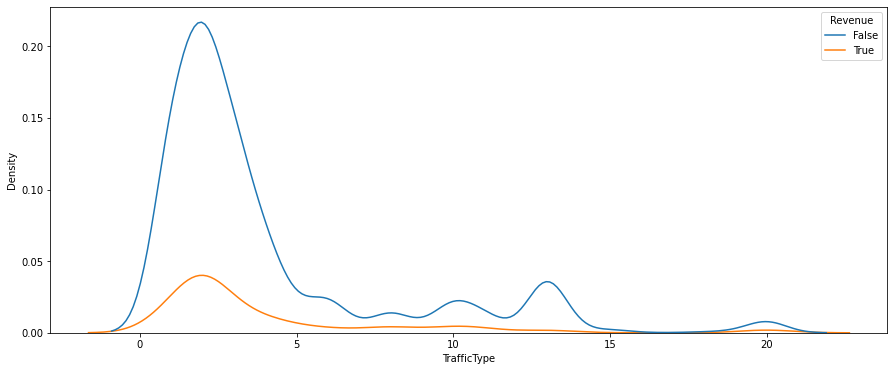

In [96]:
plt.figure(figsize=(15, 6))
sns.kdeplot(data=df, x='TrafficType', hue='Revenue')

<AxesSubplot:xlabel='TrafficType', ylabel='PageValues'>

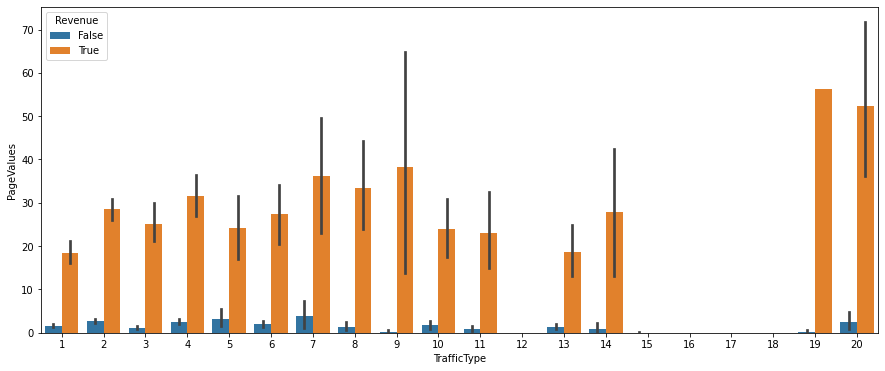

In [95]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='TrafficType', y='PageValues', hue='Revenue')

In [97]:
df.groupby('TrafficType').agg({'PageValues': ['mean', 'median'], 'Revenue': 'size'})

PageValues           Revenue
                  mean    median    size
TrafficType                             
1             3.455074  0.000000    2451
2             8.304366  0.000000    3913
3             3.276033  0.000000    2052
4             7.043113  0.000000    1069
5             7.712489  0.000000     260
6             5.076244  0.000000     444
7            13.567345  0.423669      40
8            10.302436  0.000000     343
9             3.818558  0.000000      42
10            6.208230  0.000000     450
11            5.068642  0.000000     247
12            0.000000  0.000000       1
13            2.354585  0.000000     738
14            4.936097  0.000000      13
15            0.036468  0.000000      38
16            0.000000  0.000000       3
17            0.000000  0.000000       1
18            0.000000  0.000000      10
19            3.497520  0.000000      17
20           15.128326  0.000000     198

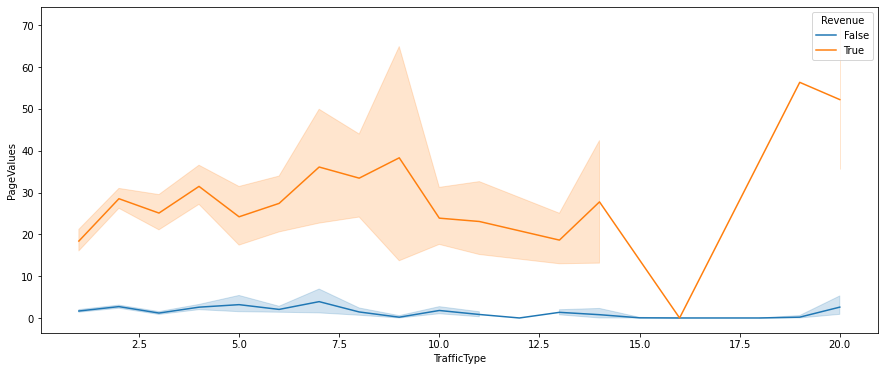

In [102]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='TrafficType', y='PageValues', hue='Revenue')
plt.show()

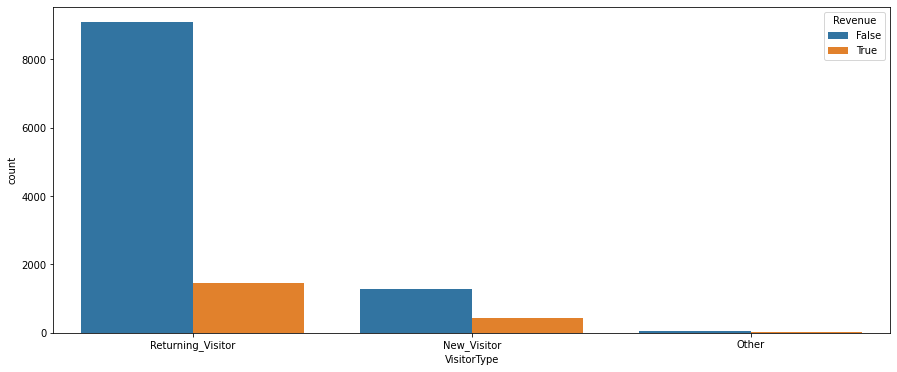

In [104]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='VisitorType', hue='Revenue')
plt.show()

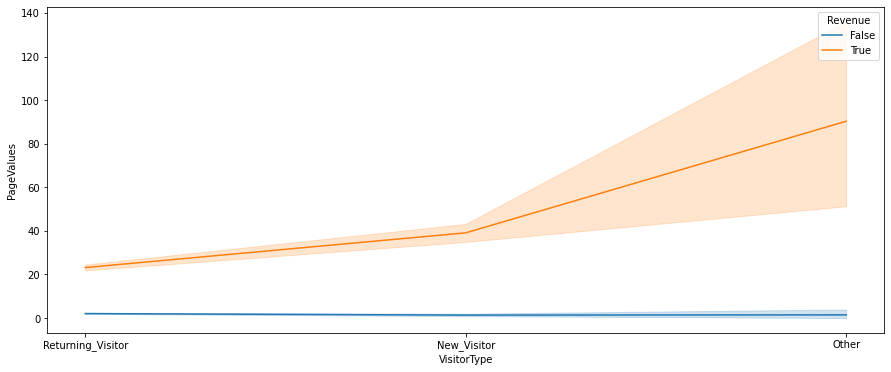

In [103]:
plt.figure(figsize=(15, 6))
sns.lineplot(data=df, x='VisitorType', y='PageValues', hue='Revenue')
plt.show()

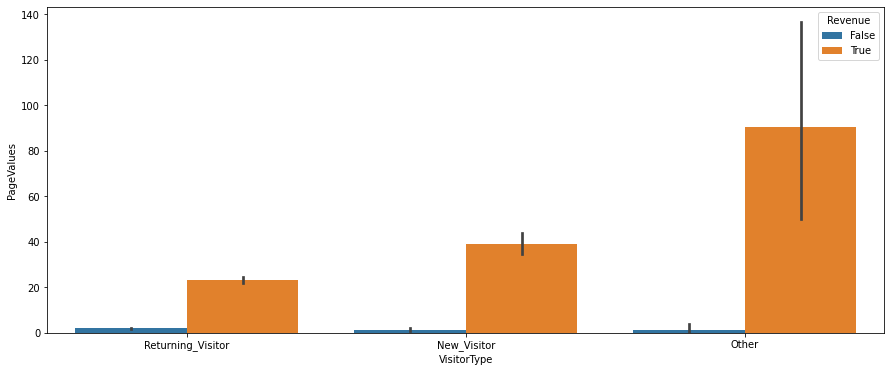

In [106]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='VisitorType', y='PageValues', hue='Revenue')
plt.show()

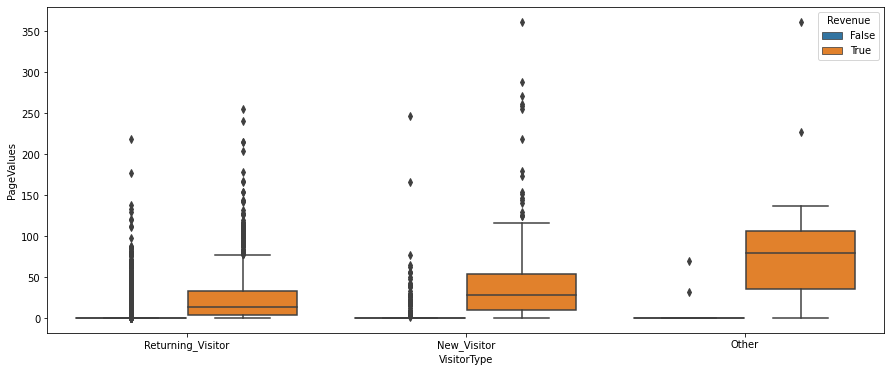

In [107]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, x='VisitorType', y='PageValues', hue='Revenue')
plt.show()

<AxesSubplot:xlabel='Revenue', ylabel='Administrative'>

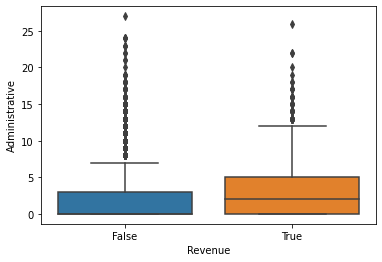

In [109]:
sns.boxplot(data=df, x='Revenue', y='Administrative')

<AxesSubplot:xlabel='TrafficType', ylabel='Administrative_Duration'>

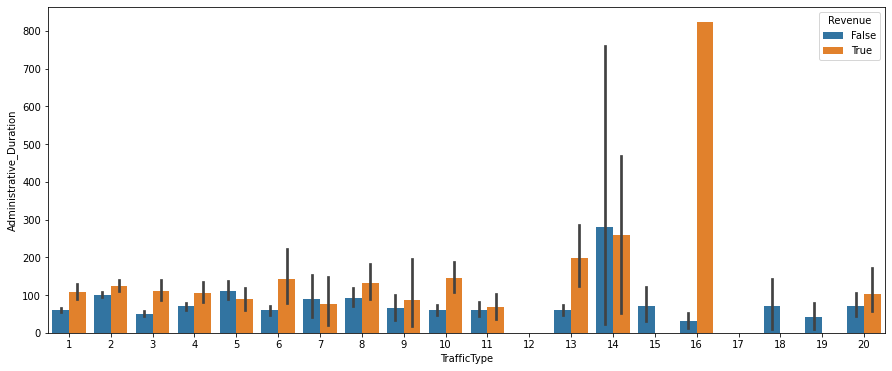

In [112]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='TrafficType', y='Administrative_Duration', hue='Revenue')

<AxesSubplot:xlabel='TrafficType', ylabel='Administrative_Duration'>

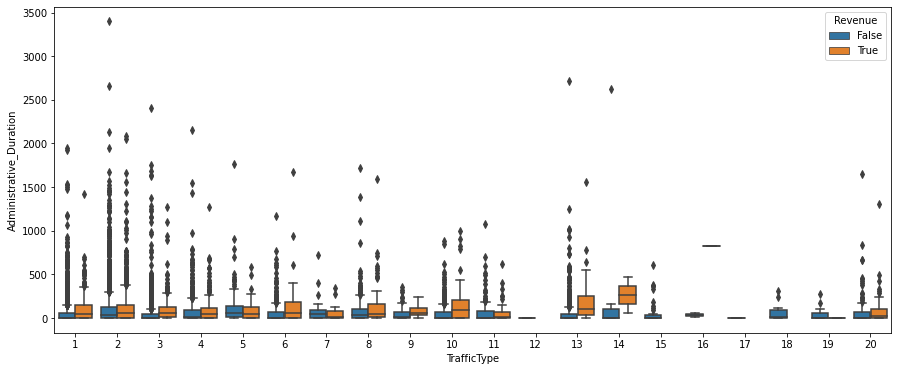

In [111]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, x='TrafficType', y='Administrative_Duration', hue='Revenue')

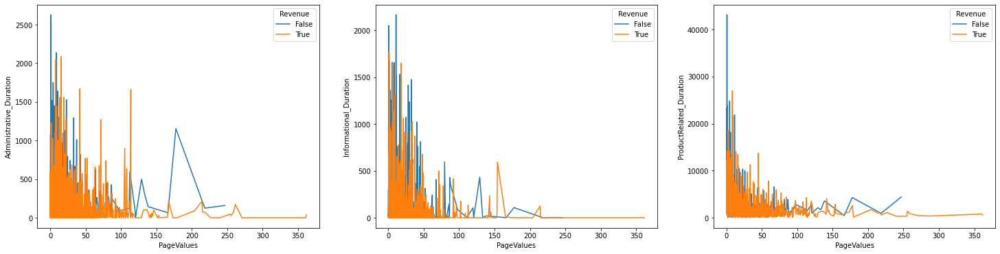

In [8]:
fig, ax = plt.subplots(1, 3, figsize=(25, 6))
sns.lineplot(data=df, x='PageValues', y='Administrative_Duration', hue='Revenue', ax=ax[0])
sns.lineplot(data=df, x='PageValues', y='Informational_Duration', hue='Revenue', ax=ax[1])
sns.lineplot(data=df, x='PageValues', y='ProductRelated_Duration', hue='Revenue', ax=ax[2])
plt.show()

In [5]:
df[(df["Administrative_Duration"] > 0) | (df["Administrative"] > 0)]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
7,1,0.00,0,0.0,0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,2,1,5,Returning_Visitor,True,False
15,2,53.00,0,0.0,23,1668.285119,0.008333,0.016313,0.000000,0.0,Feb,1,1,9,3,Returning_Visitor,False,False
26,4,64.60,0,0.0,32,1135.444444,0.002857,0.009524,0.000000,0.0,Feb,2,2,1,3,Returning_Visitor,False,False
29,1,6.00,1,0.0,45,1582.750000,0.043478,0.050821,54.179764,0.4,Feb,3,2,1,1,Returning_Visitor,False,False
37,2,18.00,0,0.0,5,298.000000,0.000000,0.028571,0.000000,0.8,Feb,2,2,8,4,Returning_Visitor,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12317,3,100.50,0,0.0,95,1453.640882,0.002105,0.012761,0.000000,0.0,Dec,2,2,3,2,New_Visitor,False,False
12322,6,76.25,0,0.0,22,1075.250000,0.000000,0.004167,0.000000,0.0,Dec,2,2,4,2,Returning_Visitor,False,False
12323,2,64.75,0,0.0,44,1157.976190,0.000000,0.013953,0.000000,0.0,Nov,2,2,1,10,Returning_Visitor,False,False
12325,3,145.00,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False


In [6]:
df[(df["Month"] == "Mar") | (df["Month"] == "May") | (df["Month"] == "Nov") | (df["Month"] == "Dec")]

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates in %,ExitRates in %,PageValues,SpecialDay (probability),Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
184,0,0.000000,16,1210.397619,5,279.857143,0.003175,0.012764,0.000000,0.0,Mar,2,2,1,8,Returning_Visitor,False,False
185,0,0.000000,0,0.000000,20,927.450000,0.011111,0.027249,8.000741,0.0,Mar,1,1,3,1,Returning_Visitor,False,False
186,2,9.000000,0,0.000000,50,836.800000,0.000000,0.006340,0.000000,0.0,Mar,2,2,3,2,Returning_Visitor,False,False
187,10,293.778205,2,153.000000,96,3283.166739,0.001961,0.013509,0.000000,0.0,Mar,3,2,6,2,Returning_Visitor,True,False
188,9,111.500000,1,48.500000,49,1868.819697,0.000000,0.020709,1.706015,0.0,Mar,2,2,7,2,Returning_Visitor,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.000000,0,0.000000,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.000000,0,0.000000,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.000000,0,0.000000,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.000000,0,0.000000,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


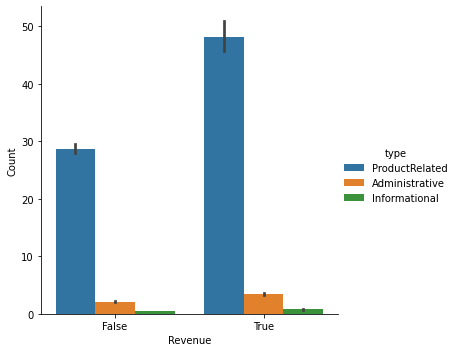

In [15]:
df1 = pd.melt(df[['ProductRelated','Administrative','Informational','Revenue']], id_vars='Revenue', var_name="type", value_name="Count")
df1
sns.catplot(x='Revenue', y='Count', hue='type', data=df1, kind='bar')
plt.savefig('barplot_webpage_vs_Revenue.png')

<AxesSubplot:xlabel='Administrative', ylabel='Administrative_Duration'>

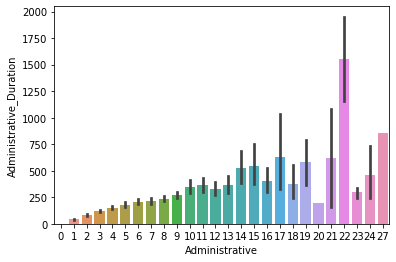

In [16]:
sns.barplot(data=df.loc[df['Revenue'] == False, :], x='Administrative', y='Administrative_Duration')

<AxesSubplot:xlabel='Revenue', ylabel='BounceRates in %'>

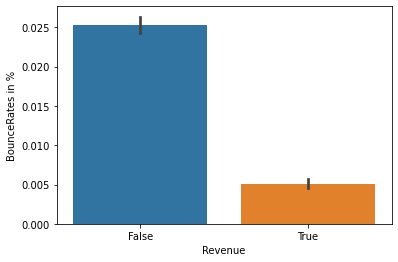

In [29]:
sns.barplot(data=df, y='BounceRates in %', x='Revenue')

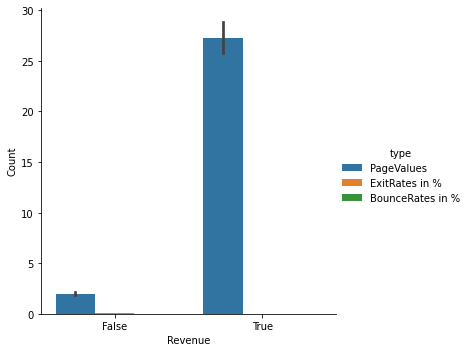

In [30]:
df1 = pd.melt(df[['PageValues', 'ExitRates in %','BounceRates in %','Revenue']], id_vars='Revenue', var_name="type", value_name="Count")
df1
sns.catplot(x='Revenue', y='Count', hue='type', data=df1, kind='bar')

<AxesSubplot:xlabel='TrafficType', ylabel='BounceRates in %'>

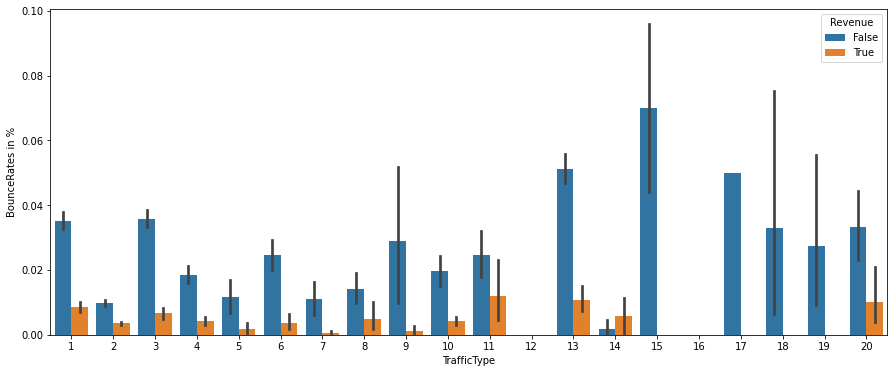

In [26]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df, x='TrafficType', y='BounceRates in %', hue='Revenue')

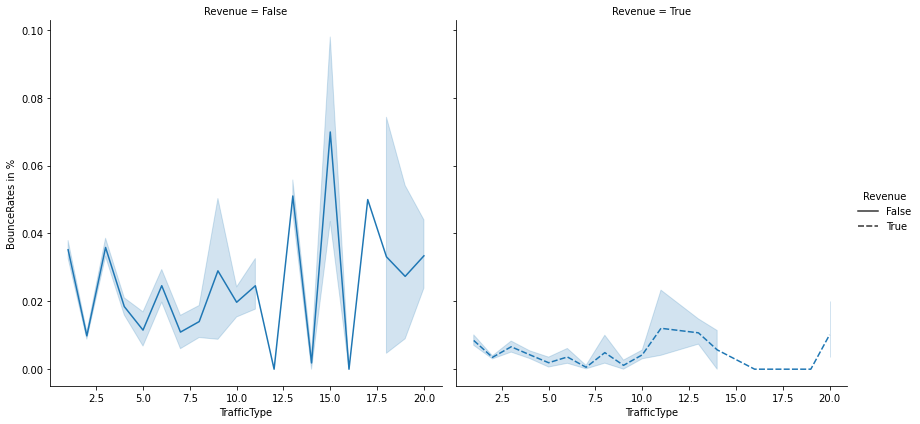

In [34]:
sns.relplot(data=df, x='TrafficType', y='BounceRates in %', col='Revenue', style='Revenue', height=6, kind='line')

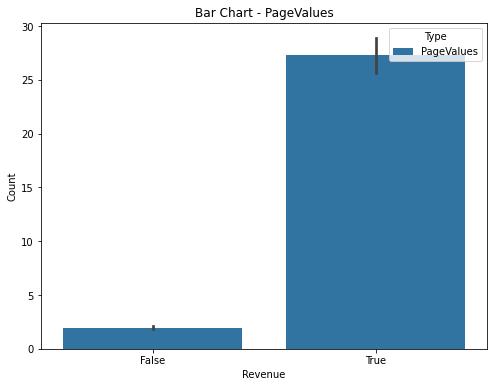

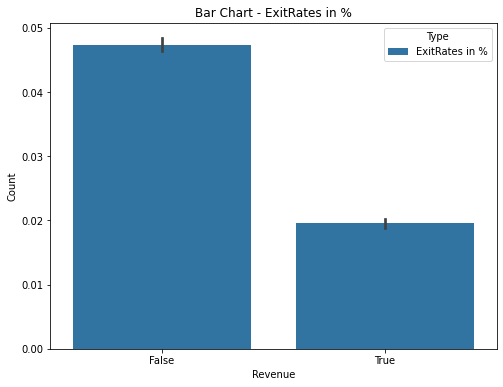

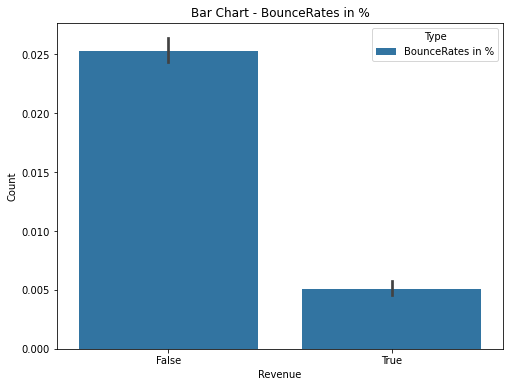

In [35]:
variables = ['PageValues', 'ExitRates in %', 'BounceRates in %']

for variable in variables:
    plt.figure(figsize=(8, 6))
    sns.barplot(x='Revenue', y='Count', hue='type', data=df1[df1['type'] == variable])
    plt.title(f'Bar Chart - {variable}')
    plt.xlabel('Revenue')
    plt.ylabel('Count')
    plt.legend(title='Type', loc='upper right')
    plt.show()


In [36]:
plt.figure(figsize=(12,5))
sns.kdeplot(df[df.Revenue == True].SpecialDay)
sns.kdeplot(df[df.Revenue == False].SpecialDay)
plt.ylabel('SpecialDay')
plt.legend(title='Revenue', loc='upper right', labels=['True', 'False'])

AttributeError: 'DataFrame' object has no attribute 'SpecialDay'

<Figure size 864x360 with 0 Axes>

In [4]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates in %', 'ExitRates in %', 'PageValues',
       'SpecialDay (probability)', 'Month', 'OperatingSystems', 'Browser',
       'Region', 'TrafficType', 'VisitorType', 'Weekend', 'Revenue'],
      dtype='object')

In [ ]:
for col in ['SpecialDay (probability)', 'Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType']

<AxesSubplot:xlabel='VisitorType', ylabel='count'>

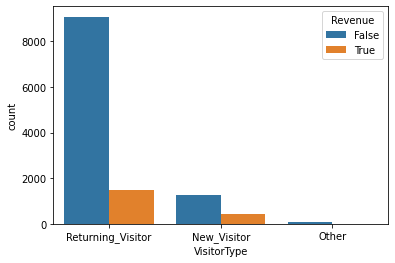

In [3]:
sns.countplot(data=df, x='VisitorType', hue='Revenue')

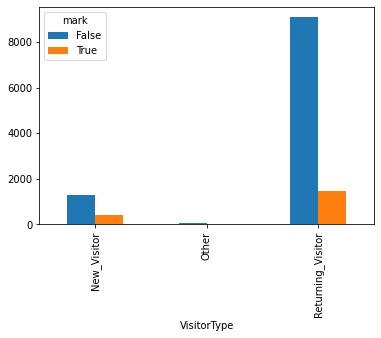

In [12]:
ct = pd.crosstab(df.VisitorType, df.Revenue)
ct.plot.bar()
plt.legend(title='mark')
plt.savefig('visitor_type_vs_revenue.png')

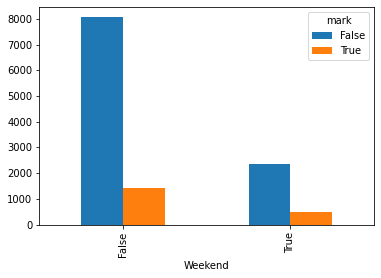

In [14]:
ct1 = pd.crosstab(df.Weekend,df.Revenue)
ct1.plot.bar()
plt.legend(title='mark')
plt.savefig('weekend_vs_revenue.png')

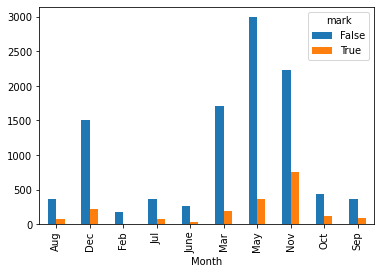

In [16]:
ct2 = pd.crosstab(df.Month,df.Revenue)
ct2.plot.bar()
plt.legend(title='mark')
plt.savefig('Month_vs_revenue.png')

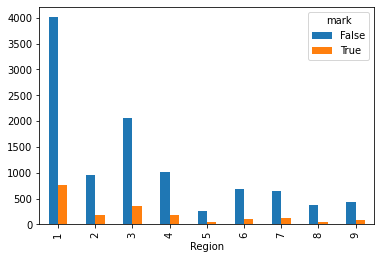

In [15]:
ct4 = pd.crosstab(df.Region,df.Revenue)
ct4.plot.bar()
plt.legend(title='mark')
plt.savefig('Region_vs_revenue.png')

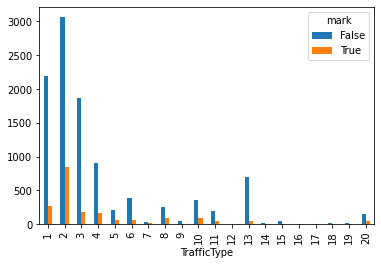

In [17]:
ct5 = pd.crosstab(df.TrafficType,df.Revenue)
ct5.plot.bar()
plt.legend(title='mark')
plt.savefig('TrafficType_vs_revenue.png')

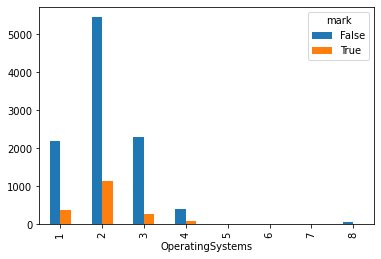

In [18]:
ct6 = pd.crosstab(df.OperatingSystems,df.Revenue)
ct6.plot.bar()
plt.legend(title='mark')
plt.savefig('OperatingSystems_vs_revenue.png')

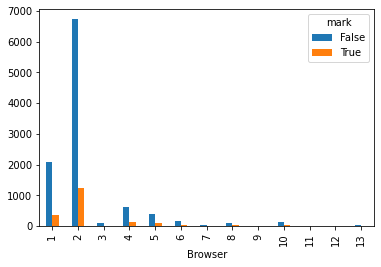

In [19]:
ct7 = pd.crosstab(df.Browser,df.Revenue)
ct7.plot.bar()
plt.legend(title='mark')
plt.savefig('Browser_vs_revenue.png')

In [24]:
sns.pairplot(data=df[['Browser', 'Region']], hue=df['Revenue'])

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

<BarContainer object of 12330 artists>

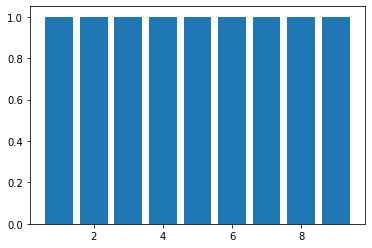

In [22]:
plt.bar(df['Region'], df['Revenue'])

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Administrative            12330 non-null  int64  
 1   Administrative_Duration   12330 non-null  float64
 2   Informational             12330 non-null  int64  
 3   Informational_Duration    12330 non-null  float64
 4   ProductRelated            12330 non-null  int64  
 5   ProductRelated_Duration   12330 non-null  float64
 6   BounceRates in %          12330 non-null  float64
 7   ExitRates in %            12330 non-null  float64
 8   PageValues                12330 non-null  float64
 9   SpecialDay (probability)  12330 non-null  float64
 10  Month                     12330 non-null  object 
 11  OperatingSystems          12330 non-null  int64  
 12  Browser                   12330 non-null  int64  
 13  Region                    12330 non-null  int64  
 14  Traffi

In [41]:
from random import randint

In [43]:
colors = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap',
          'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 
          'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 
          'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 
          'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 
          'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu',
           'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 
          'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 
          'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 
          'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 
          'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 
          'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 
          'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r',
          'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 
          'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 
          'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 
          'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']

In [34]:
df['Revenue'] = df['Revenue'].astype('int64')
df['Weekend'] = df['Weekend'].astype('int64')

In [45]:
df.shape

(12330, 18)

In [35]:
df['VisitorType'] = pd.factorize(df['VisitorType'])[0]
df['Month'] = pd.factorize(df['Month'])[0]

In [38]:
positive_corr = df.corrwith(df["Revenue"]).sort_values(ascending=False)[:30].index.tolist()
negative_corr = df.corrwith(df["Revenue"]).sort_values()[:30].index.tolist()

positive_corr = df[positive_corr + ["Revenue"]].copy()
negative_corr = df[negative_corr + ["Revenue"]].copy()

In [46]:
def corrbargraph(x_value, y_value):
    
    plt.figure(figsize=(30,35))
    value = randint(0, len(colors)-1)

    for i in range(1,18):
        plt.subplot(10,3,i)  
        sns.barplot(x=x_value, y=y_value[i-1], data=df, palette=colors[value])

    plt.tight_layout(pad=2.5)

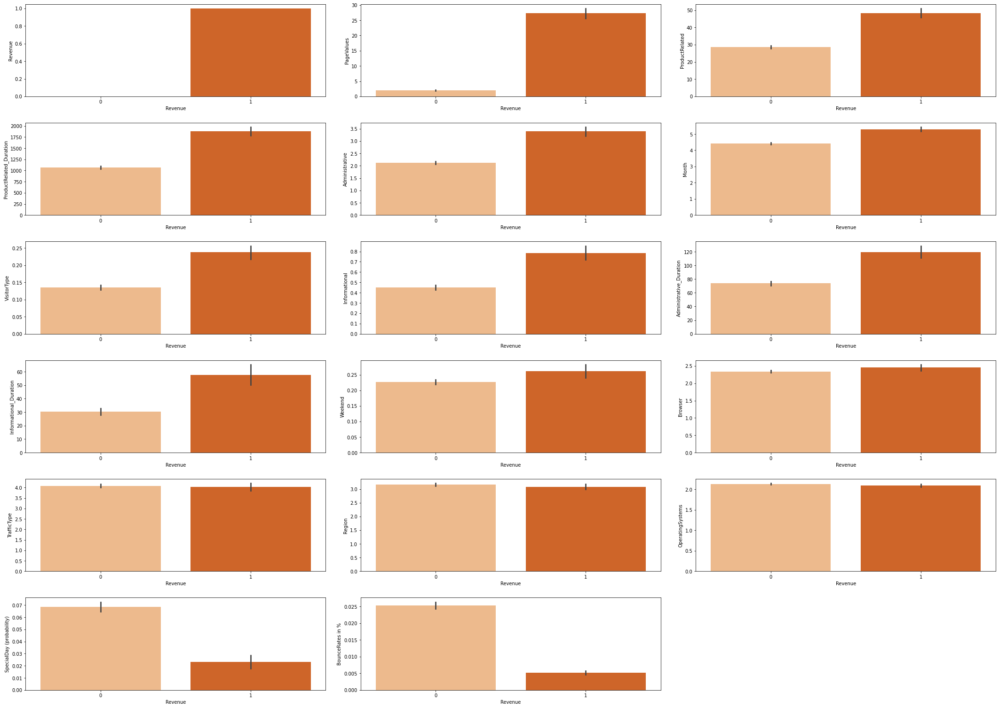

In [47]:
x_value = positive_corr.columns.tolist()[-1]
y_value = positive_corr.columns.tolist()[:-1]

corrbargraph(x_value, y_value)